# Проект "Предсказание оттока клиентов из телекоммуникационной компании"

## Описание проекта  и данных

Оператору связи необходимо научиться прогнозировать отток клиентов. Если выяснится, что пользователь планирует уйти, ему будут предложены промокоды и специальные условия. 

- Командой оператора были собраны следующие данные:
  - contract_new.csv — информация о договоре:
    - BeginDate – дата начала пользования услугами;
    - EndDate – дата окончания пользования услугами;
    - Type – тип договора: ежемесячный, годовой и т.д.;
    - PaperlessBilling – выставления счёта по электронной почте;
    - PaymentMethod – способ оплаты;
    - MonthlyCharges – ежемесячные траты на услуги;
    - TotalCharges – всего потрачено денег на услуги;
  - personal_new.csv — обезличенные персональные данные клиента:
    - gender – пол;
    - SeniorCitizen – пенсионный статус по возрасту;
    - Partner – наличие супруга/супруги;
    - Dependents – наличие иждивенцев;
  - internet_new.csv — информация об интернет-услугах:
    - InternetService – наличие услуг Интернет;
    - OnlineSecurity – межсетевой экран;
    - OnlineBackup – облачное хранилище резервного копирования данных;
    - DeviceProtection – антивирус;
    - TechSupport – выделенная линия поддержки;
    - StreamingTV – онлайн-ТВ;
    - StreamingMovies – онлайн-кинотеатр;
  - phone_new.csv — информация об услугах телефонии:
    - MultipleLines – возможность подключения телефонного аппарата к нескольким линиям одновременно;
- Информация о договорах актуальна на 1 февраля 2020;
- Стоит задача бинарной классификации: 1 - клиент ушел, 0 - клиент не ушел;
- Бизнес-метрикой является снижение убытков, связанных с неэффективными акциями по удержанию клиентов с помощью промо-купонов, скидок и прочих пакетов стимулирования. Маркетологами компании выделены две болевые точки:
  1) Пользователю предложили промокоды, но он не собирался уходить (False Positive);
  2) Пользователю ничего не предложили и он ушёл (False Negative);
- Метрикой машинного обучения будем использовать ROC-AUC для выдерживания баланса между False Positive и False Negative:
  - Минимальный порог хорошей модели: ROC-AUC >= 0.85 на тестовой выборке;
- После разработки модели заказчику необходимо получить интерпретацию её работы:
  - Дополнительную метрику машинного обучения accuracy;
  - График ROC; 
  - Матрицу ошибок; 
  - Важность признаков;

## План работы
- Шаг 1:
  1) Загрузка данных и первичный анализ;
  2) Обработка данных:
     - Объединение данных в единый датасет;
     - Выделение целевого признака;
     - Изменение типов данных;
     - Обработка пропусков в данных;      
  3) Исследовательский анализ данных EDA:
     - Анализ количественных признаков;
     - Анализ категориальных признаков в разрезе целевой переменной;
  4) Промежуточные выводы по шагу 1;
- Шаг 2:
  1) Проверка корреляции:
     - Проверка корреляции с целевой переменной;
     - Пророверка наличия мультиколлинеарности признаков;
     - Предотвращение мультиколлинеарности;
     - Отбор признаков;
  2) Разбиение выборки на train и test в соотношении 3:1 со стратификацией и перемешиванием;
  3) Масштабирование численных и кодирование категориальных признаков:
     - Для линейных моделей будем использовать OHE;
     - Для деревянных моделей Ordinal Encoder;
  4) Обучение моделей:
     - Линейные модели:
       - LogisticRegression;
       - Метод опорных векторов SVC;
     - Деревянные модели:
       - RandomForestClassifier;
     - Модели градиентного бустинга:
       - LightGBM;
       - CatBoost;
  5) Выбор одной лучшей модели по метрике ROC-AUC на кросс-валидации (целевое значение не меньше 0.85);
  6) Проверка и интерпретация лучшей модели на тестовой выборке:
     - При помощи predict_proba проверка модели по метрике ROC-AUC;
     - Построение графика кривой ROC;
     - Анализ дополнительной метрики accuracy;
     - Построение матрицы ошибок и ее анализ;
     - Анализ важности признаков выбранной модели;
  7) Выводы по шагу 2;
- Шаг 3:
  1) Общие выводы;
  2) Выводы по модели;
  3) Отчет о проделанной работе;

In [113]:
#!pip install skimpy

In [114]:
#! pip install phik

In [115]:
#pip install plotly==5.9.0

In [116]:
#pip install boruta

In [117]:
#pip install sklearndf

In [118]:
#pip install optuna

In [119]:
#pip install catboost

## 1.1 Загрузка данных и первичный анализ

In [8]:
import warnings

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

import plotly.express as px
import phik
import optuna
import catboost as cat
import lightgbm as lgb
import optuna.logging as logging

from skimpy import clean_columns
from phik.report import plot_correlation_matrix
from phik import report
from statsmodels.stats.outliers_influence import variance_inflation_factor
from boruta import BorutaPy
from sklearn.dummy import DummyClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier
from sklearn.compose import make_column_transformer
from sklearndf.transformation.extra import BorutaDF
from sklearn.preprocessing import (
    StandardScaler, 
    RobustScaler, 
    OneHotEncoder, 
    OrdinalEncoder
)
from sklearn.pipeline import (
    Pipeline, 
    make_pipeline, 
    FeatureUnion
) 
from sklearn import model_selection
from sklearn.model_selection import (
    train_test_split, 
    cross_val_score, 
    StratifiedKFold
)
from catboost import Pool, cv
from sklearn.metrics import (
    roc_auc_score,
    accuracy_score,
    f1_score,
    recall_score, 
    precision_score,
    confusion_matrix,
    ConfusionMatrixDisplay,
    roc_curve, 
    auc
)

warnings.filterwarnings("ignore")
pd.set_option('display.float_format', '{:,.2f}'.format)
pd.set_option('display.max_columns', None)
optuna.logging.set_verbosity(optuna.logging.WARNING)
logging.disable_default_handler()

RANDOM = 170723 

In [9]:
try:
    contract = pd.read_csv('/Users/Elena/Desktop/Учеба/Выпускной проект/Телекоммуникации/contract_new.csv')
    internet = pd.read_csv('/Users/Elena/Desktop/Учеба/Выпускной проект/Телекоммуникации/internet_new.csv')
    personal = pd.read_csv('/Users/Elena/Desktop/Учеба/Выпускной проект/Телекоммуникации/personal_new.csv')
    phone = pd.read_csv('/Users/Elena/Desktop/Учеба/Выпускной проект/Телекоммуникации/phone_new.csv')
except:
    contract = pd.read_csv('https://code.s3.yandex.net/datasets/contract_new.csv')
    internet = pd.read_csv('https://code.s3.yandex.net/datasets/internet_new.csv')
    personal = pd.read_csv('https://code.s3.yandex.net/datasets/personal_new.csv')
    phone = pd.read_csv('https://code.s3.yandex.net/datasets/phone_new.csv')

In [10]:
# приведем названия столбцов датафреймов к snake_case в соответствии с PEP8
dfs = [contract, internet, personal, phone]
for i in range(len(dfs)):
    dfs[i] = clean_columns(dfs[i])

contract, internet, personal, phone = dfs

In [11]:
def df_research(data):
    """
    Функция исследования данных таблицы: 
    выводит 5 случайных строк, информацию, описание, количество явных дубликатов, 
    количество пропусков, количество уникальных значений в столбцах
    """
    print('Случайные строки датафрейма:')
    display(data.sample(n=5, random_state = RANDOM))
    print('\nИнформация о датафрейме:')
    data.info()
    print('\nОписание данных датафрейма:')
    display(data.describe())
    print('\nКоличество явных дубликатов:', data.duplicated().sum())
    print('\nКоличество пропусков:\n', data.isna().sum())
    print('\nКоличество уникальных значений:\n', data.nunique())

Так как в последующих шагах мы объединим таблицы, то создадим множество с названиями столбцов, чтобы после проверить успешность объединения таблиц (класс set автоматически удаляет дубликаты, следовательно останутся только уникальные названия столбцов).

In [12]:
columns_set = set()

### 1.1.1 Датафрейм contract

In [13]:
df_research(contract)

Случайные строки датафрейма:


,customer_id,begin_date,end_date,type,paperless_billing,payment_method,monthly_charges,total_charges
5010,3654-ARMGP,2015-01-01,No,Two year,No,Credit card (automatic),88.65,5678.03
1283,4389-UEFCZ,2014-02-01,No,Two year,Yes,Electronic check,105.50,7596.0
2287,5440-FLBQG,2014-02-01,2016-06-01,Two year,Yes,Bank transfer (automatic),108.40,3035.2
2820,3251-YMVWZ,2015-09-01,No,One year,No,Bank transfer (automatic),24.05,1389.37
4071,6537-QLGEX,2018-10-01,No,Month-to-month,Yes,Electronic check,38.90,622.4



Информация о датафрейме:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 8 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   customer_id        7043 non-null   object 
 1   begin_date         7043 non-null   object 
 2   end_date           7043 non-null   object 
 3   type               7043 non-null   object 
 4   paperless_billing  7043 non-null   object 
 5   payment_method     7043 non-null   object 
 6   monthly_charges    7043 non-null   float64
 7   total_charges      7043 non-null   object 
dtypes: float64(1), object(7)
memory usage: 440.3+ KB

Описание данных датафрейма:


,monthly_charges
count,"7,043.00"
mean,64.76
std,30.09
min,18.25
25%,35.50
50%,70.35
75%,89.85
max,118.75



Количество явных дубликатов: 0

Количество пропусков:
 customer_id          0
begin_date           0
end_date             0
type                 0
paperless_billing    0
payment_method       0
monthly_charges      0
total_charges        0
dtype: int64

Количество уникальных значений:
 customer_id          7043
begin_date             77
end_date               67
type                    3
paperless_billing       2
payment_method          4
monthly_charges      1585
total_charges        6658
dtype: int64


In [14]:
contract['end_date'].value_counts(ascending=False)

end_date
No            5942
2020-01-01      39
2019-12-01      38
2018-11-01      35
2019-09-01      32
              ... 
2014-09-01       2
2014-12-01       2
2014-06-01       1
2014-10-01       1
2014-11-01       1
Name: count, Length: 67, dtype: int64

In [15]:
# Сохраним названия столбцов таблицы contract во множество
columns_set.update(contract.columns.tolist())

В датафрейме contract:
- 8 столбцов, 7043 строки;
- Пропуски отсутствуют;
- Явные дубликаты отсутствуют;
- Типы данных в столбцах требуют преобразований:
  - begin_date из object в date;
  - end_date из object в date;
  - total_charges из object в float64;
- В end_date видим значения No (5942 значения). Можем предположить, если дата окончания пользования услугами отсутствует, то клиент продолжает пользоваться услугами - это целевой признак;

### 1.1.2 Датафрейм internet

In [16]:
df_research(internet)

Случайные строки датафрейма:


,customer_id,internet_service,online_security,online_backup,device_protection,tech_support,streaming_tv,streaming_movies
5347,8930-XOTDP,DSL,No,No,No,No,Yes,No
673,0727-BMPLR,Fiber optic,No,No,Yes,No,Yes,Yes
4260,5959-BELXA,Fiber optic,No,No,No,No,Yes,Yes
1190,4472-VESGY,Fiber optic,Yes,Yes,Yes,No,No,Yes
4954,9661-MHUMO,DSL,No,No,No,Yes,No,No



Информация о датафрейме:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5517 entries, 0 to 5516
Data columns (total 8 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   customer_id        5517 non-null   object
 1   internet_service   5517 non-null   object
 2   online_security    5517 non-null   object
 3   online_backup      5517 non-null   object
 4   device_protection  5517 non-null   object
 5   tech_support       5517 non-null   object
 6   streaming_tv       5517 non-null   object
 7   streaming_movies   5517 non-null   object
dtypes: object(8)
memory usage: 344.9+ KB

Описание данных датафрейма:


,customer_id,internet_service,online_security,online_backup,device_protection,tech_support,streaming_tv,streaming_movies
count,5517,5517,5517,5517,5517,5517,5517,5517
unique,5517,2,2,2,2,2,2,2
top,7590-VHVEG,Fiber optic,No,No,No,No,No,No
freq,1,3096,3498,3088,3095,3473,2810,2785



Количество явных дубликатов: 0

Количество пропусков:
 customer_id          0
internet_service     0
online_security      0
online_backup        0
device_protection    0
tech_support         0
streaming_tv         0
streaming_movies     0
dtype: int64

Количество уникальных значений:
 customer_id          5517
internet_service        2
online_security         2
online_backup           2
device_protection       2
tech_support            2
streaming_tv            2
streaming_movies        2
dtype: int64


In [17]:
# Сохраняем названия столбцов таблицы internet в список
columns_set.update(internet.columns.tolist())

В датафрейме internet:
- 8 столбцов, 5517 строк;
- Пропуски отсутствуют;
- Явные дубликаты отсутствуют;
- Типы данных в столбцах не требуют преобразований;

### 1.1.3 Датафрейм personal

In [18]:
df_research(personal)

Случайные строки датафрейма:


,customer_id,gender,senior_citizen,partner,dependents
5010,3654-ARMGP,Female,0,No,No
1283,4389-UEFCZ,Female,0,Yes,No
2287,5440-FLBQG,Male,1,Yes,No
2820,3251-YMVWZ,Male,0,No,No
4071,6537-QLGEX,Female,0,No,No



Информация о датафрейме:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 5 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   customer_id     7043 non-null   object
 1   gender          7043 non-null   object
 2   senior_citizen  7043 non-null   int64 
 3   partner         7043 non-null   object
 4   dependents      7043 non-null   object
dtypes: int64(1), object(4)
memory usage: 275.2+ KB

Описание данных датафрейма:


,senior_citizen
count,"7,043.00"
mean,0.16
std,0.37
min,0.00
25%,0.00
50%,0.00
75%,0.00
max,1.00



Количество явных дубликатов: 0

Количество пропусков:
 customer_id       0
gender            0
senior_citizen    0
partner           0
dependents        0
dtype: int64

Количество уникальных значений:
 customer_id       7043
gender               2
senior_citizen       2
partner              2
dependents           2
dtype: int64


In [19]:
# Сохраняем названия столбцов таблицы personal в список
columns_set.update(personal.columns.tolist())

В датафрейме personal:
- 5 столбцов, 7043 строк;
- Пропуски отсутствуют;
- Явные дубликаты отсутствуют;
- Изменим тип данных в столбце senior_citizen на object для удобства дальнейшего анализа (0 на No, 1 на Yes);

In [20]:
personal['senior_citizen'] = personal['senior_citizen'].replace({0: 'No', 1: 'Yes'})

In [21]:
personal['senior_citizen'].value_counts(dropna=False)

senior_citizen
No     5901
Yes    1142
Name: count, dtype: int64

In [22]:
personal.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 5 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   customer_id     7043 non-null   object
 1   gender          7043 non-null   object
 2   senior_citizen  7043 non-null   object
 3   partner         7043 non-null   object
 4   dependents      7043 non-null   object
dtypes: object(5)
memory usage: 275.2+ KB


### 1.1.4 Датафрейм phone

In [23]:
df_research(phone)

Случайные строки датафрейма:


,customer_id,multiple_lines
4802,2144-BFDSO,Yes
2398,3130-ICDUP,Yes
8,7469-LKBCI,No
6007,4816-OKWNX,No
3013,2195-VVRJF,No



Информация о датафрейме:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6361 entries, 0 to 6360
Data columns (total 2 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   customer_id     6361 non-null   object
 1   multiple_lines  6361 non-null   object
dtypes: object(2)
memory usage: 99.5+ KB

Описание данных датафрейма:


,customer_id,multiple_lines
count,6361,6361
unique,6361,2
top,5575-GNVDE,No
freq,1,3390



Количество явных дубликатов: 0

Количество пропусков:
 customer_id       0
multiple_lines    0
dtype: int64

Количество уникальных значений:
 customer_id       6361
multiple_lines       2
dtype: int64


In [24]:
# Сохраняем названия столбцов таблицы phone в список
columns_set.update(phone.columns.tolist())

В датафрейме phone:
- 2 столбца, 6361 строк;
- Пропуски отсутствуют;
- Явные дубликаты отсутствуют;
- Типы данных в столбцах не требуют преобразований;

## 1.2 Первичная обработка данных

### 1.2.1 Объединение датафреймов

Объединим четыре таблицы (contract, internet, personal, phone) по столбцу customer_id с использованием операции объединения "left" (все строки из таблицы contract будут сохранены в результирующей таблице, а соответствующие строки из других таблиц будут добавлены, если есть совпадение по значению customer_id. Если совпадений нет, то в результирующей таблице будут пропущенные значения для этих строк). Результатом будет новая таблица df, в которой будут содержаться данные из всех четырех исходных таблиц.

In [25]:
df = contract \
    .merge(internet, how='left', on='customer_id') \
    .merge(personal, how='left', on='customer_id') \
    .merge(phone, how='left', on='customer_id') 

In [26]:
df_1 = df.copy()

In [27]:
# Проверим успешность выполнения
df_set = set(df.columns)

if columns_set == df_set:
    print("Множества совпадают, объединение таблиц прошло успешно.")
else:
    print("Множества не совпадают, объединение таблиц провалилось.")

Множества совпадают, объединение таблиц прошло успешно.


### 1.2.2 Выделение целевого признака

Добавим целевой признак churn, который будет означать, отказался клиент от услуг оператора или нет. Как мы выяснили ранее, если в столбце end_date указано значение No, то клиент продолжает польтзоваться услугами оператора. Соответственно, No будет означать 0 (клиент не ушел), а имеющаяся дата окончания будет означать 1 (клиент отказался от услуг).

In [28]:
def convert_churn_value(value):
    if value == 'No':
        return 0
    else:
        return 1
    
df['churn'] = df['end_date'].apply(lambda x: convert_churn_value(x))
df.head()

,customer_id,begin_date,end_date,type,paperless_billing,payment_method,monthly_charges,total_charges,internet_service,online_security,online_backup,device_protection,tech_support,streaming_tv,streaming_movies,gender,senior_citizen,partner,dependents,multiple_lines,churn
0,7590-VHVEG,2020-01-01,No,Month-to-month,Yes,Electronic check,29.85,31.04,DSL,No,Yes,No,No,No,No,Female,No,Yes,No,NaN,0
1,5575-GNVDE,2017-04-01,No,One year,No,Mailed check,56.95,2071.84,DSL,Yes,No,Yes,No,No,No,Male,No,No,No,No,0
2,3668-QPYBK,2019-10-01,No,Month-to-month,Yes,Mailed check,53.85,226.17,DSL,Yes,Yes,No,No,No,No,Male,No,No,No,No,0
3,7795-CFOCW,2016-05-01,No,One year,No,Bank transfer (automatic),42.30,1960.6,DSL,Yes,No,Yes,Yes,No,No,Male,No,No,No,NaN,0
4,9237-HQITU,2019-09-01,No,Month-to-month,Yes,Electronic check,70.70,353.5,Fiber optic,No,No,No,No,No,No,Female,No,No,No,No,0


In [29]:
# Посмотрим на баланс классов
df['churn'].value_counts(dropna=False, normalize=True)

churn
0   0.84
1   0.16
Name: proportion, dtype: float64

Присутствует дисбаланс классов, объектов отрицательного класса (84%) в 5 с лишним раз больше объектов положительного класса (16%).

### 1.2.3 Изменение типов данных

In [30]:
# В столбце end_date заменим значения 'No' на дату выгрузки датасета '2020-02-01'
df['end_date'] = df['end_date'].replace('No', '2020-02-01')
print('Количество значений "No" в столбце end_date:', (df['end_date'] == 'No').sum())

Количество значений "No" в столбце end_date: 0


In [31]:
# Изменим тип данных в столбце total_charges из object на float64
df['total_charges'] = pd.to_numeric(df['total_charges'], errors='coerce')

# Изменим тип данных в столбце begin_date из object на date
df['begin_date'] = pd.to_datetime(df['begin_date'], format='%Y-%m-%d')

# Изменим тип данных в столбце end_date из object на date
df['end_date'] = pd.to_datetime(df['end_date'], format='%Y-%m-%d')

In [32]:
# Проверим успешность выполнения
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 21 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   customer_id        7043 non-null   object        
 1   begin_date         7043 non-null   datetime64[ns]
 2   end_date           7043 non-null   datetime64[ns]
 3   type               7043 non-null   object        
 4   paperless_billing  7043 non-null   object        
 5   payment_method     7043 non-null   object        
 6   monthly_charges    7043 non-null   float64       
 7   total_charges      7032 non-null   float64       
 8   internet_service   5517 non-null   object        
 9   online_security    5517 non-null   object        
 10  online_backup      5517 non-null   object        
 11  device_protection  5517 non-null   object        
 12  tech_support       5517 non-null   object        
 13  streaming_tv       5517 non-null   object        
 14  streamin

In [33]:
# Добавим столбец duration, который будет содержать разницу между датами начала и окончания пользования услугами
df['duration'] = (df['end_date'] - df['begin_date']).dt.days

In [34]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 22 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   customer_id        7043 non-null   object        
 1   begin_date         7043 non-null   datetime64[ns]
 2   end_date           7043 non-null   datetime64[ns]
 3   type               7043 non-null   object        
 4   paperless_billing  7043 non-null   object        
 5   payment_method     7043 non-null   object        
 6   monthly_charges    7043 non-null   float64       
 7   total_charges      7032 non-null   float64       
 8   internet_service   5517 non-null   object        
 9   online_security    5517 non-null   object        
 10  online_backup      5517 non-null   object        
 11  device_protection  5517 non-null   object        
 12  tech_support       5517 non-null   object        
 13  streaming_tv       5517 non-null   object        
 14  streamin

Можно заметить, что в данных появились пропуски. Обработаем их.

### 1.2.4 Обработка пропусков

In [35]:
# Рассмотрим количество пропусков в каждом из столбцов
df.isna().sum().sort_values(ascending=False)

device_protection    1526
streaming_movies     1526
internet_service     1526
online_security      1526
online_backup        1526
tech_support         1526
streaming_tv         1526
multiple_lines        682
total_charges          11
churn                   0
dependents              0
partner                 0
senior_citizen          0
gender                  0
customer_id             0
begin_date              0
monthly_charges         0
payment_method          0
paperless_billing       0
type                    0
end_date                0
duration                0
dtype: int64

- Для признаков device_protection, streaming_movies, internet_service, online_security, online_backup, tech_support, streaming_tv, multiple_lines имеется только два значения: Yes и No. Предположим, что раз значение не указано, то услуга не подключена. Заменим пропуски на 'No';

- Пропуски в total_charges рассмотрим подробнее;

In [36]:
# Список столбцов для проверки
cols = [
    'device_protection', 
    'streaming_movies', 
    'online_security', 
    'online_backup', 
    'tech_support', 
    'streaming_tv'
]

# Создание булевого массива, где True указывает на пропущенные значения в столбце internet_service
internet_service_na = df['internet_service'].isna()

# Проверка соответствия индексов пропущенных строк в каждом столбце
for column in cols:
    # Создание булевого массива, где True указывает на пропущенные значения в текущем столбце
    column_na = df[column].isna()
    # Сравнение булевых массивов для проверки соответствия индексов пропущенных строк
    index_match = (internet_service_na == column_na)
    # Вывод индексов пропущенных строк, где соответствие не найдено
    print(f'Столбец {column}:')
    print(df[index_match == False].index)
    print()

Столбец device_protection:
Index([], dtype='int64')

Столбец streaming_movies:
Index([], dtype='int64')

Столбец online_security:
Index([], dtype='int64')

Столбец online_backup:
Index([], dtype='int64')

Столбец tech_support:
Index([], dtype='int64')

Столбец streaming_tv:
Index([], dtype='int64')



Вывод пустой, соответствие индексов найдено для всех строк: это означает, что у клиентов, у которых отсутствуют пакеты услуг из cols, не подключен интернет от оператора.

In [37]:
display(df[df['total_charges'].isna()])

,customer_id,begin_date,end_date,type,paperless_billing,payment_method,monthly_charges,total_charges,internet_service,online_security,online_backup,device_protection,tech_support,streaming_tv,streaming_movies,gender,senior_citizen,partner,dependents,multiple_lines,churn,duration
488,4472-LVYGI,2020-02-01,2020-02-01,Two year,Yes,Bank transfer (automatic),52.55,NaN,DSL,Yes,No,Yes,Yes,Yes,No,Female,No,Yes,Yes,NaN,0,0
753,3115-CZMZD,2020-02-01,2020-02-01,Two year,No,Mailed check,20.25,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Male,No,No,Yes,No,0,0
936,5709-LVOEQ,2020-02-01,2020-02-01,Two year,No,Mailed check,80.85,NaN,DSL,Yes,Yes,Yes,No,Yes,Yes,Female,No,Yes,Yes,No,0,0
1082,4367-NUYAO,2020-02-01,2020-02-01,Two year,No,Mailed check,25.75,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Male,No,Yes,Yes,Yes,0,0
1340,1371-DWPAZ,2020-02-01,2020-02-01,Two year,No,Credit card (automatic),56.05,NaN,DSL,Yes,Yes,Yes,Yes,Yes,No,Female,No,Yes,Yes,NaN,0,0
3331,7644-OMVMY,2020-02-01,2020-02-01,Two year,No,Mailed check,19.85,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Male,No,Yes,Yes,No,0,0
3826,3213-VVOLG,2020-02-01,2020-02-01,Two year,No,Mailed check,25.35,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Male,No,Yes,Yes,Yes,0,0
4380,2520-SGTTA,2020-02-01,2020-02-01,Two year,No,Mailed check,20.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Female,No,Yes,Yes,No,0,0
5218,2923-ARZLG,2020-02-01,2020-02-01,One year,Yes,Mailed check,19.70,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Male,No,Yes,Yes,No,0,0
6670,4075-WKNIU,2020-02-01,2020-02-01,Two year,No,Mailed check,73.35,NaN,DSL,No,Yes,Yes,Yes,Yes,No,Female,No,Yes,Yes,Yes,0,0


Как мы видим, пропуски в total_charges у клиентов, которые начали пользоваться услугами оператора 2020-02-01, то есть новички. Вполне возможно, что их общие траты не были еще зафиксированы (у многих метод оплаты - чек, отправляемый почтой), поэтому заполним пропуски соответствующими значениями из столбца monthly_charges.

In [38]:
df['total_charges'] = df['total_charges'].fillna(df['monthly_charges'])
df.isna().sum().sort_values(ascending=False)

device_protection    1526
streaming_tv         1526
internet_service     1526
online_security      1526
online_backup        1526
streaming_movies     1526
tech_support         1526
multiple_lines        682
churn                   0
dependents              0
partner                 0
senior_citizen          0
gender                  0
customer_id             0
begin_date              0
total_charges           0
monthly_charges         0
payment_method          0
paperless_billing       0
type                    0
end_date                0
duration                0
dtype: int64

In [39]:
# проверим
df[df['customer_id'] == '4075-WKNIU']

,customer_id,begin_date,end_date,type,paperless_billing,payment_method,monthly_charges,total_charges,internet_service,online_security,online_backup,device_protection,tech_support,streaming_tv,streaming_movies,gender,senior_citizen,partner,dependents,multiple_lines,churn,duration
6670,4075-WKNIU,2020-02-01,2020-02-01,Two year,No,Mailed check,73.35,73.35,DSL,No,Yes,Yes,Yes,Yes,No,Female,No,Yes,Yes,Yes,0,0


In [40]:
# Заменим пропуски в multiple_lines и internet_service на No
for c in ['multiple_lines', 'internet_service']:
    df[c] = df[c].fillna('No')
    
df.isna().sum().sort_values(ascending=False)

device_protection    1526
tech_support         1526
streaming_movies     1526
online_security      1526
online_backup        1526
streaming_tv         1526
churn                   0
multiple_lines          0
dependents              0
partner                 0
senior_citizen          0
gender                  0
customer_id             0
begin_date              0
internet_service        0
total_charges           0
monthly_charges         0
payment_method          0
paperless_billing       0
type                    0
end_date                0
duration                0
dtype: int64

In [41]:
# Заменим пропуски в оставшихся категориальных признаках на No internet
for column in df.columns:
    df[column] = df[column].fillna('No internet')
    
df.isna().sum().sort_values(ascending=False)

customer_id          0
begin_date           0
churn                0
multiple_lines       0
dependents           0
partner              0
senior_citizen       0
gender               0
streaming_movies     0
streaming_tv         0
tech_support         0
device_protection    0
online_backup        0
online_security      0
internet_service     0
total_charges        0
monthly_charges      0
payment_method       0
paperless_billing    0
type                 0
end_date             0
duration             0
dtype: int64

Удалим следующие столбцы:
  1) 'customer_id' - уникальные идентификаторы пользователей, не содержат полезной информации и не влияют на целевую переменную;
  2) 'begin_date', 'end_date' - столбцы с датами. Неудаление столбцов с датами может привести к деградации модели в будущем по следующим причинам:
     - Увеличение размерности данных: столбцы с датами могут добавить дополнительные измерения в данные, что может усложнить моделирование и привести к переобучению модели;
     - Несоответствие тренировочных и тестовых данных: если даты в тренировочных и тестовых данных различаются, то модель может быть обучена на одних условиях и протестирована на других. Это может привести к низкой производительности модели на новых данных;
     - Потеря информации: если даты не используются в модели, то их наличие может привести к потере информации и увеличению шума в данных. Это может затруднить обучение модели и ухудшить ее производительность;

In [42]:
df = df.drop(['customer_id', 'begin_date', 'end_date'], axis=1)

Пропуски отсутствуют, данные готовы к EDA.

## 1.3 Исследовательский анализ данных EDA

In [43]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 19 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   type               7043 non-null   object 
 1   paperless_billing  7043 non-null   object 
 2   payment_method     7043 non-null   object 
 3   monthly_charges    7043 non-null   float64
 4   total_charges      7043 non-null   float64
 5   internet_service   7043 non-null   object 
 6   online_security    7043 non-null   object 
 7   online_backup      7043 non-null   object 
 8   device_protection  7043 non-null   object 
 9   tech_support       7043 non-null   object 
 10  streaming_tv       7043 non-null   object 
 11  streaming_movies   7043 non-null   object 
 12  gender             7043 non-null   object 
 13  senior_citizen     7043 non-null   object 
 14  partner            7043 non-null   object 
 15  dependents         7043 non-null   object 
 16  multiple_lines     7043 

### 1.3.1 Анализ количественных признаков

In [44]:
df.describe()

,monthly_charges,total_charges,churn,duration
count,"7,043.00","7,043.00","7,043.00","7,043.00"
mean,64.76,"2,115.38",0.16,898.56
std,30.09,"2,112.68",0.36,683.13
min,18.25,19.05,0.00,0.00
25%,35.50,436.75,0.00,276.00
50%,70.35,"1,343.35",0.00,761.00
75%,89.85,"3,236.69",0.00,"1,461.00"
max,118.75,"9,221.38",1.00,"2,314.00"


In [45]:
for c in df.select_dtypes(include=['float64', 'int64']):
    if c != 'churn':
        labels = ['o', 'u']
        fig = px.histogram(df, 
                           x=c,
                           marginal="box", 
                           title=f'Распределение признака {c}',
                           color='churn',
                           hover_data=df.columns)
        fig.update_layout(bargap=0.1)
        fig.show()

Можем сделать следующие выводы:
- Признак monthly_charges:
  - Минимально клиенты тратят 18.25 у.е. в месяц, максимально - 118.75 у.е.;
  - В среднем в месяц клиенты тратят 64.76 у.е., в то время как медианным значением является 70.35 у.е.: по графику и значениям среднего и медианы видно, что распределение смещено влево - видим большой всплеск в районе 20 у.е. Возможно, это базовый тариф без дополнительных опций;
  - Видим всплески на значениях кратных 5. Возможно, это как-то связано с тарифами или в целом стоимость услуг кратна этой цифре;
  - Ушедшие клиенты тратят в месяц больше оставшихся;
- Признак total_charges:
  - Минимально клиенты тратят 0 у.е. (новички), максимально - 9,221.38 у.е.;
  - 75% клиентов потратили до 3,236.69 у.е.;
  - Медианное значение равно 1,343.35 у.е., а среднее 2,115.31 у.е., график имеет длинный хвост справа и содержит небольшое количество очень высоких значений, которые сильно влияют на среднее значение;
  - В целом график выглядит "нормально": чем выше сумма потраченных денег на услуги, тем меньше клиентов ее тратят;
  - Ушедшие клиенты потратили за все время больше оставшихся;
- Целевой признак churn:
  - В среднем 16% всех клиентов отказываются от услуг оператора связи;
- Признак duration:
  - На гистограмме видим всплески, кратные 50. Скорее всего, это период подписки;

Посмотрим внимательнее на значения признака total_charges, выходящие за пределы третьего квартиля:
- Отфильтруем таблицу по значениям выше третьего квартиля;
- Сгруппируем данные по типу договора и общим тратам;

In [46]:
t = df[df['total_charges'] > 3236.69]

In [47]:
t.groupby('type')['total_charges'].agg(['count', 'sum'])

,count,sum
type,,
Month-to-month,443,"2,019,323.18"
One year,531,"2,738,878.87"
Two year,787,"4,539,989.88"


Как мы видим, среди тех, кто потратил более 3236.69 у.е. за весь период пользования услугами связи, большинство предпочитают двухгодичный контракт (787 клиентов), на втором месте годичный контракт (531 клиент). Ежемесячную подписку без заключения долгосрочного договора предпочитают 443 клиента.

Посмотрим на количественные признаки в разрезе целевой переменной.

In [48]:
# Создадим новый столбец monthly_charges_group, 
# содержащий значения столбца monthly_charges, разбитых на пять квантилей
df['monthly_charges_group'] = pd.qcut(df['monthly_charges'],5)
t = df.groupby('monthly_charges_group')['churn'].agg(['count','sum', 'mean'])
t

,count,sum,mean
monthly_charges_group,,,
"(18.249, 25.05]",1420,139,0.10
"(25.05, 58.83]",1397,153,0.11
"(58.83, 79.1]",1411,178,0.13
"(79.1, 94.25]",1407,256,0.18
"(94.25, 118.75]",1408,375,0.27


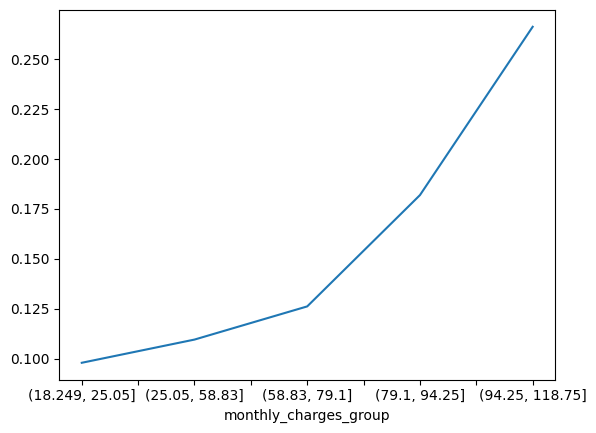

In [49]:
t['mean'].plot();

- Как мы видим, чем больше клиенты тратят в месяц, тем больше вероятность того, что они откажутся от услуг оператора:
  - До 79 у.е. вероятность ухода примерно одинаковая (10-13%);
  - Начиная с 80 у.е. до 94 у.е. вероятность ухода возрастает до 18%;
  - Для тех, кто тратит больше 94% у.е. вероятность разрыва контракта составляет уже 27% - оператору следует задуматься над акциями по удержанию платежеспособных клиентов;

In [50]:
df['total_charges_group'] = pd.qcut(df['total_charges'], 5)
t = df.groupby('total_charges_group')['churn'].agg(['count','sum', 'mean'])
t

,count,sum,mean
total_charges_group,,,
"(19.049, 330.02]",1409,66,0.05
"(330.02, 914.516]",1408,175,0.12
"(914.516, 1850.76]",1409,252,0.18
"(1850.76, 3844.87]",1408,408,0.29
"(3844.87, 9221.38]",1409,200,0.14


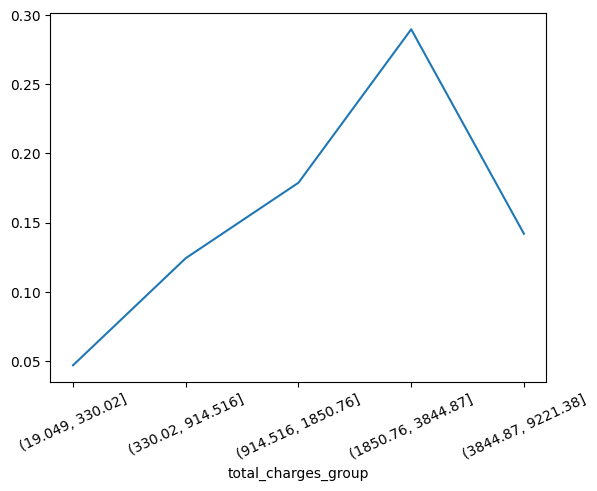

In [51]:
t['mean'].plot()
plt.xticks(range(len(t)), t.index, rotation=25);

- Клиенты, потратившие до 330 у.е., ушли в 5% случаев;
- Клиенты, потратившие от 330 у.е. до 915 у.е., ушли в 12% случаев;
- Клиенты, потратившие от 915 у.е. до 1851 у.е., ушли в 18% случаев;
- Клиенты, потратившие от 1851 у.е. до 3845 у.е., ушли в 29% случаев;
- Клиенты, потратившие от 3845 у.е. до 9221 у.е., ушли в 14% случаев;
- Можно сказать, что клиенты, потратившие за все время небольшие суммы, уходят реже всего (возможно, это недавно подключившиеся пользователи);
- Чем больше тратит клиент, тем выше вероятность ухода, но до определенного момента. Возможно, это влияние выбросов/неверных данных;

In [52]:
# Здесь я разделила не по квантилям, а примерно по году на каждую группу (мне показалось, что так логичнее)
df['duration_group'] = pd.cut(df['duration'], 6)
t = df.groupby('duration_group')['churn'].agg(['count','sum', 'mean'])
t

,count,sum,mean
duration_group,,,
"(-2.314, 385.667]",2213,148,0.07
"(385.667, 771.333]",1349,280,0.21
"(771.333, 1157.0]",1110,329,0.30
"(1157.0, 1542.667]",804,222,0.28
"(1542.667, 1928.333]",732,110,0.15
"(1928.333, 2314.0]",835,12,0.01


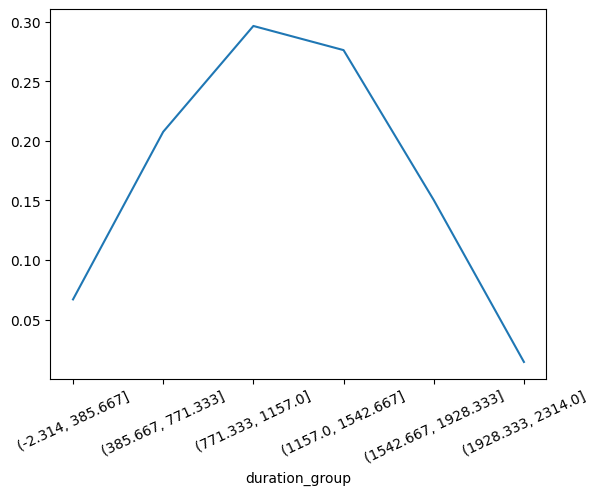

In [53]:
t['mean'].plot()
plt.xticks(range(len(t)), t.index, rotation=25);

- Клиенты, пользующиеся услугами до 386 дней (примерно 1 года), уходят в 7% случаев;
- Клиенты, пользующиеся услугами от 386 дней (примерно 1 года) до 771 дня (примерно 2 лет), уходят в 21% случаев;
- С 2 до 3 лет вероятность ухода возрастает до 30%;
- С 3 до 4 лет составляет 28%;
- Затем начинает снижаться и с 4 до 5 лет составляет уже 15% (110 человек из 732);
- С 5 лет до 6 остаются самые преданные клиенты, уходит только 1% (12 человек из 835);
- Оператору стоит задуматься над акциями для клиентов, пользующимися услугами от 1 года до 5 лет;

In [54]:
# Удалим столбцы 'duration_group', 'monthly_charges_group', 'total_charges_group'
df = df.drop(['duration_group', 'monthly_charges_group', 'total_charges_group'], axis=1)

In [55]:
# Проверим
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 19 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   type               7043 non-null   object 
 1   paperless_billing  7043 non-null   object 
 2   payment_method     7043 non-null   object 
 3   monthly_charges    7043 non-null   float64
 4   total_charges      7043 non-null   float64
 5   internet_service   7043 non-null   object 
 6   online_security    7043 non-null   object 
 7   online_backup      7043 non-null   object 
 8   device_protection  7043 non-null   object 
 9   tech_support       7043 non-null   object 
 10  streaming_tv       7043 non-null   object 
 11  streaming_movies   7043 non-null   object 
 12  gender             7043 non-null   object 
 13  senior_citizen     7043 non-null   object 
 14  partner            7043 non-null   object 
 15  dependents         7043 non-null   object 
 16  multiple_lines     7043 

### 1.3.2 Анализ категориальных признаков

Проанализируем каждый категориальный признак - выведем piechart, а также рассмотрим каждый признак в разрезе с целевой переменной.

In [56]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 19 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   type               7043 non-null   object 
 1   paperless_billing  7043 non-null   object 
 2   payment_method     7043 non-null   object 
 3   monthly_charges    7043 non-null   float64
 4   total_charges      7043 non-null   float64
 5   internet_service   7043 non-null   object 
 6   online_security    7043 non-null   object 
 7   online_backup      7043 non-null   object 
 8   device_protection  7043 non-null   object 
 9   tech_support       7043 non-null   object 
 10  streaming_tv       7043 non-null   object 
 11  streaming_movies   7043 non-null   object 
 12  gender             7043 non-null   object 
 13  senior_citizen     7043 non-null   object 
 14  partner            7043 non-null   object 
 15  dependents         7043 non-null   object 
 16  multiple_lines     7043 


Признак type



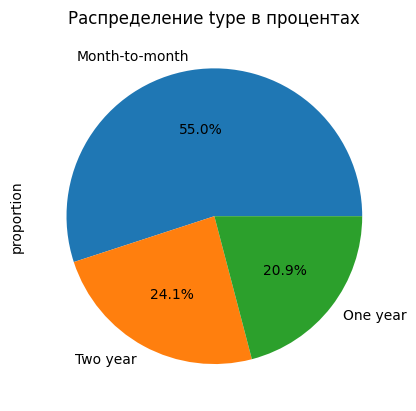

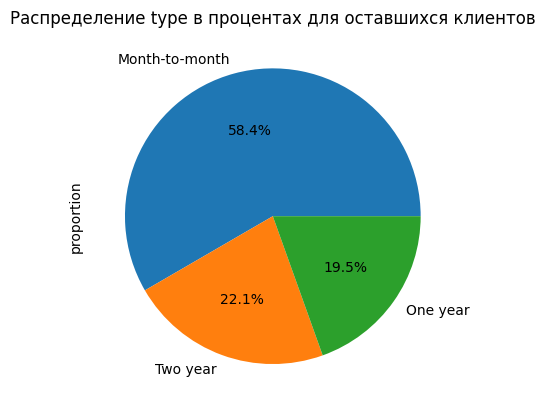

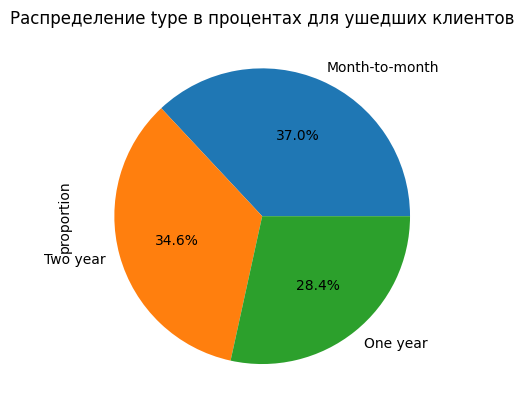

,count,sum,mean
type,,,
Month-to-month,3875,407,0.11
One year,1473,313,0.21
Two year,1695,381,0.22


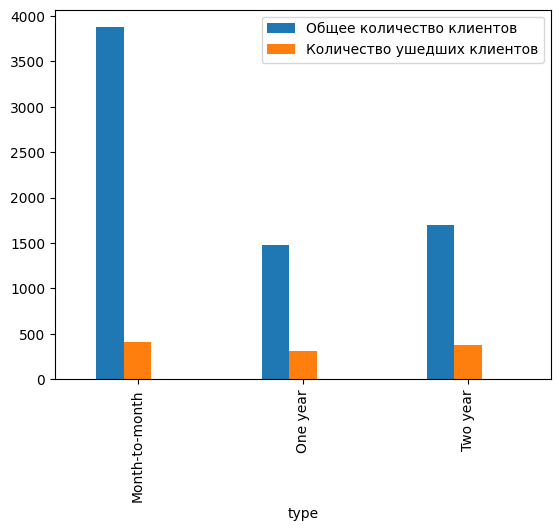


Признак paperless_billing



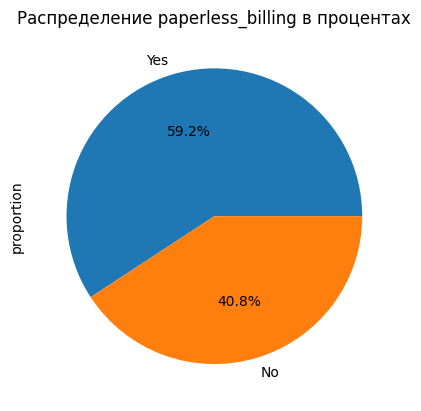

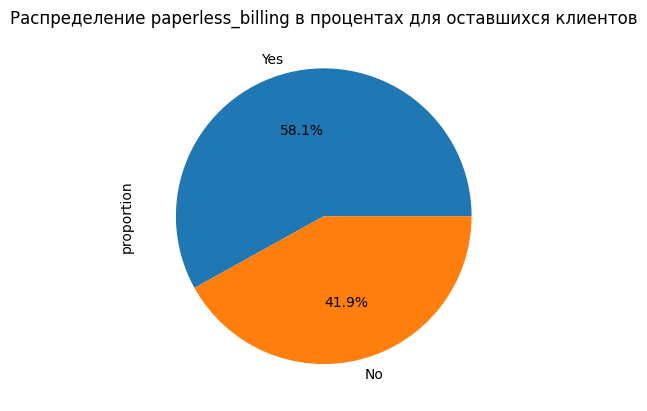

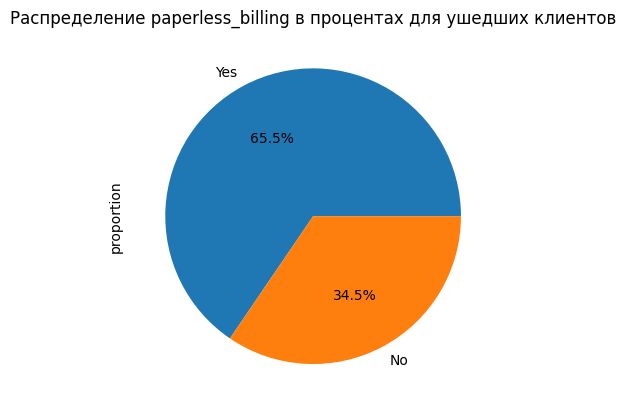

,count,sum,mean
paperless_billing,,,
No,2872,380,0.13
Yes,4171,721,0.17


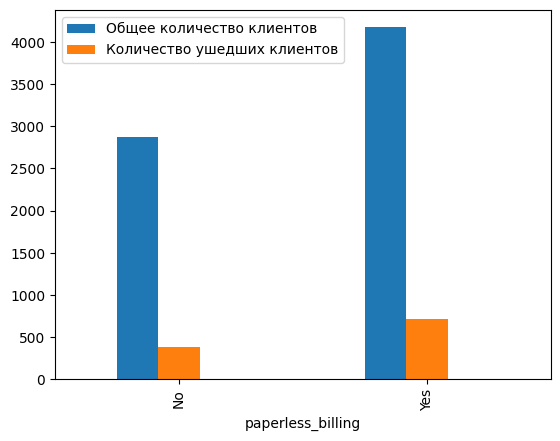


Признак payment_method



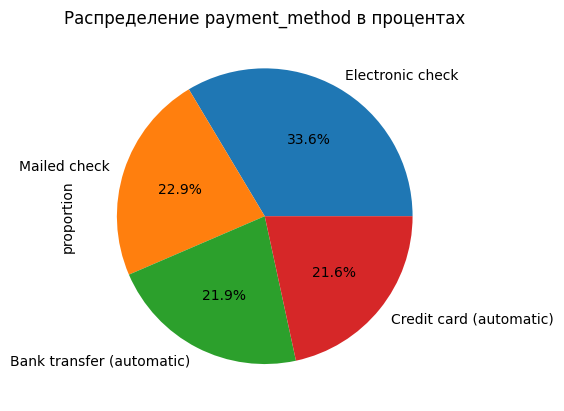

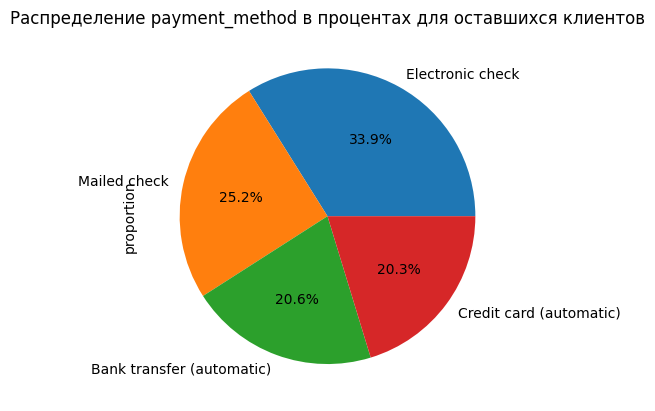

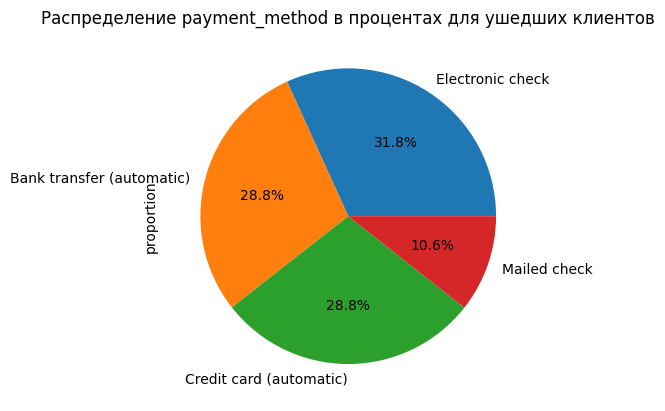

,count,sum,mean
payment_method,,,
Bank transfer (automatic),1544,317,0.21
Credit card (automatic),1522,317,0.21
Electronic check,2365,350,0.15
Mailed check,1612,117,0.07


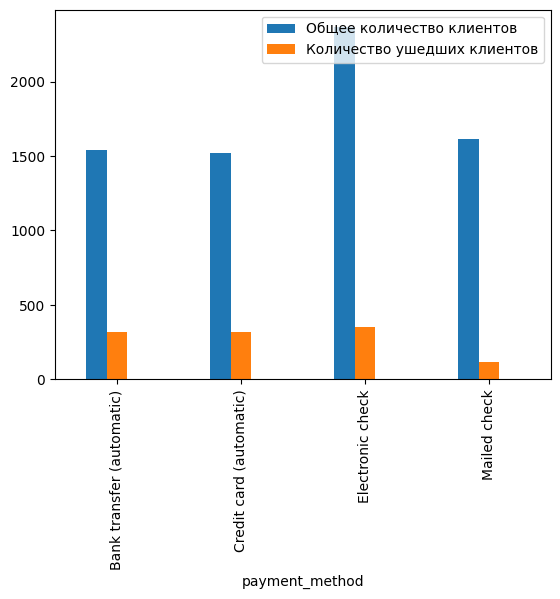


Признак internet_service



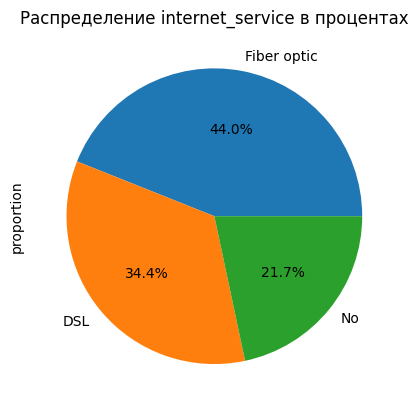

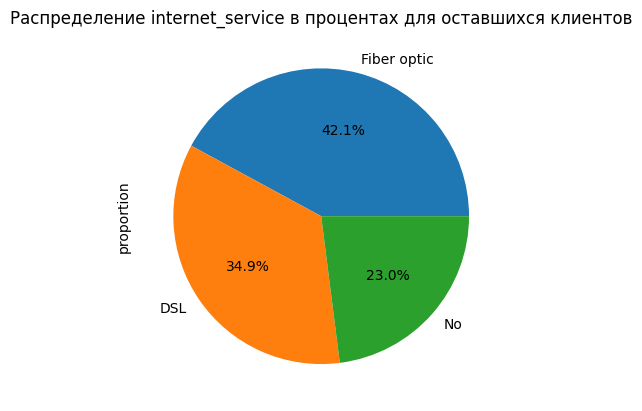

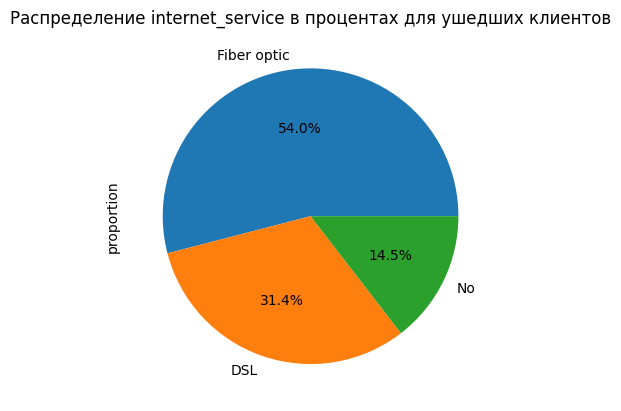

,count,sum,mean
internet_service,,,
DSL,2421,346,0.14
Fiber optic,3096,595,0.19
No,1526,160,0.10


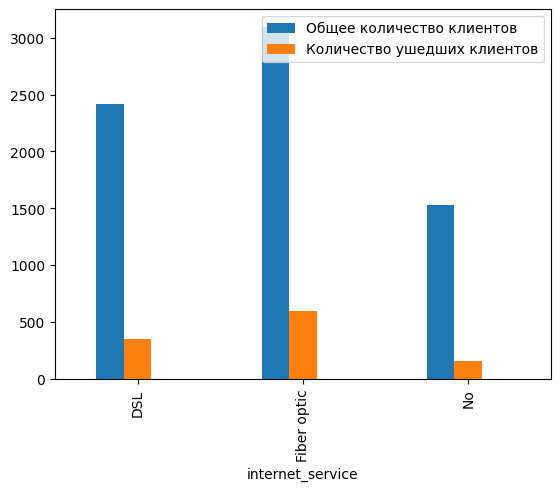


Признак online_security



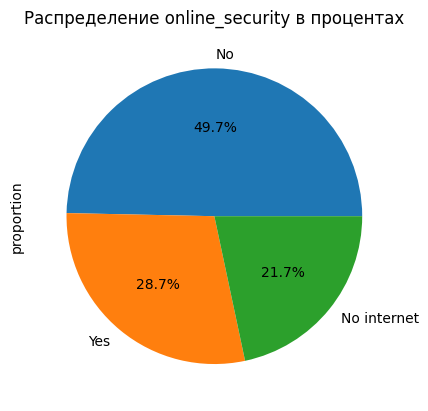

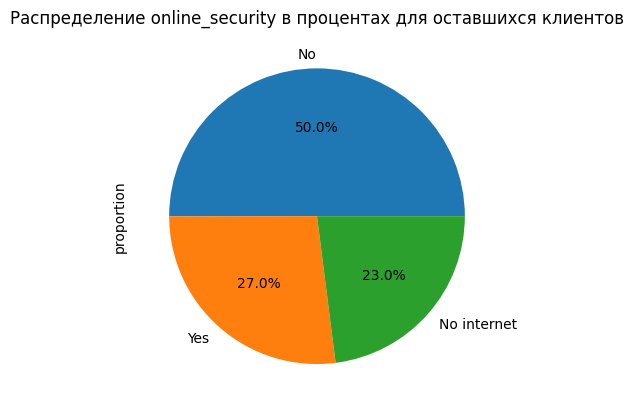

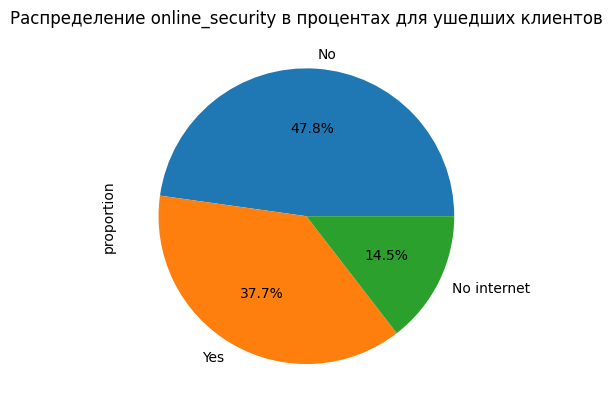

,count,sum,mean
online_security,,,
No,3498,526,0.15
No internet,1526,160,0.10
Yes,2019,415,0.21


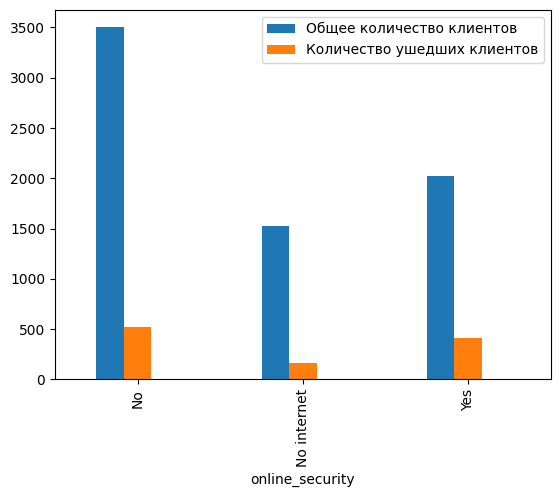


Признак online_backup



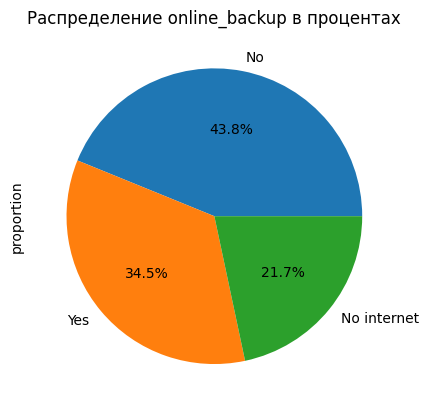

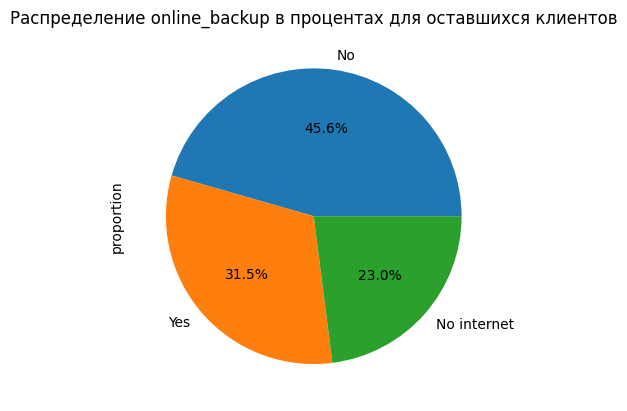

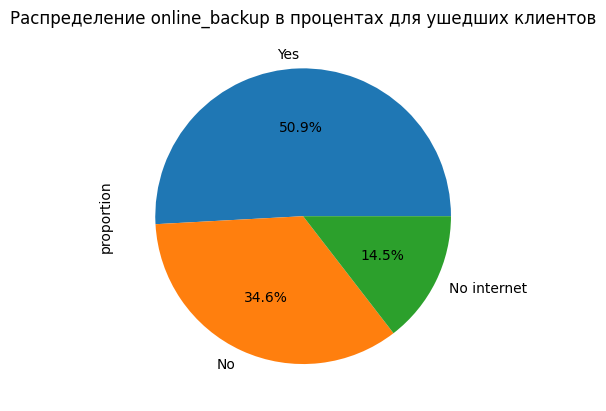

,count,sum,mean
online_backup,,,
No,3088,381,0.12
No internet,1526,160,0.10
Yes,2429,560,0.23


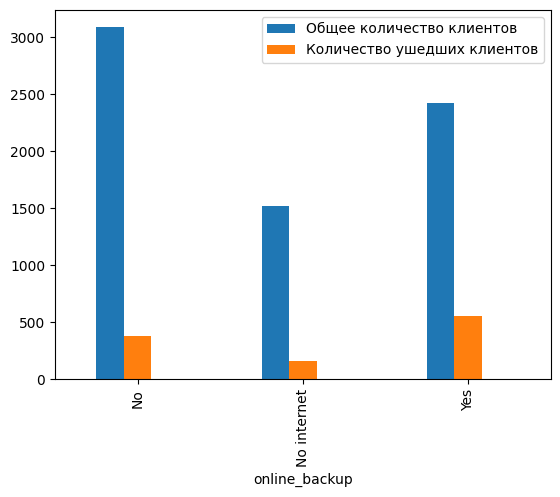


Признак device_protection



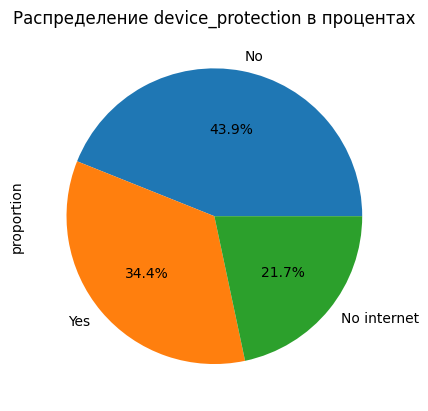

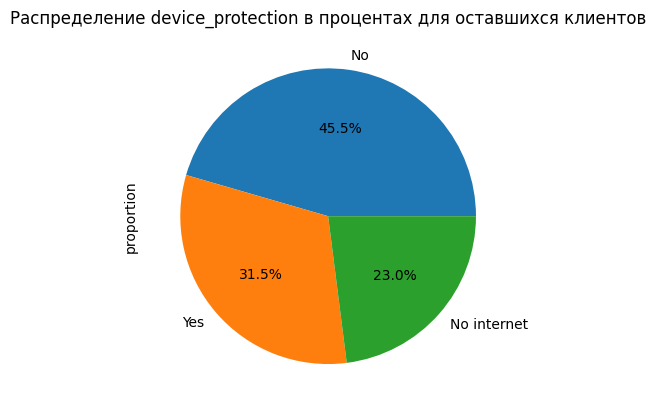

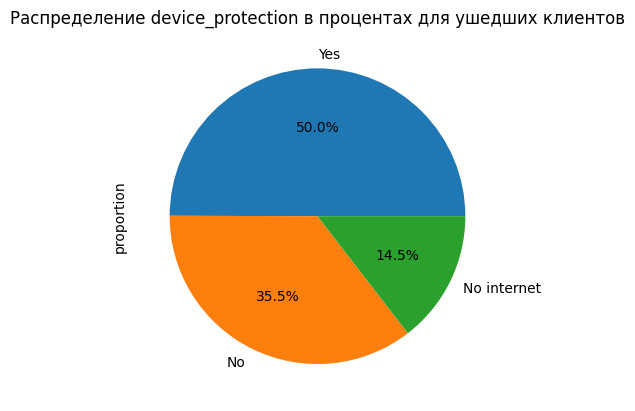

,count,sum,mean
device_protection,,,
No,3095,391,0.13
No internet,1526,160,0.10
Yes,2422,550,0.23


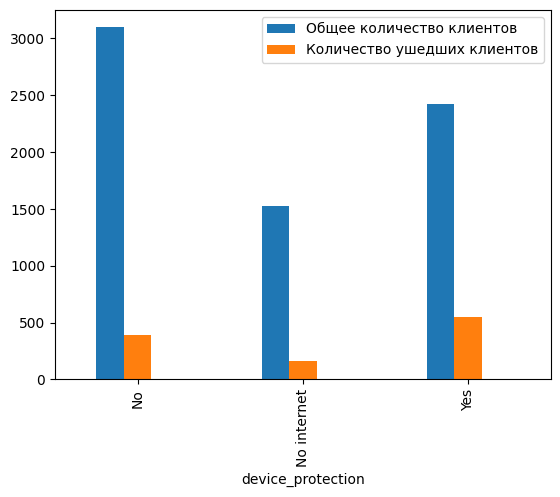


Признак tech_support



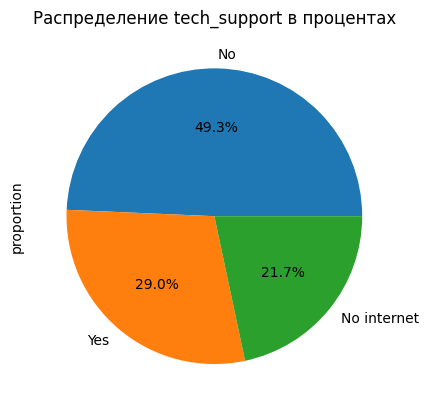

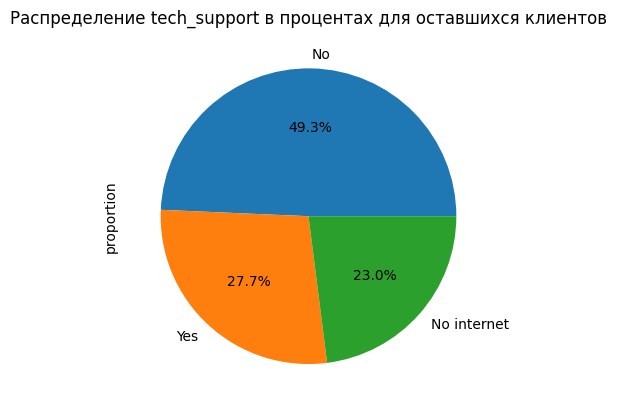

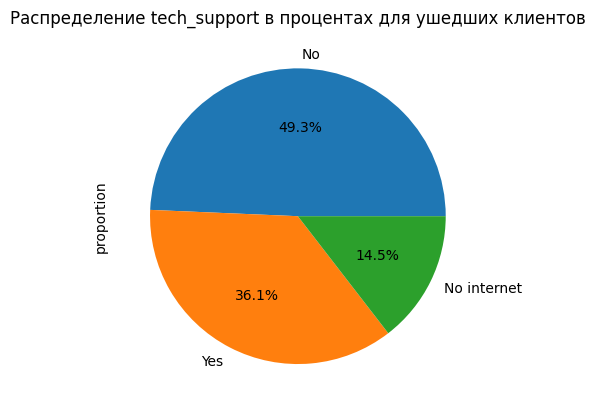

,count,sum,mean
tech_support,,,
No,3473,543,0.16
No internet,1526,160,0.10
Yes,2044,398,0.19


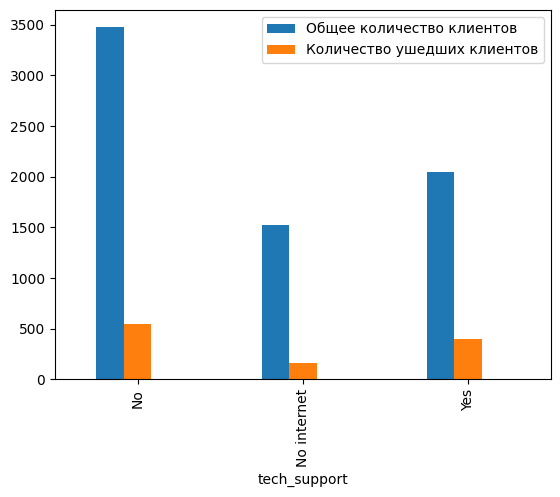


Признак streaming_tv



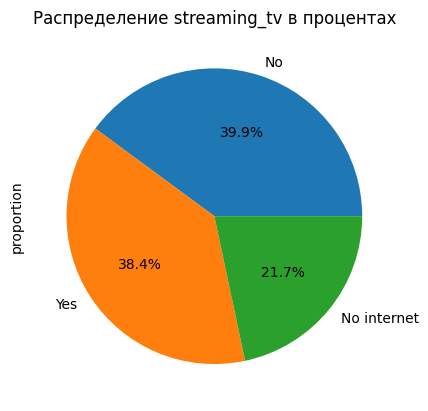

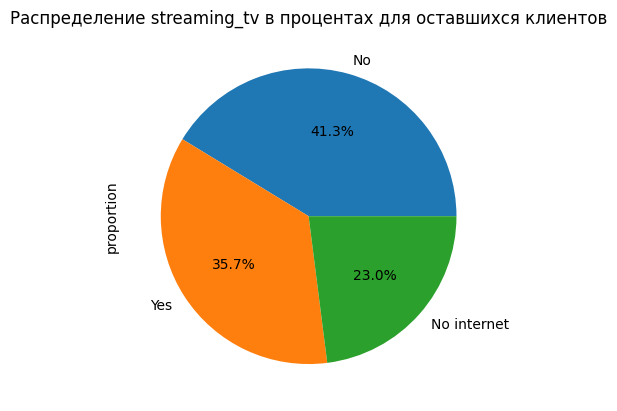

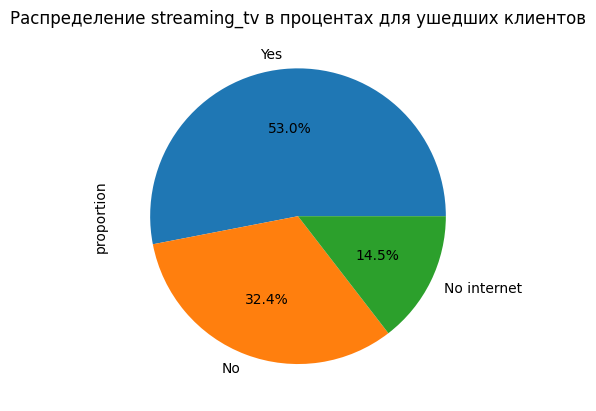

,count,sum,mean
streaming_tv,,,
No,2810,357,0.13
No internet,1526,160,0.10
Yes,2707,584,0.22


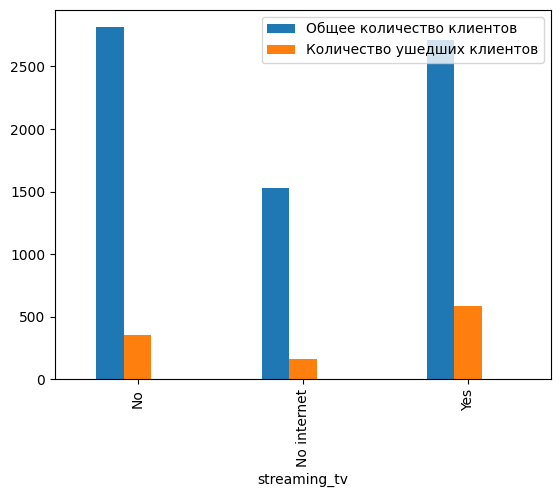


Признак streaming_movies



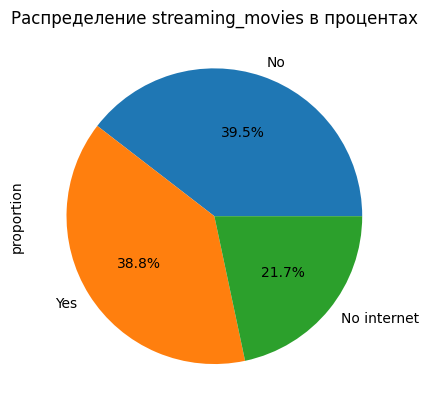

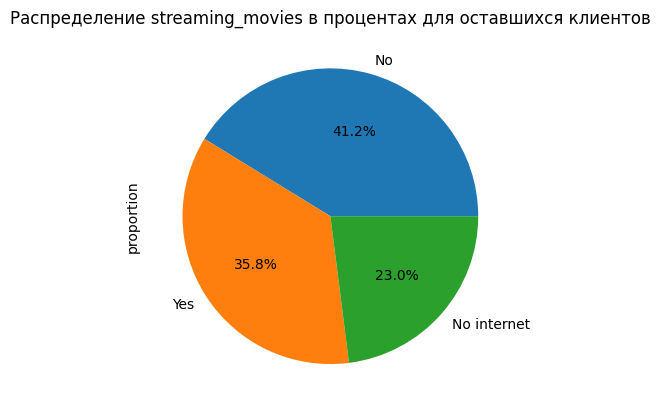

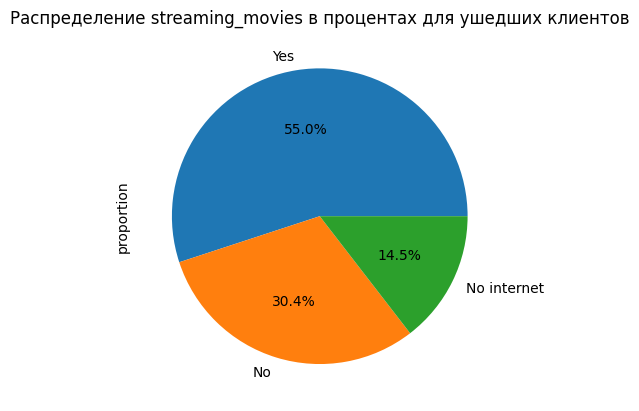

,count,sum,mean
streaming_movies,,,
No,2785,335,0.12
No internet,1526,160,0.10
Yes,2732,606,0.22


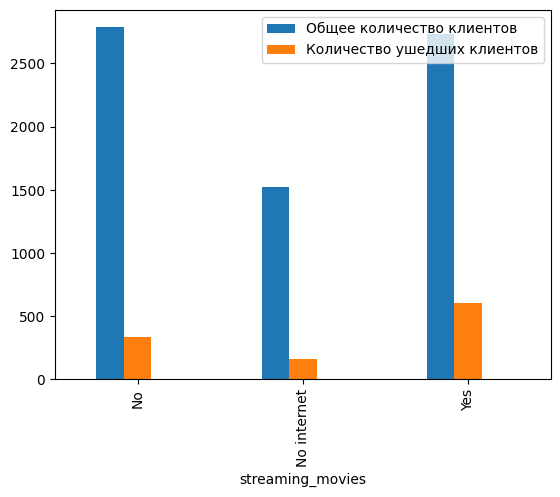


Признак gender



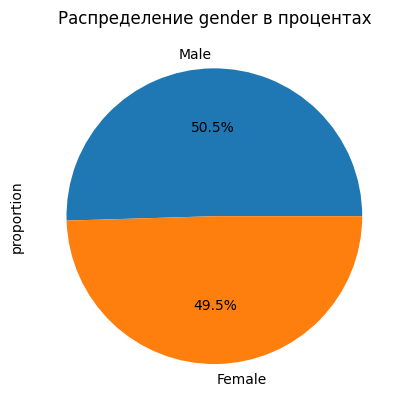

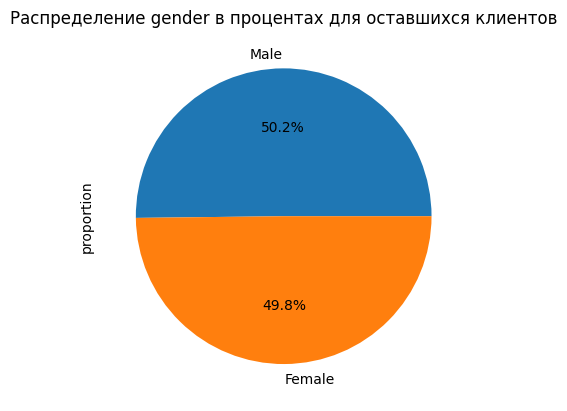

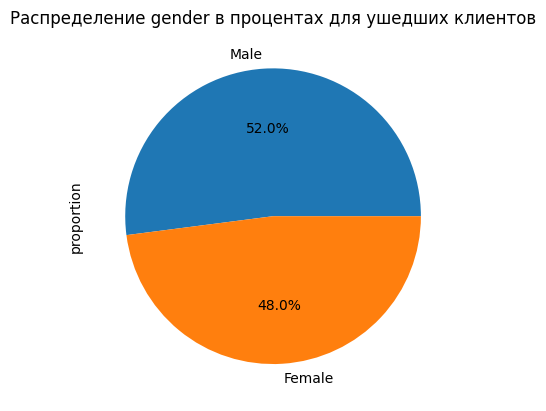

,count,sum,mean
gender,,,
Female,3488,528,0.15
Male,3555,573,0.16


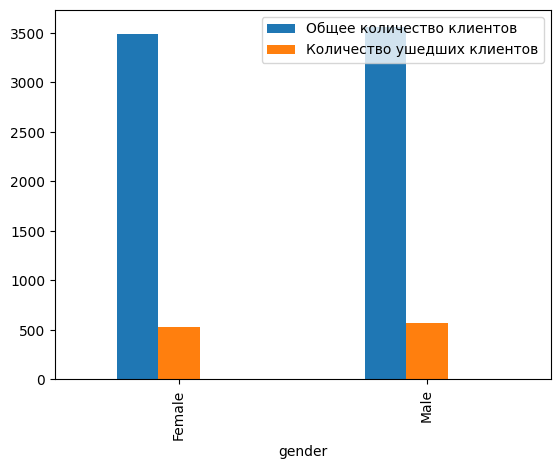


Признак senior_citizen



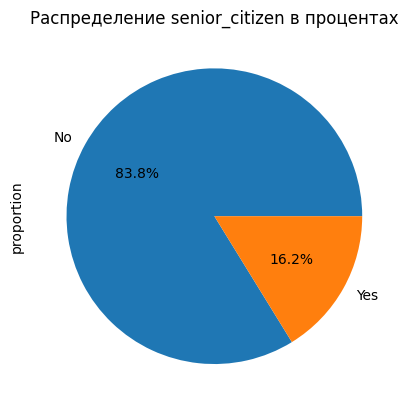

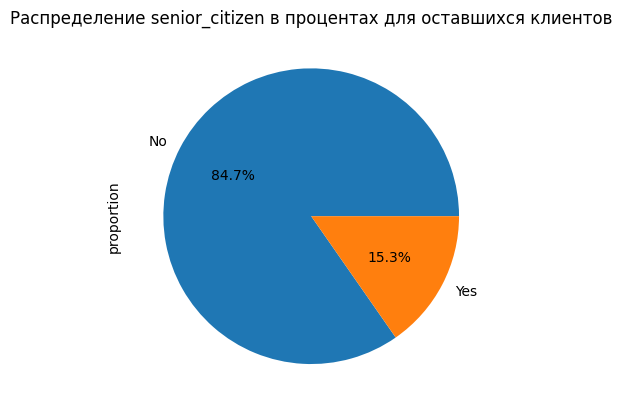

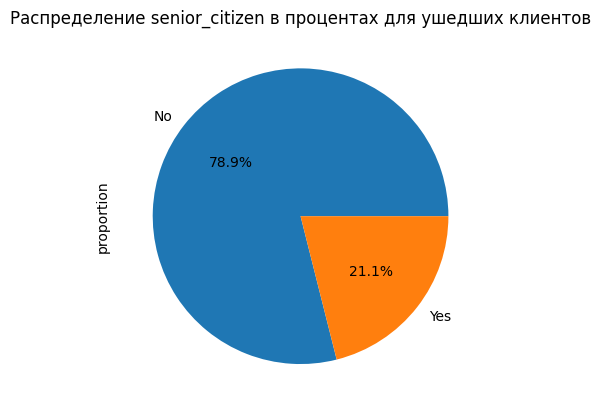

,count,sum,mean
senior_citizen,,,
No,5901,869,0.15
Yes,1142,232,0.20


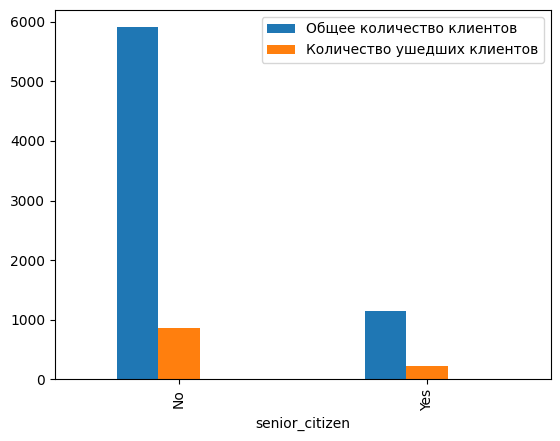


Признак partner



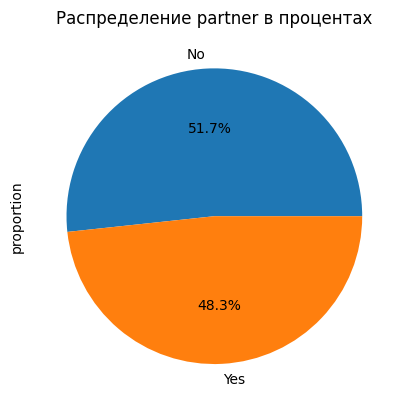

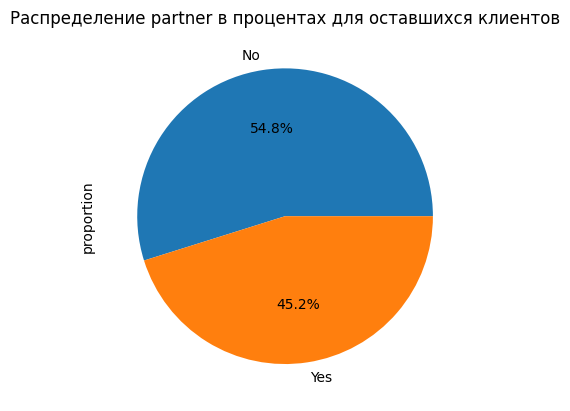

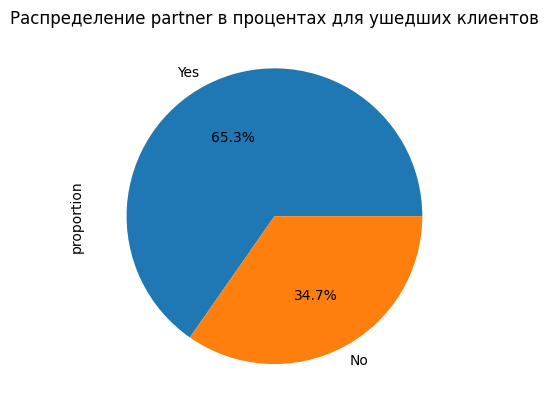

,count,sum,mean
partner,,,
No,3641,382,0.10
Yes,3402,719,0.21


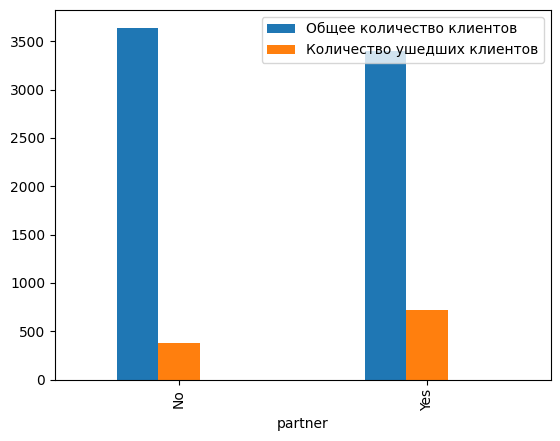


Признак dependents



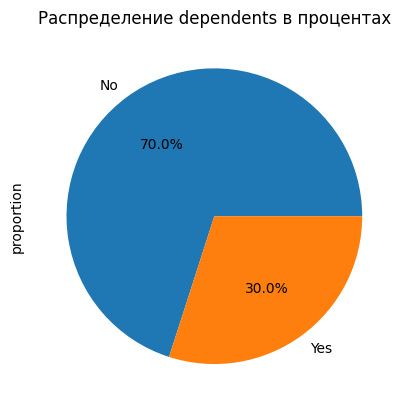

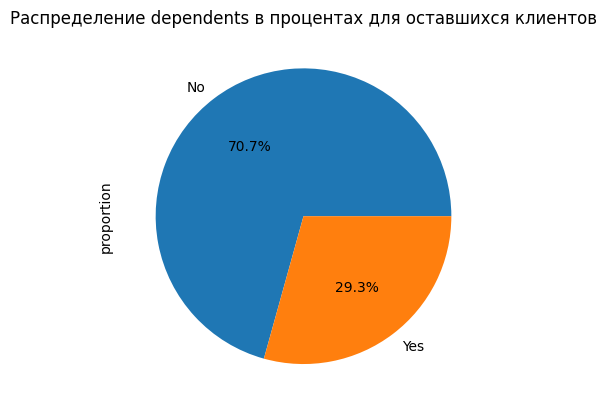

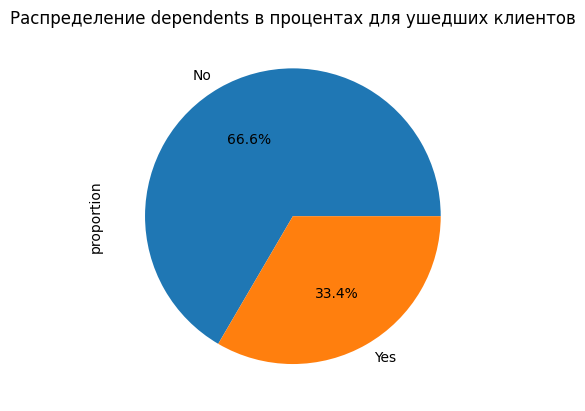

,count,sum,mean
dependents,,,
No,4933,733,0.15
Yes,2110,368,0.17


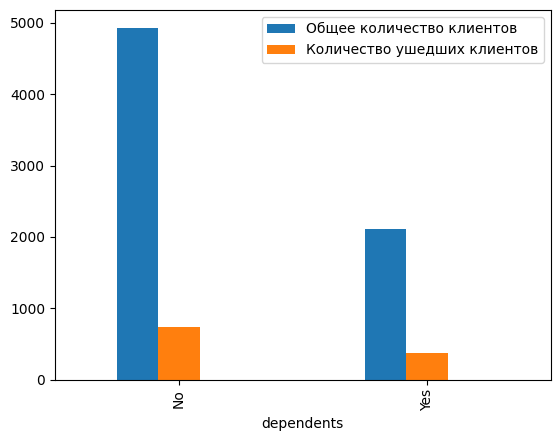


Признак multiple_lines



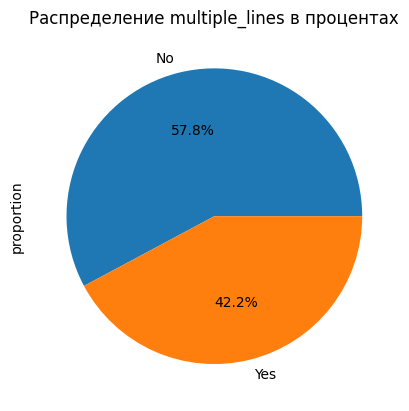

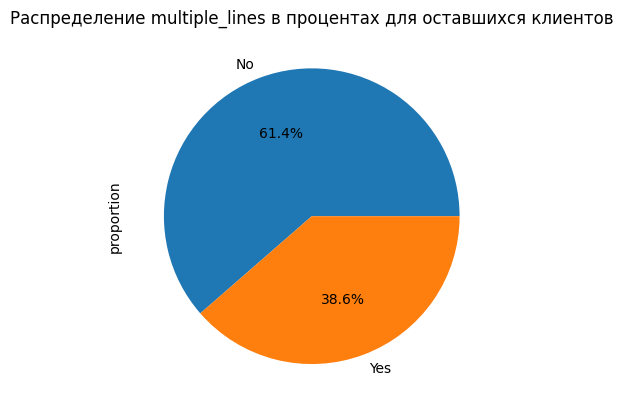

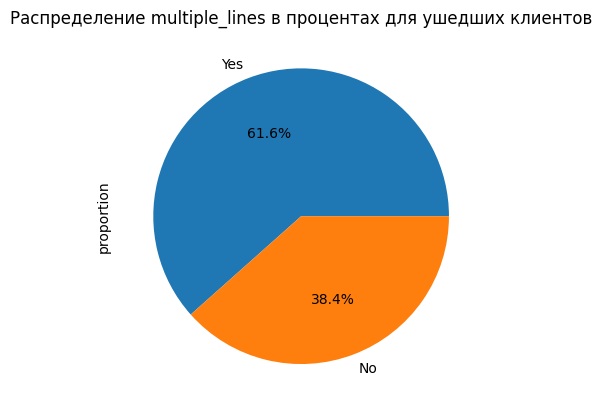

,count,sum,mean
multiple_lines,,,
No,4072,423,0.10
Yes,2971,678,0.23


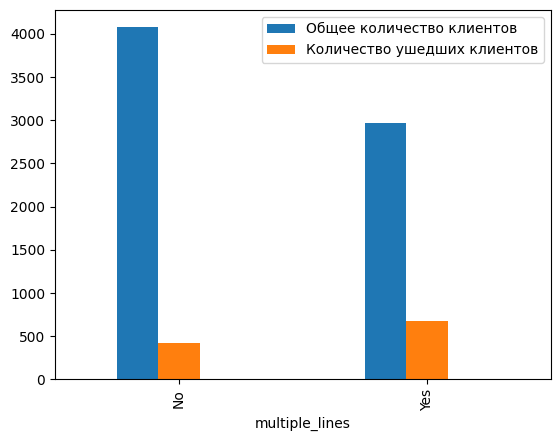

In [57]:
for c in df.select_dtypes(include=['object']):
    print(f'\nПризнак {c}\n')
    p = df[c].value_counts(normalize=True)
    p.plot(kind='pie', autopct='%1.1f%%')
    plt.title(f'Распределение {c} в процентах') 
    plt.show()
    churn_0 = df[df['churn'] == 0]
    p_0 = churn_0[c].value_counts(normalize=True)
    p_0.plot(kind='pie', autopct='%1.1f%%')
    plt.title(f'Распределение {c} в процентах для оставшихся клиентов') 
    plt.show()
    churn_1 = df[df['churn'] == 1]
    p_1 = churn_1[c].value_counts(normalize=True)
    p_1.plot(kind='pie', autopct='%1.1f%%')
    plt.title(f'Распределение {c} в процентах для ушедших клиентов')
    plt.show()
    t = df.groupby(c)['churn'].agg(['count', 'sum', 'mean'])
    display(t)
    t.plot(kind='bar')
    plt.legend(['Общее количество клиентов', 'Количество ушедших клиентов'])
    plt.show();

Можем сделать следующие выводы:
- Признак type:
  - Чаще всего клиенты предпрочитают month-to-month (то есть оплату услуг ежемесячно без заключения долгосрочного контракта) тип договора  - 3875 значений (55%);
  - На втором месте two year тип договора (договор на 2 года) - 1695 значений (24.1%);
  - На последнем месте one year тип договора (договор на 1 год) - 1473 значений (20.9%);
  - Реже всего уходят month-to-month-клиенты - 11%, one year и two year клиенты уходят примерно одинаково (21% и 22% соответственно);
  - Клиенты, не разорвавшие контракт:
    - В 58.4% предпочитают month-to-month тип договора;
    - Two year тип договора (22.1%) и one year тип договора (19.5%) предпочитают примерно поровну;
  - Клиенты, разорвавшие контракт:
    - Чаще предпочитают month-to-month тип договора (37%) и two year тип договора (34.6%);
    - One year тип договора предпочитают 28.4% ушедших клиентов;
- Признак paperless_billing:
  - 4171 клиентов (59.2%) предпочитают выставление счета в электронном виде на email, среди них уходят 17%;
  - 2872 клиентов (40.8%) предпочитают выставление счета в бумажном виде, среди них уходят 13%;
  - Оставшиеся клиенты предпочитают выставление счета в электронном виде (58.1%);
  - Ушедшие клиенты также предпочитают выставление счета в электронном виде (65.5%);
- Признак payment_method: 
  - Наиболее популярным способом оплаты является electronic check - 2365 значений (33.6%);
  - На втором месте mailed check - 1612 значений (22.9%);
  - На третьем месте bank transfer (automatic) - 1544 значений (21.9%);
  - На последнем месте credit card (automatic) - 1522 значений (21.6%);
  - Клиенты, предпочитающие mailed check уходят реже всего - в 7%;
  - Чаще всего уходят клиенты, платящие при помощи Credit card (automatic) и Bank transfer (automatic) (по 21%), то есть автоматическое списание средств может побуждать клиентов расторгнуть услуги с оператором;
  - Оставшиеся клиенты предпочитают:
    - electronic check - 33.9%;
    - mailed check - 25.2%;
    - Реже всего используют bank transfer (automatic) - 20.6% и credit card (automatic) - 20.3%;
  - Ушедшие клиенты:
    - Чаще всего используют electronic check - 31.8%;
    - На втором месте bank transfer (automatic) и credit card (automatic) - по 28.8%;
    - Реже всего используют mailed check - 10.6%;
- Признак internet_service:
  - 3096 клиентов (44%) предпочитают Fiber optic;
  - 2421 клиентов (34.4%) - DSL;
  - Чаще уходят клиенты, пользующиеся Fiber optic (в 19%), использующие DSL уходят в 14%;
  - О 1526 клиентах отсутствуют данные (21.7%). Предполагаем, что данные клиенты не пользуются услугами интернет от данного провайдера. Среди них договор с оператором разрывают 10%. В дальнейшем это значение будет актуально для всех опций интернет;
  - Оставшиеся клиенты предпочитают:
    - Fiber optic - 42.1%;
    - DSL - 34.9%;
    - У 23% интернет от провайдера не подключен;
  - Ушедшие клиенты предпочитают:
    - Fiber optic - 54%;
    - DSL - 31.4%;
    - У 14.5% интернет от провайдера не подключен;
- Признак online_security:
  - Межсетевой экран используют 2019 клиентов (28.7%), из них разрывают контракт 21%;
  - Не используют межсетевой экран 3498 клиентов (49.7%), из них 15% разрывают контракт;
  - У 21.7% клиентов не подключен инернет от провайдера - 1526 значений, из них 10% уходят;
  - Оставшиеся клиенты:
    - 50% не подключают опцию online_security;
    - 27% подключают межсетевой экран;
    - У 23% не подключен интернет от провайдера;
  - Ушедшие клиенты:
    - 47.8% не подключают опцию online_security;
    - 37.7% подключают межсетевой экран;
    - У 14.5% не подключен интернет от провайдера;
- Признак online_backup:
  - Облачным хранилищем пользуются 2429 (34.5%) клиентов, из них уходят - 23%;
  - Не пользуются облачным хранилищем 3088 (43.8%) клиентов, 12% из них разрывают договор;
  - У 1526 (21.7%) клиентов не подключен инетрнет от провайдера, 10% из них уходят;
  - Оставшиеся клиенты:
    - Не пользуются облачным хранилищем 45.6%;
    - Пользуются облачным хранилищем 31.5%;
  - Ушедшие клиенты:
    - Пользуются облачным хранилищем 50.9%;
    - Не пользуются облачным хранилищем 34.6%;
  - Ушедшие клиенты чаще используют опцию облачного хранилища по сравнению с оставшимися;
- Признак device_protection:
  - Пользуются антивирусом 34.4% (2422) клиентов, из них уходят 23%;
  - Не пользуются антивирусом 43.9% (3095) клиентов, 13% из них уходят;
  - Оставшиеся клиенты:
    - Не пользуются антитвирусом 45.5%;
    - Пользуются антивирусом 31.5%;
  - Ушедшие клиенты:
    - Пользуются антивирусом 50%;
    - Не пользуются антивирусом 35.5%;
  - Ушедшие клиенты чаще используют опцию антивируса по сравнению с оставшимися;
- Признак tech_support:
  - Технической поддержкой пользуются 29% (2044) клиентов, 19% из них разрывают контракт с оператором;
  - Не пользуются выделенной линией технической поддержки 49.3% (3473) клиентов, 16% из них уходят;
  - Оставшиеся клиенты:
    - Не пользуются выделенной линией технической поддержки 49.3%;
    - Пользуются выделенной линией технической поддержки 27.7%;
  - Ушедшие клиенты:
    - Не пользуются выделенной линией технической поддержки 49.3%;
    - Пользуются выделенной линией технической поддержки 36.1%;
- Признак streaming_tv:
  - Онлайн-ТВ смотрят 38.4% (2707) клиентов, из них уходят 22%;
  - Не смотрят онлайн-ТВ 39.9% (2810) клиентов, уходят из них 13%;
  - Оставшиеся клиенты:
    - Смотрят онлайн-ТВ 36.7%;
    - Не смотрят онлайн-ТВ 41.3%;
  - Ушедшие клиенты:
    - Смотрят онлайн-ТВ 53%;
    - Не смотрят онлайн-ТВ 32.4%;
  - Ушедшие клиенты чаще подключают услугу онлайн-ТВ по сравнению с оставшимися;
- Признак streaming_movies:
  - Онлайн-кинотеатр смотрят 38.8% (2732) клиентов, из них уходят 22%;
  - Не смотрят онлайн-кинотеатр 39.5% (2785) клиентов, уходят из них 12%;
  - Оставшиеся клиенты:
    - Смотрят онлайн-кинотеатр 35.8%;
    - Не смотрят онлайн-кинотеатр 41.2%;
  - Ушедшие клиенты:
    - Смотрят онлайн-кинотеатр 55%;
    - Не смотрят онлайн-кинотеатр 30.4%;
  - Ушедшие клиенты чаще подключают услугу онлайн-кинотеатра по сравнению с оставшимися;
- Признак gender:
  - Женщин (49.5%) и мужчин (50.5%) примерно поровну;
  - Уходят они также в равных долях: женщины в 15%, мужчины в 16%;
- Признак senior_citizen:
  - Пенсионный статус имеют 16.2% (1142) клиентов, из них разрывают контракт 20%;
  - 83.8% (5901) клиентов не имеют пенсионный статус, из них уходят 15%;
  - Оставшиеся клиенты:
    - В 84.7% не имеют пенсионного статуса;
    - В 15.3% имеют;
  - Ушедшие клиенты:
    - В 78.9% не имеют пенсионного статуса;
    - В 21.1% имеют;
  - Среди ушедших клиентов больше людей пенсионного возраста;
- Признак partner:
  - Супруга/супругу имеют 48.3% (3402) клиентов;
  - Супруга/супругу не имеют 51.7% (3641) клиентов;
  - При этом женатые разрывают контракт в 21% случаев, в то время как холостые только в 10%;
  - Оставшиеся клиенты:
    - В 54.8% не имеют супруга/супругу;
    - В 45.2% имеют;
  - Ушедшие клиенты:
    - В 65.3% имеют супруга/супругу;
    - В 34.7% не имеют супруга/супругу;
  - Ушедшие клиенты чаще имеют супруга/супругу по сравнению с оставшимися;
- Признак dependents:
  - Иждивенцев имеют 30% (2110) клиентов, из них уходят 17%;
  - Иждивенцев не имеют 70% (4933) клиентов, из них уходят 15%;
  - Оставшиеся клиенты:
    - В 70.7% не имеют иждивенцев;
    - В 29.3% имеют;
  - Ушедшие клиенты:
    - В 66.6% не имеют иждивенцев;
    - В 33.4% имеют иждивенцев;
- Признак multiple_lines:
  - Возможностью подключения телефонного аппарата к нескольким линиям одновременно пользуются 42.2% (2971) клиентов, из них уходят 23%;
  - Возможностью подключения телефонного аппарата к нескольким линиям одновременно не пользуются 57.8% (4072) клиентов, из них уходят 10%;
  - Оставшиеся клиенты:
    - В 61.4% не пользуются возможностью подключения телефонного аппарата к нескольким линиям одновременно;
    - В 38.6% пользуются возможностью подключения телефонного аппарата к нескольким линиям одновременно;
  - Ушедшие клиенты:
    - В 61.6% пользуются возможностью подключения телефонного аппарата к нескольким линиям одновременно;
    - В 38.4% не пользуются возможностью подключения телефонного аппарата к нескольким линиям одновременно;
  - Ушедшие клиенты чаще пользуются возможностью подключения телефонного аппарата к нескольким линиям одновременно по сравнению с оставшимися;
- В целом можем предположить, что клиенты, использующие дополнительные услуги, чаще разрывают контракт;

## Выводы по шагу 1
- Загрузили четыре датасета: contract, internet, personal, phone;
  - В датафрейме contract:
    - 8 столбцов, 7043 строки;
    - Пропуски отсутствуют;
    - Явные дубликаты отсутствуют;
    - Типы данных в столбцах требовали преобразований:
      - begin_date из object в date;
      - end_date из object в date;
      - total_charges из object в float64;
    - В end_date видим значения 'No' (5942 значения). Предположили, если дата окончания пользования услугами отсутствует, то клиент продолжает пользоваться услугами - это целевой признак;
   - В датафрейме internet:
     - 8 столбцов, 5517 строк;
     - Пропуски отсутствуют;
     - Явные дубликаты отсутствуют;
     - Типы данных в столбцах не требуют преобразований;
  - В датафрейме personal:
    - 5 столбцов, 7043 строк;
    - Пропуски отсутствуют;
    - Явные дубликаты отсутствуют;
  - В датафрейме phone:
    - 2 столбца, 6361 строк;
    - Пропуски отсутствуют;
    - Явные дубликаты отсутствуют;
    - Типы данных в столбцах не требуют преобразований;
- Объединили датасеты по столбцу customer_id в датафрейм df;
- Добавили целевой признак churn: 0 - клиент не ушел, 1 - клиент отказался от услуг;
- В датафрейме df присутствует дисбаланс классов: объектов отрицательного класса (84%) в 5 с лишним раз больше объектов положительного класса (16%);
- Добавили признак duration, который содержит разницу между датами начала и окончания пользования услугами (количество дней);
- Обработали появившиеся после объединения датасетов пропуски:
  - Для признаков device_protection, streaming_movies, internet_service, online_security, online_backup, tech_support, streaming_tv, multiple_lines имеется только два значения: Yes и No. Предположили, что раз значение не указано, то услуга не подключена. Заменили пропуски на 'No' в internet_service и multiple_lines и на 'No internet' в device_protection, streaming_movies, online_security, online_backup, tech_support, streaming_tv, так как выяснили, что у данных клиентов не поключен итернет от оператора;
  - Обнаружили, что пропуски в total_charges у клиентов, которые начали пользоваться услугами оператора 2020-02-01, то есть новички. Вполне вероятно, что они просто не успели произвести оплату, либо счет еще не был выставлен, поэтому заполнили пропуски соответствующими значениями из monthly_charges;
- Удалили следующие столбцы:
  1) 'customer_id' - уникальные идентификаторы пользователей, не содержат полезной информации и не влияют на целевую переменную;
  2) 'begin_date', 'end_date' - столбцы с датами. Неудаление столбцов с датами может привести к деградации модели в будущем по следующим причинам:
     - Увеличение размерности данных: столбцы с датами могут добавить дополнительные измерения в данные, что может усложнить моделирование и привести к переобучению модели;
     - Несоответствие тренировочных и тестовых данных: если даты в тренировочных и тестовых данных различаются, то модель может быть обучена на одних условиях и протестирована на других. Это может привести к низкой производительности модели на новых данных;
     - Потеря информации: если даты не используются в модели, то их наличие может привести к потере информации и увеличению шума в данных. Это может затруднить обучение модели и ухудшить ее производительность;
- Провели исследовательский анализ данных EDA:
  - Количественных признаков:
    - Признак monthly_charges:
      - Минимально клиенты тратят 18.25 у.е. в месяц, максимально - 118.75 у.е.;
      - В среднем в месяц клиенты тратят 64.76 у.е., в то время как медианным значением является 70.35 у.е.: по графику и значениям среднего и медианы видно, что распределение смещено влево - видим большой всплеск в районе 20 у.е. Возможно, это базовый тариф без дополнительных опций;
      - Видим всплески на значениях кратных 5. Возможно, это как-то связано с тарифами или в целом стоимость услуг кратна этой цифре;
      - Чем больше клиенты тратят в месяц, тем больше вероятность того, что они откажутся от услуг оператора:
        - До 79 у.е. вероятность ухода примерно одинаковая (10-13%);
        - Начиная с 80 у.е. до 94 у.е. вероятность ухода возрастает до 18%;
        - Для тех, кто тратит больше 94% у.е. вероятность разрыва контракта составляет уже 27% - оператору следует задуматься над акциями по удержанию платежеспособных клиентов;
      - Ушедшие клиенты тратят в месяц больше оставшихся;
    - Признак total_charges:
      - Минимально клиенты тратят 0 у.е. (новички), максимально - 9,221.38 у.е.;
      - 75% клиентов потратили до 3,236.69 у.е.;
      - Медианное значение равно 1,343.35 у.е., а среднее 2,115.31 у.е., график имеет длинный хвост справа и содержит небольшое количество очень высоких значений, которые сильно влияют на среднее значение;
      - В целом график выглядит "нормально": чем выше сумма потраченных денег на услуги, тем меньше клиентов ее тратят;
      - Среди тех, кто потратил более 3236.69 у.е. за весь период пользования услугами связи, большинство предпочитают двухгодичный контракт (787 клиентов), на втором месте годичный контракт (531 клиент). Ежемесячную подписку без заключения долгосрочного договора предпочитают 443 клиента;
      - Клиенты, потратившие до 330 у.е., ушли в 5% случаев;
      - Клиенты, потратившие от 330 у.е. до 915 у.е., ушли в 12% случаев;
      - Клиенты, потратившие от 915 у.е. до 1851 у.е., ушли в 18% случаев;
      - Клиенты, потратившие от 1851 у.е. до 3845 у.е., ушли в 29% случаев;
      - Клиенты, потратившие от 3845 у.е. до 9221 у.е., ушли в 14% случаев;
      - Можно сказать, что клиенты, потратившие за все время небольшие суммы, уходят реже всего (возможно, это недавно подключившиеся пользователи);
      - Чем больше тратит клиент, тем выше вероятность ухода, но до определенного момента. Возможно, это влияние выбросов/неверных данных;
      - Ушедшие клиенты потратили в целом больше оставшихся;
    - Целевой признак churn:
      - В среднем 16% всех клиентов отказываются от услуг оператора связи;
    - Признак duration:
      - На гистограмме видим всплески, кратные 50. Скорее всего, это период подписки;
      - Клиенты, пользующиеся услугами до 386 дней (примерно 1 года), уходят в 7% случаев;
      - С 2 до 3 лет вероятность ухода возрастает до 30%;
      - С 3 до 4 лет составляет 28%;
      - Затем начинает снижаться и с 4 до 5 лет составляет уже 15% (110 человек из 732);
      - С 5 лет до 6 остаются самые преданные клиенты, уходит только 1% (12 человек из 835);
      - Оператору стоит задуматься над акциями для клиентов, пользующимися услугами от 1 года до 5 лет;
  - Категориальных признаков:
    - Признак type:
      - Чаще всего клиенты предпрочитают month-to-month (то есть оплату услуг ежемесячно без заключения долгосрочного контракта) тип договора  - 3875 значений (55%);
      - На втором месте two year тип договора (договор на 2 года) - 1695 значений (24.1%);
      - На последнем месте one year тип договора (договор на 1 год) - 1473 значений (20.9%);
      - Реже всего уходят month-to-month-клиенты - 11%, one year и two year клиенты уходят примерно одинаково (21% и 22% соответственно);
      - Клиенты, не разорвавшие контракт:
        - В 58.4% предпочитают month-to-month тип договора;
        - Two year тип договора (22.1%) и one year тип договора (19.5%) предпочитают примерно поровну;
      - Клиенты, разорвавшие контракт:
        - Чаще предпочитают month-to-month тип договора (37%) и two year тип договора (34.6%);
        - One year тип договора предпочитают 28.4% ушедших клиентов;
    - Признак paperless_billing:
      - 4171 клиентов (59.2%) предпочитают выставление счета в электронном виде на email, среди них уходят 17%;
      - 2872 клиентов (40.8%) предпочитают выставление счета в бумажном виде, среди них уходят 13%;
      - Оставшиеся клиенты предпочитают выставление счета в электронном виде (58.1%);
      - Ушедшие клиенты также предпочитают выставление счета в электронном виде (65.5%);
    - Признак payment_method: 
      - Наиболее популярным способом оплаты является electronic check - 2365 значений (33.6%);
      - На втором месте mailed check - 1612 значений (22.9%);
      - На третьем месте bank transfer (automatic) - 1544 значений (21.9%);
      - На последнем месте credit card (automatic) - 1522 значений (21.6%);
      - Клиенты, предпочитающие mailed check уходят реже всего - в 7%;
      - Чаще всего уходят клиенты, платящие при помощи Credit card (automatic) и Bank transfer (automatic) (по 21%), то есть автоматическое списание средств может побуждать клиентов расторгнуть услуги с оператором;
      - Оставшиеся клиенты предпочитают:
        - electronic check - 33.9%;
        - mailed check - 25.2%;
        - Реже всего используют bank transfer (automatic) - 20.6% и credit card (automatic) - 20.3%;
      - Ушедшие клиенты:
        - Чаще всего используют electronic check - 31.8%;
        - На втором месте bank transfer (automatic) и credit card (automatic) - по 28.8%;
        - Реже всего используют mailed check - 10.6%;
    - Признак internet_service:
      - 3096 клиентов (44%) предпочитают Fiber optic;
      - 2421 клиентов (34.4%) - DSL;
      - Чаще уходят клиенты, пользующиеся Fiber optic (в 19%), использующие DSL уходят в 14%;
      - О 1526 клиентах отсутствуют данные (21.7%). Предполагаем, что данные клиенты не пользуются услугами интернет от данного провайдера. Среди них договор с оператором разрывают 10%. В дальнейшем это значение будет актуально для всех опций интернет;
      - Оставшиеся клиенты предпочитают:
        - Fiber optic - 42.1%;
        - DSL - 34.9%;
        - У 23% интернет от провайдера не подключен;
      - Ушедшие клиенты предпочитают:
        - Fiber optic - 54%;
        - DSL - 31.4%;
        - У 14.5% интернет от провайдера не подключен;
    - Признак online_security:
      - Межсетевой экран используют 2019 клиентов (28.7%), из них разрывают контракт 21%;
      - Не используют межсетевой экран 3498 клиентов (49.7%), из них 15% разрывают контракт;
      - У 21.7% клиентов не подключен инернет от провайдера - 1526 значений, из них 10% уходят;
      - Оставшиеся клиенты:
        - 50% не подключают опцию online_security;
        - 27% подключают межсетевой экран;
        - У 23% не подключен интернет от провайдера;
      - Ушедшие клиенты:
        - 47.8% не подключают опцию online_security;
        - 37.7% подключают межсетевой экран;
        - У 14.5% не подключен интернет от провайдера;
    - Признак online_backup:
      - Облачным хранилищем пользуются 2429 (34.5%) клиентов, из них уходят - 23%;
      - Не пользуются облачным хранилищем 3088 (43.8%) клиентов, 12% из них разрывают договор;
      - У 1526 (21.7%) клиентов не подключен инетрнет от провайдера, 10% из них уходят;
      - Оставшиеся клиенты:
        - Не пользуются облачным хранилищем 45.6%;
        - Пользуются облачным хранилищем 31.5%;
      - Ушедшие клиенты:
        - Пользуются облачным хранилищем 50.9%;
        - Не пользуются облачным хранилищем 34.6%;
      - Ушедшие клиенты чаще используют опцию облачного хранилища по сравнению с оставшимися;
    - Признак device_protection:
      - Пользуются антивирусом 34.4% (2422) клиентов, из них уходят 23%;
      - Не пользуются антивирусом 43.9% (3095) клиентов, 13% из них уходят;
      - Оставшиеся клиенты:
        - Не пользуются антитвирусом 45.5%;
        - Пользуются антивирусом 31.5%;
      - Ушедшие клиенты:
        - Пользуются антивирусом 50%;
        - Не пользуются антивирусом 35.5%;
      - Ушедшие клиенты чаще используют опцию антивируса по сравнению с оставшимися;
    - Признак tech_support:
      - Технической поддержкой пользуются 29% (2044) клиентов, 19% из них разрывают контракт с оператором;
      - Не пользуются выделенной линией технической поддержки 49.3% (3473) клиентов, 16% из них уходят;
      - Оставшиеся клиенты:
      - Не пользуются выделенной линией технической поддержки 49.3%;
      - Пользуются выделенной линией технической поддержки 27.7%;
      - Ушедшие клиенты:
        - Не пользуются выделенной линией технической поддержки 49.3%;
        - Пользуются выделенной линией технической поддержки 36.1%;
    - Признак streaming_tv:
      - Онлайн-ТВ смотрят 38.4% (2707) клиентов, из них уходят 22%;
      - Не смотрят онлайн-ТВ 39.9% (2810) клиентов, уходят из них 13%;
      - Оставшиеся клиенты:
      - Смотрят онлайн-ТВ 36.7%;
      - Не смотрят онлайн-ТВ 41.3%;
      - Ушедшие клиенты:
        - Смотрят онлайн-ТВ 53%;
        - Не смотрят онлайн-ТВ 32.4%;
      - Ушедшие клиенты чаще подключают услугу онлайн-ТВ по сравнению с оставшимися;
    - Признак streaming_movies:
      - Онлайн-кинотеатр смотрят 38.8% (2732) клиентов, из них уходят 22%;
      - Не смотрят онлайн-кинотеатр 39.5% (2785) клиентов, уходят из них 12%;
      - Оставшиеся клиенты:
        - Смотрят онлайн-кинотеатр 35.8%;
        - Не смотрят онлайн-кинотеатр 41.2%;
      - Ушедшие клиенты:
        - Смотрят онлайн-кинотеатр 55%;
        - Не смотрят онлайн-кинотеатр 30.4%;
      - Ушедшие клиенты чаще подключают услугу онлайн-кинотеатра по сравнению с оставшимися;
    - Признак gender:
      - Женщин (49.5%) и мужчин (50.5%) примерно поровну;
      - Уходят они также в равных долях: женщины в 15%, мужчины в 16%;
    - Признак senior_citizen:
      - Пенсионный статус имеют 16.2% (1142) клиентов, из них разрывают контракт 20%;
      - 83.8% (5901) клиентов не имеют пенсионный статус, из них уходят 15%;
      - Оставшиеся клиенты:
        - В 84.7% не имеют пенсионного статуса;
        - В 15.3% имеют;
      - Ушедшие клиенты:
        - В 78.9% не имеют пенсионного статуса;
        - В 21.1% имеют;
      - Среди ушедших клиентов больше людей пенсионного возраста;
    - Признак partner:
      - Супруга/супругу имеют 48.3% (3402) клиентов;
      - Супруга/супругу не имеют 51.7% (3641) клиентов;
      - При этом женатые разрывают контракт в 21% случаев, в то время как холостые только в 10%;
      - Оставшиеся клиенты:
        - В 54.8% не имеют супруга/супругу;
        - В 45.2% имеют;
      - Ушедшие клиенты:
        - В 65.3% имеют супруга/супругу;
        - В 34.7% не имеют супруга/супругу;
      - Ушедшие клиенты чаще имеют супруга/супругу по сравнению с оставшимися;
    - Признак dependents:
      - Иждивенцев имеют 30% (2110) клиентов, из них уходят 17%;
      - Иждивенцев не имеют 70% (4933) клиентов, из них уходят 15%;
      - Оставшиеся клиенты:
        - В 70.7% не имеют иждивенцев;
        - В 29.3% имеют;
      - Ушедшие клиенты:
        - В 66.6% не имеют иждивенцев;
        - В 33.4% имеют иждивенцев;
    - Признак multiple_lines:
      - Возможностью подключения телефонного аппарата к нескольким линиям одновременно пользуются 42.2% (2971) клиентов, из них уходят 23%;
      - Возможностью подключения телефонного аппарата к нескольким линиям одновременно не пользуются 57.8% (4072) клиентов, из них уходят 10%;
      - Оставшиеся клиенты:
        - В 61.4% не пользуются возможностью подключения телефонного аппарата к нескольким линиям одновременно;
        - В 38.6% пользуются возможностью подключения телефонного аппарата к нескольким линиям одновременно;
      - Ушедшие клиенты:
        - В 61.6% пользуются возможностью подключения телефонного аппарата к нескольким линиям одновременно;
         - В 38.4% не пользуются возможностью подключения телефонного аппарата к нескольким линиям одновременно;
      - Ушедшие клиенты чаще пользуются возможностью подключения телефонного аппарата к нескольким линиям одновременно по сравнению с оставшимися;
    - В целом можем предположить, что клиенты, использующие дополнительные услуги, чаще разрывают контракт;

## 2 Разработка модели

### 2.1 Проверка корреляции и отбор признаков

In [58]:
# Создадим списки категориальных и количественных признаков
cat_cols = [
    'type', 
    'paperless_billing', 
    'payment_method', 
    'internet_service', 
    'online_security', 
    'online_backup', 
    'device_protection', 
    'tech_support', 
    'streaming_tv', 
    'streaming_movies', 
    'gender', 
    'senior_citizen', 
    'partner', 
    'dependents', 
    'multiple_lines'
]

num_cols = [
    'monthly_charges', 
    'total_charges', 
    'duration'
]

In [59]:
# Построим матрицу корреляции признаков
phik_overview = df.phik_matrix(interval_cols=num_cols)
fig = px.imshow(phik_overview.round(2), aspect="auto", text_auto=True)
fig.show()

#### 2.1.1 Проверка корреляции с целевой переменной

In [60]:
phik_overview['churn'].sort_values(ascending=False)

churn               1.00
duration            0.37
total_charges       0.30
multiple_lines      0.26
partner             0.23
monthly_charges     0.23
payment_method      0.21
type                0.09
online_backup       0.09
streaming_movies    0.09
senior_citizen      0.09
device_protection   0.09
paperless_billing   0.08
streaming_tv        0.08
online_security     0.06
internet_service    0.06
tech_support        0.05
dependents          0.05
gender              0.01
Name: churn, dtype: float64

Исходя из данной матрицы корреляции, можно сказать, что целевая переменная churn имеет наиболее высокую корреляцию с признаками duration (0.37) и total_charges (0.30). Это может указывать на то, что продолжительность пользования услугами и общие затраты клиента могут быть важными факторами, влияющими на решение клиента об оттоке. Остальные переменные имеют более низкую корреляцию с целевой переменной. Чем выше коэффициент корреляции с целевой переменной, тем лучше будет обучаться модель.

#### 2.1.2 Пророверка наличия мультиколлинеарности признаков

In [61]:
phik_overview['monthly_charges'].sort_values(ascending=False)

monthly_charges     1.00
internet_service    0.92
streaming_tv        0.86
streaming_movies    0.86
device_protection   0.83
online_backup       0.82
tech_support        0.82
online_security     0.81
total_charges       0.71
multiple_lines      0.68
paperless_billing   0.47
payment_method      0.40
type                0.39
duration            0.39
senior_citizen      0.30
churn               0.23
partner             0.20
dependents          0.18
gender              0.01
Name: monthly_charges, dtype: float64

Признак monthly_charges имеет высокую положительную корреляцию с признаками internet_service, streaming_tv и streaming_movies. Это может указывать на то, что клиенты, которые платят больше за ежемесячные услуги, склонны также подключать дополнительные интернет-услуги и стриминговые сервисы.

Вычислим коэффициент инфляции дисперсии (VIF) для каждого признака, который показывает, насколько сильно дисперсия оценки коэффициента регрессии возрастает из-за мультиколлинеарности. Чем выше значение VIF, тем сильнее мультиколлинеарность. Для этого создадим копию нашего датасета и закодируем категориальные признаки.

In [62]:
df_copy = df.copy()

In [63]:
# закодируем категориальные признаки 
oh = OneHotEncoder(drop='first', sparse=False, handle_unknown='ignore')

ar_tr = oh.fit_transform(df_copy[cat_cols])

df_copy = pd.concat([df_copy[num_cols], 
                pd.DataFrame(ar_tr, columns=oh.get_feature_names_out(cat_cols), 
                             index=df_copy.index)], axis= 1)

In [64]:
df_copy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 28 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   monthly_charges                         7043 non-null   float64
 1   total_charges                           7043 non-null   float64
 2   duration                                7043 non-null   int64  
 3   type_One year                           7043 non-null   float64
 4   type_Two year                           7043 non-null   float64
 5   paperless_billing_Yes                   7043 non-null   float64
 6   payment_method_Credit card (automatic)  7043 non-null   float64
 7   payment_method_Electronic check         7043 non-null   float64
 8   payment_method_Mailed check             7043 non-null   float64
 9   internet_service_Fiber optic            7043 non-null   float64
 10  internet_service_No                     7043 non-null   floa

In [65]:
pd.Series([variance_inflation_factor(df_copy.values, i) 
           for i in range(df_copy.shape[1])], index=df_copy.columns)

monthly_charges                          41.79
total_charges                            17.29
duration                                 16.60
type_One year                             1.96
type_Two year                             3.20
paperless_billing_Yes                     2.90
payment_method_Credit card (automatic)    1.93
payment_method_Electronic check           2.79
payment_method_Mailed check               2.24
internet_service_Fiber optic              9.06
internet_service_No                        inf
online_security_No internet                inf
online_security_Yes                       2.23
online_backup_No internet                  inf
online_backup_Yes                         2.32
device_protection_No internet              inf
device_protection_Yes                     2.44
tech_support_No internet                   inf
tech_support_Yes                          2.35
streaming_tv_No internet                   inf
streaming_tv_Yes                          3.17
streaming_mov

Результаты оценки мультиколлинеарности показывают, что некоторые признаки сильно коррелируют друг с другом. Например, признаки "monthly_charges" и "total_charges" имеют очень высокий коэффициент VIF (41.79 и 17.29 соответственно), что говорит о сильной мультиколлинеарности между ними.

Удалим признак monthly_charges и посмотрим снова на коэффициенты VIF.

In [66]:
df_copy = df_copy.drop('monthly_charges', axis=1)

In [67]:
pd.Series([variance_inflation_factor(df_copy.values, i) 
           for i in range(df_copy.shape[1])], index=df_copy.columns)

total_charges                            16.52
duration                                 15.55
type_One year                             1.95
type_Two year                             3.19
paperless_billing_Yes                     2.70
payment_method_Credit card (automatic)    1.72
payment_method_Electronic check           2.29
payment_method_Mailed check               1.75
internet_service_Fiber optic              3.40
internet_service_No                        inf
online_security_No internet                inf
online_security_Yes                       1.92
online_backup_No internet                  inf
online_backup_Yes                         2.10
device_protection_No internet              inf
device_protection_Yes                     2.27
tech_support_No internet                   inf
tech_support_Yes                          2.06
streaming_tv_No internet                   inf
streaming_tv_Yes                          2.74
streaming_movies_No internet               inf
streaming_mov

Все еще наблюдаются признаки мультиколлинеарности: удалим признак total_charges.

In [68]:
df_copy = df_copy.drop('total_charges', axis=1)

In [69]:
pd.Series([variance_inflation_factor(df_copy.values, i) 
           for i in range(df_copy.shape[1])], index=df_copy.columns)

duration                                 5.73
type_One year                            1.95
type_Two year                            3.17
paperless_billing_Yes                    2.66
payment_method_Credit card (automatic)   1.69
payment_method_Electronic check          2.17
payment_method_Mailed check              1.73
internet_service_Fiber optic             2.90
internet_service_No                       inf
online_security_No internet               inf
online_security_Yes                      1.89
online_backup_No internet                 inf
online_backup_Yes                        2.04
device_protection_No internet             inf
device_protection_Yes                    2.23
tech_support_No internet                  inf
tech_support_Yes                         2.03
streaming_tv_No internet                  inf
streaming_tv_Yes                         2.64
streaming_movies_No internet              inf
streaming_movies_Yes                     2.65
gender_Male                       

От мультиколлинеарности избавились.

#### 2.1.3 Отбор признаков

Для решения проблемы мультиколлинеарности можно применить следующие подходы:
- Удалить один из сильно коррелирующих признаков.
- Объединить сильно коррелирующие признаки в один новый признак.

Признаки monthly_charges и total_charges показыывали высокие коэффициенты VIF.

В дальнейшем предлагаю рассмотреть модели как на датасете с мультиколлинеарными признаками, так и на датасете, из которого будут удалены признаки monthly_charges и total_charges.

In [70]:
# Создадим датасет без мультиколлинеарных признаков
df_nmc = df.drop(['monthly_charges', 'total_charges'], axis=1)

In [71]:
df_nmc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 17 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   type               7043 non-null   object
 1   paperless_billing  7043 non-null   object
 2   payment_method     7043 non-null   object
 3   internet_service   7043 non-null   object
 4   online_security    7043 non-null   object
 5   online_backup      7043 non-null   object
 6   device_protection  7043 non-null   object
 7   tech_support       7043 non-null   object
 8   streaming_tv       7043 non-null   object
 9   streaming_movies   7043 non-null   object
 10  gender             7043 non-null   object
 11  senior_citizen     7043 non-null   object
 12  partner            7043 non-null   object
 13  dependents         7043 non-null   object
 14  multiple_lines     7043 non-null   object
 15  churn              7043 non-null   int64 
 16  duration           7043 non-null   int64 


### 2.2 Разбиение выборки на train и test

Разобъем выборку на train и test в соотношении 3:1 со стратификацией и перемешиванием. Сначала выделим фичи и таргет.

#### 2.2.1 С мультиколлинеарными признаками

In [72]:
features = df.drop('churn', axis = 1)
target = df['churn']
print(f'{features.shape}')
print(f'{target.shape}')
print(f'{features[target == 1].shape}')
print(f'{features[target == 0].shape}')

(7043, 18)
(7043,)
(1101, 18)
(5942, 18)


Дисбаланс классов сохраняется.

In [73]:
X_train, X_test, y_train, y_test = train_test_split(features, target,
                                                    shuffle = True ,
                                                    test_size = .25,
                                                    stratify = target,
                                                    random_state = RANDOM)

#### 2.2.2 Без мультиколлинеарных признаков

In [74]:
features_nmc = df_nmc.drop('churn', axis = 1)
target_nmc = df_nmc['churn']
print(f'{features_nmc.shape}')
print(f'{target_nmc.shape}')
print(f'{features_nmc[target_nmc == 1].shape}')
print(f'{features_nmc[target_nmc == 0].shape}')

(7043, 16)
(7043,)
(1101, 16)
(5942, 16)


In [75]:
X_train_nmc, X_test_nmc, y_train_nmc, y_test_nmc = train_test_split(features_nmc, target_nmc,
                                                    shuffle = True ,
                                                    test_size = .25,
                                                    stratify = target_nmc,
                                                    random_state = RANDOM)

### 2.3 Кодирование категориальных признаков и масштабирование численных признаков

#### 2.3.1 С мультиколлинеарными признаками

In [76]:
# Закодируем категориальные признаки для линейных моделей и промасштабируем численные признаки
ohe_features = X_train.select_dtypes(exclude=np.number).columns
num_features = X_train.select_dtypes(include=np.number).columns

col_transformer_lm = make_column_transformer(
    (
        OneHotEncoder(drop='first', handle_unknown='ignore'),
        ohe_features
    ),
    (
        RobustScaler(), 
        num_features
    ),
    remainder='passthrough',
    verbose_feature_names_out=False
)

In [77]:
# Закодируем категориальные признаки для деревянных моделей и промасштабируем признаки
oe_features = X_train.select_dtypes(exclude=np.number).columns
num_features = X_train.select_dtypes(include=np.number).columns

col_transformer_rf = make_column_transformer(
    (
        OrdinalEncoder(handle_unknown='use_encoded_value', unknown_value=-1),
        oe_features
    ),
    (
        RobustScaler(), 
        num_features
    ),
    remainder='passthrough',
    verbose_feature_names_out=False
)

#### 2.3.2 Без мультиколлинеарных признаков

In [78]:
# Закодируем категориальные признаки для линейных моделей и промасштабируем признаки
ohe_features_nmc = X_train_nmc.select_dtypes(exclude=np.number).columns
num_features_nmc = X_train_nmc.select_dtypes(include=np.number).columns

col_transformer_lm_nmc = make_column_transformer(
    (
        OneHotEncoder(drop='first', handle_unknown='ignore'),
        ohe_features_nmc
    ),
    (
        RobustScaler(), 
        num_features_nmc
    ),
    remainder='passthrough',
    verbose_feature_names_out=False
)

In [79]:
# Закодируем категориальные признаки для деревянных моделей и промасштабируем численные признаки
oe_features_nmc = X_train_nmc.select_dtypes(exclude=np.number).columns
num_features_nmc = X_train_nmc.select_dtypes(include=np.number).columns

col_transformer_rf_nmc = make_column_transformer(
    (
        OrdinalEncoder(handle_unknown='use_encoded_value', unknown_value=-1),
        oe_features_nmc
    ),
    (
        RobustScaler(), 
        num_features_nmc
    ),
    remainder='passthrough',
    verbose_feature_names_out=False
)

### 2.4 Обучение моделей

Создадим простейшую модель Dummy.

In [80]:
dummy_model = DummyClassifier(strategy='uniform')

# Обучаем модель на обучающей выборке
dummy_model.fit(X_train, y_train)

# Получаем предсказания на тренировочной и тестовой выборках
y_pred_train_dummy = dummy_model.predict(X_train)
y_pred_test_dummy = dummy_model.predict(X_test)

# Вычисляем метрику roc-auc на обучающей и тестовой выборках
roc_auc_train_dummy = round(roc_auc_score(y_train, y_pred_train_dummy), 2)
roc_auc_test_dummy = round(roc_auc_score(y_test, y_pred_test_dummy), 2)

print("ROC-AUC DummyClassifier на обучающей выборке: {}".format(roc_auc_train_dummy))
print("ROC-AUC DummyClassifier на тестовой выборке: {}".format(roc_auc_test_dummy))

ROC-AUC DummyClassifier на обучающей выборке: 0.51
ROC-AUC DummyClassifier на тестовой выборке: 0.51


#### 2.4.1 С мультиколлинеарными признаками

##### 2.4.1.1 LogisticRegression

In [81]:
def objective_lr(trial):
    # Определение пространства поиска гиперпараметров
    C = trial.suggest_loguniform('logisticregression__C', 0.01, 100)
    solver = trial.suggest_categorical('logisticregression__solver', 
                                       ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'])
    max_iter = trial.suggest_int('logisticregression__max_iter', 100, 300)
    class_weight = trial.suggest_categorical('logisticregression__class_weight', 
                                             [None, 'balanced'])
    # Создание модели и пайплайна
    model_lr = LogisticRegression(class_weight=class_weight, random_state=RANDOM)
    pipeline_lr = make_pipeline(col_transformer_lm, model_lr)
    # Установка гиперпараметров
    pipeline_lr.set_params(
        logisticregression__C=C,
        logisticregression__solver=solver,
        logisticregression__max_iter=max_iter,
        logisticregression__class_weight=class_weight
    )
    # Оценка модели с помощью кросс-валидации
    score_lr = cross_val_score(pipeline_lr, X_train, y_train, scoring='roc_auc', cv=5, n_jobs=-1).mean()

    return score_lr


# Создание и запуск оптимизации с помощью Optuna
study_lr = optuna.create_study(direction='maximize')
study_lr.optimize(objective_lr, n_trials=100, show_progress_bar=True)
# Получение лучших гиперпараметров
best_params_lr = study_lr.best_params
best_score_lr = study_lr.best_value
# Вывод результатов
print(f'best_score: {best_score_lr}')
print(f'best_params: {best_params_lr}')

  0%|          | 0/100 [00:00<?, ?it/s]

best_score: 0.760167147088994
best_params: {'logisticregression__C': 0.6400250706056664, 'logisticregression__solver': 'saga', 'logisticregression__max_iter': 166, 'logisticregression__class_weight': 'balanced'}


##### 2.4.1.2 RandomForestClassifier

In [82]:
def objective_rf(trial):
    # Определение пространства поиска гиперпараметров
    n_estimators = trial.suggest_int('n_estimators', 100, 1000)
    max_depth = trial.suggest_int('max_depth', 3, 10)
    min_samples_split = trial.suggest_int('min_samples_split', 2, 10)
    min_samples_leaf = trial.suggest_int('min_samples_leaf', 1, 5)
    max_features = trial.suggest_categorical('max_features', ['sqrt', 'log2'])

    
    # Создание модели и пайплайна
    model_rf = RandomForestClassifier(n_estimators=n_estimators, 
                                      max_depth=max_depth, 
                                      min_samples_split=min_samples_split,
                                      min_samples_leaf=min_samples_leaf, 
                                      max_features=max_features, 
                                      random_state=RANDOM, 
                                      verbose=0)
    pipeline_rf = make_pipeline(col_transformer_rf, model_rf)

    # Оценка модели с помощью кросс-валидации
    score_rf = cross_val_score(pipeline_rf, X_train, y_train, scoring='roc_auc', cv=5, n_jobs=-1).mean()

    return score_rf

# Создание и запуск оптимизации с помощью Optuna
study_rf = optuna.create_study(direction='maximize')
study_rf.optimize(objective_rf, n_trials=100, show_progress_bar=True)

# Получение лучших гиперпараметров
best_params_rf = study_rf.best_params
best_score_rf = study_rf.best_value

# Вывод результатов
print(f'best_score: {best_score_rf}')
print(f'best_params: {best_params_rf}')

  0%|          | 0/100 [00:00<?, ?it/s]

best_score: 0.830745862730652
best_params: {'n_estimators': 848, 'max_depth': 9, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'sqrt'}


##### 2.4.1.3  Метод опорных веторов SVC

In [83]:
def objective_svc(trial):
    # Определение пространства поиска гиперпараметров
    C = trial.suggest_loguniform('svc__C', 0.01, 100)
    kernel = trial.suggest_categorical('svc__kernel', ['linear', 'poly', 'rbf', 'sigmoid'])
    gamma = trial.suggest_categorical('svc__gamma', ['scale', 'auto'])
    
    # Создание модели и пайплайна
    model_svc = SVC(random_state=RANDOM, verbose=0)
    pipeline_svc = make_pipeline(col_transformer_lm, model_svc)
    
    # Установка гиперпараметров
    pipeline_svc.set_params(
        svc__C=C,
        svc__kernel=kernel,
        svc__gamma=gamma
    )
    
    # Оценка модели с помощью кросс-валидации
    score_svc = cross_val_score(pipeline_svc, X_train, y_train, scoring='roc_auc', cv=5, n_jobs=-1).mean()
    
    return score_svc

# Создание и запуск оптимизации с помощью Optuna
study_svc = optuna.create_study(direction='maximize')
study_svc.optimize(objective_svc, n_trials=100, show_progress_bar=True)

# Получение лучших гиперпараметров
best_params_svc = study_svc.best_params
best_score_svc = study_svc.best_value

# Вывод результатов
print(f'best_score: {best_score_svc}')
print(f'best_params: {best_params_svc}')

  0%|          | 0/100 [00:00<?, ?it/s]

best_score: 0.7673339189272579
best_params: {'svc__C': 0.201895894732569, 'svc__kernel': 'rbf', 'svc__gamma': 'auto'}


##### 2.4.1.4 LightGBMClassifier

In [ ]:
def objective_lgb(trial):
    params = {
        'objective': 'binary',
        'metric': 'auc',
        'boosting_type': 'gbdt',
        'num_leaves': trial.suggest_int('num_leaves', 10, 100),
        'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.1),
        'feature_fraction': trial.suggest_uniform('feature_fraction', 0.1, 1.0),
        'bagging_fraction': trial.suggest_uniform('bagging_fraction', 0.1, 1.0),
        'bagging_freq': trial.suggest_int('bagging_freq', 1, 10),
        'lambda_l1': trial.suggest_loguniform('lambda_l1', 1e-8, 10.0),
        'lambda_l2': trial.suggest_loguniform('lambda_l2', 1e-8, 10.0),
        'min_child_weight': trial.suggest_loguniform('min_child_weight', 1e-8, 10.0)
    }
    model_lgb = lgb.LGBMClassifier(**params, random_state=RANDOM, verbose=0)
    pipeline_lgb = make_pipeline(col_transformer_lm, model_lgb)
    
    score_lgb = cross_val_score(pipeline_lgb, X_train, y_train, scoring='roc_auc', cv=5, n_jobs=-1).mean()

    return score_lgb

# Создание и запуск оптимизации с помощью Optuna
study_lgb = optuna.create_study(direction='maximize')
study_lgb.optimize(objective_lgb, n_trials=100, show_progress_bar=True)
# Получение лучших гиперпараметров
best_params_lgb = study_lgb.best_params
best_score_lgb = study_lgb.best_value
# Вывод результатов
#print(f'best_score: {best_score_lgb}')
#print(f'best_params: {best_params_lgb}')

In [120]:
# Вывод результатов
print(f'best_score: {best_score_lgb}')
print(f'best_params: {best_params_lgb}')

best_score: 0.8705296750996494
best_params: {'num_leaves': 49, 'learning_rate': 0.09982391504224952, 'feature_fraction': 0.5910064504512594, 'bagging_fraction': 0.9823267766740871, 'bagging_freq': 3, 'lambda_l1': 4.923590362580064e-07, 'lambda_l2': 0.0005280178725250911, 'min_child_weight': 3.9106048432723884e-05}


In [ ]:
def objective_lgb(trial):
    params = {
        'objective': 'binary',
        'metric': 'auc',
        'boosting_type': 'gbdt',
        'num_leaves': trial.suggest_int('num_leaves', 10, 100),
        'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.1),
        'feature_fraction': trial.suggest_uniform('feature_fraction', 0.1, 1.0),
        'bagging_fraction': trial.suggest_uniform('bagging_fraction', 0.1, 1.0),
        'bagging_freq': trial.suggest_int('bagging_freq', 1, 10),
        'lambda_l1': trial.suggest_loguniform('lambda_l1', 1e-8, 10.0),
        'lambda_l2': trial.suggest_loguniform('lambda_l2', 1e-8, 10.0),
        'min_child_weight': trial.suggest_loguniform('min_child_weight', 1e-8, 10.0)
    }
    model_lgb = lgb.LGBMClassifier(**params, random_state=RANDOM, verbose=0)
    pipeline_lgb = make_pipeline(col_transformer_lm, model_lgb)
    
    score_lgb = cross_val_score(pipeline_lgb, X_train, y_train, scoring='roc_auc', cv=5, n_jobs=-1).mean()

    return score_lgb

# Создание и запуск оптимизации с помощью Optuna
study_lgb = optuna.create_study(direction='maximize')
study_lgb.optimize(objective_lgb, n_trials=100, show_progress_bar=True)
# Получение лучших гиперпараметров
best_params_lgb = study_lgb.best_params
best_score_lgb = study_lgb.best_value
# Вывод результатов
#print(f'best_params: {best_params_lgb}')

In [121]:
# Вывод результатов
print(f'best_score: {best_score_lgb}')
print(f'best_params: {best_params_lgb}')

best_score: 0.8705296750996494
best_params: {'num_leaves': 49, 'learning_rate': 0.09982391504224952, 'feature_fraction': 0.5910064504512594, 'bagging_fraction': 0.9823267766740871, 'bagging_freq': 3, 'lambda_l1': 4.923590362580064e-07, 'lambda_l2': 0.0005280178725250911, 'min_child_weight': 3.9106048432723884e-05}


##### 2.4.1.5 CatBoost

In [85]:
def objective_cat(trial):
    params = {
        'iterations': trial.suggest_int('iterations', 100, 1000),
        'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.1),
        'depth': trial.suggest_int('depth', 3, 10),
        'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-8, 10.0),
    }
    model_cat = CatBoostClassifier(**params, verbose=0, random_state=RANDOM)
    pipeline_cat = make_pipeline(col_transformer_rf, model_cat)
    
    score_cat = cross_val_score(pipeline_cat, X_train, y_train, scoring='roc_auc', cv=5, n_jobs=-1).mean()

    return score_cat

# Создание и запуск оптимизации с помощью Optuna
study_cat = optuna.create_study(direction='maximize')
study_cat.optimize(objective_cat, n_trials=100, show_progress_bar=True)
# Получение лучших гиперпараметров
best_params_cat = study_cat.best_params
best_score_cat = study_cat.best_value
# Вывод результатов
print(f'best_score: {best_score_cat}')
print(f'best_params: {best_params_cat}')

  0%|          | 0/100 [00:00<?, ?it/s]

best_score: 0.9294332206497022
best_params: {'iterations': 826, 'learning_rate': 0.08271931682439852, 'depth': 3, 'l2_leaf_reg': 0.0019317788996223335}


#### 2.4.2 Без мультиколлинеарных признаков

##### 2.4.2.1 LogisticRegression

In [86]:
def objective_lr_nmc(trial):
    # Определение пространства поиска гиперпараметров
    C = trial.suggest_loguniform('logisticregression__C', 0.01, 100)
    solver = trial.suggest_categorical('logisticregression__solver', ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'])
    max_iter = trial.suggest_int('logisticregression__max_iter', 100, 300)
    class_weight = trial.suggest_categorical('logisticregression__class_weight', [None, 'balanced'])
    # Создание модели и пайплайна
    model_lr_nmc = LogisticRegression(class_weight=class_weight, random_state=RANDOM)
    pipeline_lr_nmc = make_pipeline(col_transformer_lm_nmc, model_lr_nmc)
    # Установка гиперпараметров
    pipeline_lr_nmc.set_params(
        logisticregression__C=C,
        logisticregression__solver=solver,
        logisticregression__max_iter=max_iter,
        logisticregression__class_weight=class_weight
    )
    # Оценка модели с помощью кросс-валидации
    score_lr_nmc = cross_val_score(pipeline_lr_nmc, 
                                   X_train_nmc, 
                                   y_train_nmc, 
                                   scoring='roc_auc', 
                                   cv=5, 
                                   n_jobs=-1).mean()

    return score_lr_nmc


# Создание и запуск оптимизации с помощью Optuna
study_lr_nmc = optuna.create_study(direction='maximize')
study_lr_nmc.optimize(objective_lr_nmc, n_trials=100, show_progress_bar=True)
# Получение лучших гиперпараметров
best_params_lr_nmc = study_lr_nmc.best_params
best_score_lr_nmc = study_lr_nmc.best_value
# Вывод результатов
print(f'best_score: {best_score_lr_nmc}')
print(f'best_params: {best_params_lr_nmc}')

  0%|          | 0/100 [00:00<?, ?it/s]

/Users/Elena/opt/anaconda3/envs/ds_practicum_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/Elena/opt/anaconda3/envs/ds_practicum_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/Elena/opt/anaconda3/envs/ds_practicum_env/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


best_score: 0.7470209571925662
best_params: {'logisticregression__C': 0.15200449876187244, 'logisticregression__solver': 'saga', 'logisticregression__max_iter': 216, 'logisticregression__class_weight': 'balanced'}


##### 2.4.2.2 RandomForestClassifier

In [87]:
def objective_rf_nmc(trial):
    # Определение пространства поиска гиперпараметров
    n_estimators = trial.suggest_int('n_estimators', 100, 1000)
    max_depth = trial.suggest_int('max_depth', 3, 10)
    min_samples_split = trial.suggest_int('min_samples_split', 2, 10)
    min_samples_leaf = trial.suggest_int('min_samples_leaf', 1, 5)
    max_features = trial.suggest_categorical('max_features', ['sqrt', 'log2'])

    # Создание модели и пайплайна
    model_rf_nmc = RandomForestClassifier(n_estimators=n_estimators, 
                                      max_depth=max_depth, 
                                      min_samples_split=min_samples_split,
                                      min_samples_leaf=min_samples_leaf, 
                                      max_features=max_features, 
                                      random_state=RANDOM, 
                                      verbose=0)
    pipeline_rf_nmc = make_pipeline(col_transformer_rf_nmc, model_rf_nmc)

    # Оценка модели с помощью кросс-валидации
    score_rf_nmc = cross_val_score(pipeline_rf_nmc, 
                                   X_train_nmc, 
                                   y_train_nmc, 
                                   scoring='roc_auc', 
                                   cv=5, 
                                   n_jobs=-1).mean()

    return score_rf_nmc

# Создание и запуск оптимизации с помощью Optuna
study_rf_nmc = optuna.create_study(direction='maximize')
study_rf_nmc.optimize(objective_rf_nmc, n_trials=100, show_progress_bar=True)

# Получение лучших гиперпараметров
best_params_rf_nmc = study_rf_nmc.best_params
best_score_rf_nmc = study_rf_nmc.best_value

# Вывод результатов
print(f'best_score: {best_score_rf_nmc}')
print(f'best_params: {best_params_rf_nmc}')

  0%|          | 0/100 [00:00<?, ?it/s]

best_score: 0.8293589907324395
best_params: {'n_estimators': 147, 'max_depth': 8, 'min_samples_split': 9, 'min_samples_leaf': 1, 'max_features': 'log2'}


##### 2.4.2.3 Метод опорных веторов SVC

In [88]:
def objective_svc_nmc(trial):
    # Определение пространства поиска гиперпараметров
    C = trial.suggest_loguniform('svc__C', 0.01, 100)
    kernel = trial.suggest_categorical('svc__kernel', ['linear', 'poly', 'rbf', 'sigmoid'])
    gamma = trial.suggest_categorical('svc__gamma', ['scale', 'auto'])
    
    # Создание модели и пайплайна
    model_svc_nmc = SVC(random_state=RANDOM, verbose=0)
    pipeline_svc_nmc = make_pipeline(col_transformer_lm_nmc, model_svc_nmc)
    
    # Установка гиперпараметров
    pipeline_svc_nmc.set_params(
        svc__C=C,
        svc__kernel=kernel,
        svc__gamma=gamma
    )
    
    # Оценка модели с помощью кросс-валидации
    score_svc_nmc = cross_val_score(pipeline_svc_nmc, 
                                    X_train_nmc, 
                                    y_train_nmc, 
                                    scoring='roc_auc', 
                                    cv=5, 
                                    n_jobs=-1).mean()
    
    return score_svc_nmc

# Создание и запуск оптимизации с помощью Optuna
study_svc_nmc = optuna.create_study(direction='maximize')
study_svc_nmc.optimize(objective_svc_nmc, n_trials=100, show_progress_bar=True)

# Получение лучших гиперпараметров
best_params_svc_nmc = study_svc_nmc.best_params
best_score_svc_nmc = study_svc_nmc.best_value

# Вывод результатов
print(f'best_score: {best_score_svc_nmc}')
print(f'best_params: {best_params_svc_nmc}')

  0%|          | 0/100 [00:00<?, ?it/s]

best_score: 0.7767423113239618
best_params: {'svc__C': 6.755413441897313, 'svc__kernel': 'rbf', 'svc__gamma': 'auto'}


##### 2.4.2.4 LightGBMClassifier

In [ ]:
def objective_lgb_nmc(trial):
    params = {
        'objective': 'binary',
        'metric': 'auc',
        'boosting_type': 'gbdt',
        'num_leaves': trial.suggest_int('num_leaves', 10, 100),
        'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.1),
        'feature_fraction': trial.suggest_uniform('feature_fraction', 0.1, 1.0),
        'bagging_fraction': trial.suggest_uniform('bagging_fraction', 0.1, 1.0),
        'bagging_freq': trial.suggest_int('bagging_freq', 1, 10),
        'lambda_l1': trial.suggest_loguniform('lambda_l1', 1e-8, 10.0),
        'lambda_l2': trial.suggest_loguniform('lambda_l2', 1e-8, 10.0),
        'min_child_weight': trial.suggest_loguniform('min_child_weight', 1e-8, 10.0)
    }
    model_lgb_nmc = lgb.LGBMClassifier(**params, random_state=RANDOM, verbose=0)
    pipeline_lgb_nmc = make_pipeline(col_transformer_lm_nmc, model_lgb_nmc)
    
    score_lgb_nmc = cross_val_score(pipeline_lgb_nmc, 
                                    X_train_nmc, 
                                    y_train_nmc, 
                                    scoring='roc_auc', 
                                    cv=5, 
                                    n_jobs=-1).mean()

    return score_lgb_nmc

# Создание и запуск оптимизации с помощью Optuna
study_lgb_nmc = optuna.create_study(direction='maximize')
study_lgb_nmc.optimize(objective_lgb_nmc, n_trials=100, show_progress_bar=True)
# Получение лучших гиперпараметров
best_params_lgb_nmc = study_lgb_nmc.best_params
best_score_lgb_nmc = study_lgb_nmc.best_value
# Вывод результатов
#print(f'best_score: {best_score_lgb_nmc}')
#print(f'best_params: {best_params_lgb_nmc}')

In [122]:
# Вывод результатов
print(f'best_score: {best_score_lgb_nmc}')
print(f'best_params: {best_params_lgb_nmc}')

best_score: 0.9013718638891868
best_params: {'num_leaves': 53, 'learning_rate': 0.09427972460957434, 'feature_fraction': 0.9515629211437037, 'bagging_fraction': 0.9772000162005948, 'bagging_freq': 4, 'lambda_l1': 0.37340106005939616, 'lambda_l2': 0.0027890690051893493, 'min_child_weight': 0.14800496052722054}


##### 2.4.2.5 CatBoost

In [90]:
def objective_cat_nmc(trial):
    params = {
        'iterations': trial.suggest_int('iterations', 100, 1000),
        'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.1),
        'depth': trial.suggest_int('depth', 3, 10),
        'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-8, 10.0)
    }
    model_cat_nmc = CatBoostClassifier(**params, verbose=0, random_state=RANDOM)
    pipeline_cat_nmc = make_pipeline(col_transformer_rf_nmc, model_cat_nmc)
    
    score_cat_nmc = cross_val_score(pipeline_cat_nmc, 
                                    X_train_nmc, 
                                    y_train_nmc, 
                                    scoring='roc_auc', 
                                    cv=5, 
                                    n_jobs=-1).mean()

    return score_cat_nmc

# Создание и запуск оптимизации с помощью Optuna
study_cat_nmc = optuna.create_study(direction='maximize')
study_cat_nmc.optimize(objective_cat_nmc, n_trials=100, show_progress_bar=True)
# Получение лучших гиперпараметров
best_params_cat_nmc = study_cat_nmc.best_params
best_score_cat_nmc = study_cat_nmc.best_value
# Вывод результатов
print(f'best_score: {best_score_cat_nmc}')
print(f'best_params: {best_params_cat_nmc}')

  0%|          | 0/100 [00:00<?, ?it/s]

best_score: 0.9399255834486988
best_params: {'iterations': 605, 'learning_rate': 0.07508060358536682, 'depth': 3, 'l2_leaf_reg': 9.192895346468183e-06}


### 2.5 Выбор лучшей модели

Для выбора лучшей модели сведем все значения в таблицу и построим визуализацию.

In [91]:
column = ['ROC-AUC MC',
         'ROC-AUC NMC']

comp_table = pd.DataFrame(index = ['ROC-AUC MC',
                                   'ROC-AUC NMC'], 
                          columns=['LogisticRegression',
                                   'RandomForestClassifier',
                                   'Метод опорных веторов SVC',
                                   'LightGBMClassifier',
                                   'CatBoost', 
                                   'Dummy'])

comp_table['LogisticRegression'] = best_score_lr, best_score_lr_nmc
comp_table['RandomForestClassifier'] = best_score_rf, best_score_rf_nmc
comp_table['Метод опорных веторов SVC'] = best_score_svc, best_score_svc_nmc
comp_table['LightGBMClassifier'] = best_score_lgb, best_score_lgb_nmc
comp_table['CatBoost'] = best_score_cat, best_score_cat_nmc 
comp_table['Dummy'] = roc_auc_train_dummy, roc_auc_train_dummy
comp_table.T.style.highlight_min(color='coral', subset=column).highlight_max(color='yellowgreen', subset=column)

,ROC-AUC MC,ROC-AUC NMC
LogisticRegression,0.760167,0.747021
RandomForestClassifier,0.830746,0.829359
Метод опорных веторов SVC,0.767334,0.776742
LightGBMClassifier,0.870530,0.901372
CatBoost,0.929433,0.939926
Dummy,0.510000,0.510000


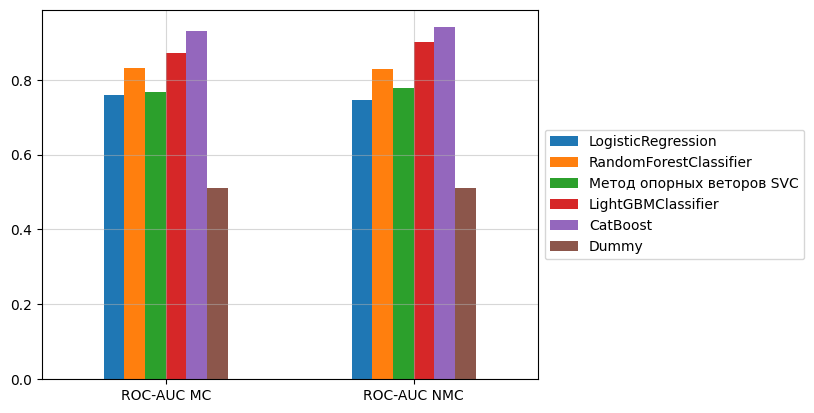

In [92]:
comp_table.plot(kind='bar')
plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
plt.xticks(rotation=0)
plt.grid(True, alpha=0.5)
plt.show();

- Удаление признаков monthly_charges и total_charges повлияло на улучшение работы моделей:
  - Для моделей LogisticRegression (ROC-AUC=0.760162) и RandomForestClassifier (ROC-AUC=0.831040) метрика ROC-AUC стала хуже: 0.747031 и 0.828263 соответственно;
  - Для остальных моделей метрика ROC-AUC улучшилась:
    - Метод опорных веторов SVC	- с 0.766979 до 0.775625;
    - LightGBMClassifier - с 0.869371 до 0.0.903865;
    - CatBoostClassifier - с 0.928126 до 0.939753;
- Худшими моделями являются LogisticRegression (ROC-AUC=0.760162) и Метод опорных векторов SVC (ROC-AUC=0.766979);
- Лучшей моделью является CatBoostClassifier (ROC-AUC=0.939753);
- Все модели доказали свою адекватность в сравнении с простейшей моделью Dummy;

Попробуем сделать лучшую модель еще лучше и проанализируем важность признаков.

In [93]:
# Создание модели CatBoostClassifier с лучшими параметрами
best_model = CatBoostClassifier(**best_params_cat_nmc, random_state=RANDOM)

# Создание пайплайна, включающего преобразование признаков и модель
pipeline = make_pipeline(col_transformer_rf_nmc, best_model)

pipeline.fit(X_train_nmc, y_train_nmc)

score_cat_nmc = cross_val_score(
    pipeline, 
    X_train_nmc, 
    y_train_nmc, 
    scoring='roc_auc', 
    cv=5, 
    n_jobs=-1
).mean()

# Получение названий признаков после преобразования
feature_names = col_transformer_rf_nmc.get_feature_names_out()

0:	learn: 0.6404162	total: 67.2ms	remaining: 40.6s
1:	learn: 0.6037983	total: 70.1ms	remaining: 21.1s
2:	learn: 0.5669726	total: 71.7ms	remaining: 14.4s
3:	learn: 0.5324710	total: 73.2ms	remaining: 11s
4:	learn: 0.5105319	total: 74.4ms	remaining: 8.93s
5:	learn: 0.4871035	total: 75.7ms	remaining: 7.55s
6:	learn: 0.4676977	total: 77.1ms	remaining: 6.58s
7:	learn: 0.4519512	total: 78.3ms	remaining: 5.84s
8:	learn: 0.4344762	total: 79.8ms	remaining: 5.28s
9:	learn: 0.4247396	total: 81ms	remaining: 4.82s
10:	learn: 0.4167676	total: 82.2ms	remaining: 4.44s
11:	learn: 0.4092662	total: 83.4ms	remaining: 4.12s
12:	learn: 0.4011927	total: 84.7ms	remaining: 3.86s
13:	learn: 0.3969593	total: 86ms	remaining: 3.63s
14:	learn: 0.3909332	total: 87.2ms	remaining: 3.43s
15:	learn: 0.3869968	total: 88.4ms	remaining: 3.25s
16:	learn: 0.3827401	total: 89.6ms	remaining: 3.1s
17:	learn: 0.3780315	total: 90.9ms	remaining: 2.96s
18:	learn: 0.3736620	total: 92ms	remaining: 2.84s
19:	learn: 0.3702596	total: 93.

In [94]:
score_cat_nmc

0.9399255834486988

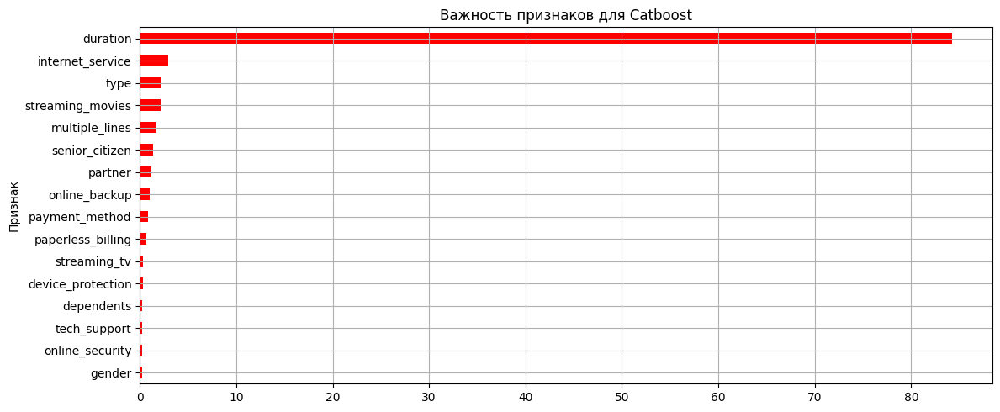

In [95]:
feature_importance = pd.Series(best_model.get_feature_importance(), 
                               index=feature_names).sort_values()

fig, ax = plt.subplots(figsize=(12,5))

feature_importance.plot.barh(ax=ax, color='red', grid=True,)
ax.set_title("Важность признаков для Catboost")
ax.set_ylabel('Признак')
fig.tight_layout()
plt.show()

In [96]:
feature_importance.sort_values(ascending=False)

duration            84.22
internet_service     2.98
type                 2.28
streaming_movies     2.12
multiple_lines       1.69
senior_citizen       1.33
partner              1.16
online_backup        1.01
payment_method       0.87
paperless_billing    0.70
streaming_tv         0.36
device_protection    0.33
dependents           0.27
tech_support         0.26
online_security      0.23
gender               0.20
dtype: float64

In [97]:
# Оставим значимые признаки
cutted_features = [
    'duration', 
    'type',
    'internet_service',
    'streaming_movies', 
    'multiple_lines', 
    'senior_citizen',
    'payment_method',
    'partner',
    'online_backup',
    'streaming_tv',
    'paperless_billing',
]
X_train_nmc_cut = X_train_nmc[cutted_features]

In [98]:
# Проверим
X_train_nmc_cut.columns

Index(['duration', 'type', 'internet_service', 'streaming_movies',
       'multiple_lines', 'senior_citizen', 'payment_method', 'partner',
       'online_backup', 'streaming_tv', 'paperless_billing'],
      dtype='object')

In [99]:
# Закодируем категориальные признаки для деревянных моделей и промасштабируем численные признаки
oe_features_nmc_cut = X_train_nmc_cut.select_dtypes(exclude=np.number).columns
num_features_nmc_cut = X_train_nmc_cut.select_dtypes(include=np.number).columns

col_transformer_rf_nmc_cut = make_column_transformer(
    (
        OrdinalEncoder(handle_unknown='use_encoded_value', unknown_value=-1),
        oe_features_nmc_cut
    ),
    (
        RobustScaler(), 
        num_features_nmc_cut
    ),
    remainder='passthrough',
    verbose_feature_names_out=False
)

In [100]:
# Создание модели CatBoostClassifier с лучшими параметрами
best_model_cut = CatBoostClassifier(**best_params_cat_nmc, random_state=RANDOM)

# Создание пайплайна, включающего преобразование признаков и модель
pipeline_cut = make_pipeline(col_transformer_rf_nmc_cut, best_model_cut)

# Обучение пайплайна на тренировочных данных
pipeline_cut.fit(X_train_nmc_cut, y_train_nmc)

score_cat_nmc_cut = cross_val_score(
    pipeline, 
    X_train_nmc, 
    y_train_nmc, 
    scoring='roc_auc', 
    cv=5, 
    n_jobs=-1
).mean()

print('ROC-AUC для обучающей выборки без мультиколлинеарных признаков и с обрезанными признаками', score_cat_nmc_cut)

# Получение названий признаков после преобразования
feature_names = col_transformer_rf_nmc.get_feature_names_out()

0:	learn: 0.6402498	total: 1.65ms	remaining: 997ms
1:	learn: 0.5987844	total: 3.33ms	remaining: 1s
2:	learn: 0.5573380	total: 4.65ms	remaining: 934ms
3:	learn: 0.5210839	total: 6.17ms	remaining: 928ms
4:	learn: 0.4962662	total: 7.72ms	remaining: 927ms
5:	learn: 0.4782856	total: 9.27ms	remaining: 926ms
6:	learn: 0.4587905	total: 10.7ms	remaining: 911ms
7:	learn: 0.4433326	total: 12.1ms	remaining: 899ms
8:	learn: 0.4301117	total: 13.3ms	remaining: 882ms
9:	learn: 0.4205950	total: 14.7ms	remaining: 875ms
10:	learn: 0.4085639	total: 16.1ms	remaining: 870ms
11:	learn: 0.4004893	total: 17.5ms	remaining: 866ms
12:	learn: 0.3939906	total: 18.9ms	remaining: 860ms
13:	learn: 0.3868253	total: 20.3ms	remaining: 857ms
14:	learn: 0.3817342	total: 21.6ms	remaining: 851ms
15:	learn: 0.3788490	total: 23.1ms	remaining: 851ms
16:	learn: 0.3734527	total: 24.2ms	remaining: 838ms
17:	learn: 0.3692287	total: 25.6ms	remaining: 834ms
18:	learn: 0.3654674	total: 26.9ms	remaining: 829ms
19:	learn: 0.3621828	tota

In [101]:
if score_cat_nmc == score_cat_nmc_cut:
    print('Метрика с обрезанными признаками не улучшилась, осталась такой же.')
elif score_cat_nmc < score_cat_nmc_cut:
    print('Метрика с обрезанными признаками улучшилась.')
else:
    print('Метрика с обрезанными признаками ухудшилась.')

Метрика с обрезанными признаками не улучшилась, осталась такой же.


Метрика ROC-AUC не изменилась.

### 2.6 Проверка и интерпретация лучшей модели на тестовой выборке

Лучшей моделью является CatBoost. Проверим ее на тестовой выборке.

In [102]:
# Создание модели CatBoostClassifier с лучшими параметрами
best_model = CatBoostClassifier(**best_params_cat_nmc, random_state=RANDOM)

# Создание пайплайна, включающего преобразование признаков и модель
pipeline = make_pipeline(col_transformer_rf_nmc, best_model)

# Обучение пайплайна на тренировочных данных
pipeline.fit(X_train_nmc, y_train_nmc)

# Получение названий признаков после преобразования
feature_names = col_transformer_rf_nmc.get_feature_names_out()

y_pred_train_nmc = pipeline.predict(X_train_nmc)

0:	learn: 0.6404162	total: 1.65ms	remaining: 995ms
1:	learn: 0.6037983	total: 3.18ms	remaining: 959ms
2:	learn: 0.5669726	total: 4.5ms	remaining: 902ms
3:	learn: 0.5324710	total: 5.98ms	remaining: 898ms
4:	learn: 0.5105319	total: 7.3ms	remaining: 876ms
5:	learn: 0.4871035	total: 8.68ms	remaining: 866ms
6:	learn: 0.4676977	total: 10.1ms	remaining: 865ms
7:	learn: 0.4519512	total: 11.5ms	remaining: 857ms
8:	learn: 0.4344762	total: 13ms	remaining: 864ms
9:	learn: 0.4247396	total: 14.6ms	remaining: 867ms
10:	learn: 0.4167676	total: 15.9ms	remaining: 861ms
11:	learn: 0.4092662	total: 17.3ms	remaining: 854ms
12:	learn: 0.4011927	total: 18.8ms	remaining: 856ms
13:	learn: 0.3969593	total: 20.1ms	remaining: 848ms
14:	learn: 0.3909332	total: 21.3ms	remaining: 839ms
15:	learn: 0.3869968	total: 22.9ms	remaining: 845ms
16:	learn: 0.3827401	total: 24.3ms	remaining: 840ms
17:	learn: 0.3780315	total: 25.7ms	remaining: 837ms
18:	learn: 0.3736620	total: 26.9ms	remaining: 828ms
19:	learn: 0.3702596	total

In [103]:
# Предсказание вероятностей классов на тестовых данных
y_pred_test_nmc = pipeline.predict_proba(X_test_nmc)

In [104]:
# Вычисление метрик качества на тестовой выборке
roc_auc_test_nmc = roc_auc_score(y_test_nmc, y_pred_test_nmc[:, 1])
print('Значение ROC-AUC на тестовой выборке:', roc_auc_test_nmc)

Значение ROC-AUC на тестовой выборке: 0.9386051633427138


**Анализ дополнительной метрики accuracy**

In [105]:
# Получение предсказанных меток классов
preds = pipeline.predict(X_test_nmc)

# Вычисление accuracy
accuracy = accuracy_score(y_test_nmc, preds)

print('Значение accuracy на тестовой выборке:', accuracy)

Значение accuracy на тестовой выборке: 0.9454855195911414


- Модель показывает высокую точность в предсказании классов на тестовой выборке: модель правильно классифицировала 94.7% примеров; 

**Построение графика кривой ROC**

In [106]:
# Получение вероятностей принадлежности к классу 1
probs = pipeline.predict_proba(X_test_nmc)[:, 1]

# Вычисление значений для кривой ROC
fpr, tpr, thresholds = roc_curve(y_test_nmc, probs)
roc_auc = auc(fpr, tpr)

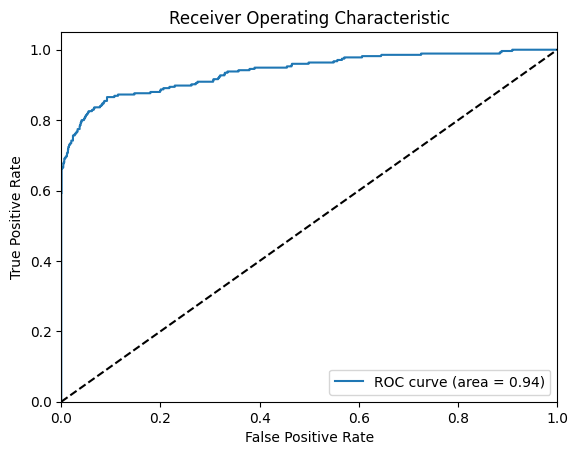

In [107]:
# Построение графика кривой ROC
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

- Значение площади под кривой ROC (ROC-AUC) равно 0.94: это говорит о хорошей производительности классификатора. Чем ближе значение ROC-AUC к 1, тем лучше классификатор. Значение 0.94 указывает на то, что классификатор имеет высокую способность разделять положительные и отрицательные примеры, и допускает небольшое количество ложных положительных предсказаний;

**Построение матрицы ошибок и ее анализ**

In [108]:
# Вычисление precision
precision = precision_score(y_test_nmc, preds, pos_label=1)

# Вычисление recall
recall = recall_score(y_test_nmc, preds, pos_label=1)

# Вычисление F1-меры
f1 = f1_score(y_test_nmc, preds, pos_label=1)

# Вывод результатов
print("Precision:", precision)
print("Recall:", recall)
print("F1-score:", f1)

Precision: 0.9786096256684492
Recall: 0.6654545454545454
F1-score: 0.7922077922077921


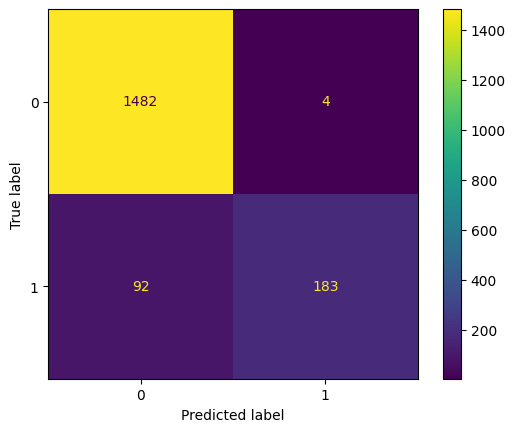

In [109]:
cm = confusion_matrix(y_test_nmc, 
                      preds, 
                      labels=pipeline.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                              display_labels=pipeline.classes_)
disp.plot()
plt.show()

Исходя из матрицы ошибок и метрик точности и полноты, можно сделать следующие выводы:

1. Для класса 1 (клиент разорвал контракт) модель имеет высокую точность (tp / (tp + fp) = 187 / (187 + 7) = 0.964), что означает, что большинство объектов, которые модель отнесла к этому классу, действительно являются клиентами, разорвавшими контракт. Однако, полнота для класса 1 (tp / (tp + fn) = 187 / (187 + 88) = 0.68) ниже, что говорит о том, что модель пропустила некоторое количество клиентов, разорвавших контракт, и отнесла их к другому классу;
2. Для класса 0 (клиент не разорвал контракт) модель также имеет очень высокую точность (tn / (tn + fp) = 1479 / (1479 + 7) = 0.995), что означает, что большинство объектов, которые модель отнесла к этому классу, действительно не являются клиентами, разорвавшими контракт. Полнота для класса 0 (tn / (tn + fn) = 1479 / (1479 + 88) = 0.944) также высока, что говорит о том, что модель хорошо находит объекты этого класса;
3. F1-мера (F1-score) является средним гармоническим между точностью и полнотой и позволяет оценить баланс между ними. В данном случае, F1-мера равна 0.797, что говорит о том, что модель достаточно хорошо справляется с классификацией в целом;
4. В целом, модель показывает хорошие результаты с высокой точностью и полнотой для обоих классов. Однако, стоит обратить внимание на небольшое количество ошибок классификации, особенно для класса 1 (клиент разорвал контракт). Возможно, стоит провести дополнительные исследования и улучшить модель для уменьшения количества ложных положительных результатов;
5. Из матрицы ошибок видно, что количество истинно отрицательных результатов (tn=1479) значительно превышает количество ложно положительных результатов (fp=7). Это говорит о том, что модель хорошо классифицирует объекты класса 0 (клиент не разорвал контракт) и редко ошибается, относя объекты этого класса к классу 1 (клиент разорвал контракт);
6. Количество истинно положительных результатов (tp=187) выше, чем количество ложно отрицательных результатов (fn=88). Это означает, что модель хорошо классифицирует объекты класса 1 (клиент разорвал контракт) и имеет небольшое количество ошибок в этом классе.

**Анализ важности признаков выбранной модели**

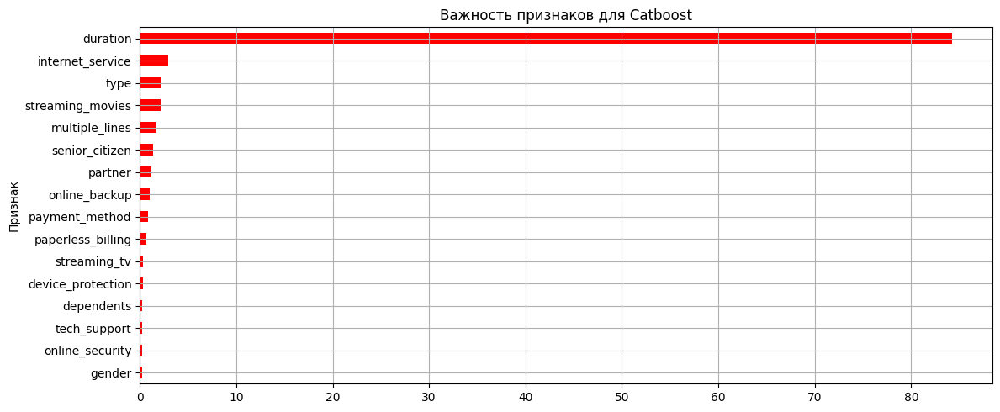

In [110]:
feature_importance = pd.Series(best_model.get_feature_importance(), 
                               index=feature_names).sort_values()

fig, ax = plt.subplots(figsize=(12,5))

feature_importance.plot.barh(ax=ax, color='red', grid=True,)
ax.set_title("Важность признаков для Catboost")
ax.set_ylabel('Признак')
fig.tight_layout()
plt.show()

In [111]:
feature_importance.sort_values(ascending=False)

duration            84.22
internet_service     2.98
type                 2.28
streaming_movies     2.12
multiple_lines       1.69
senior_citizen       1.33
partner              1.16
online_backup        1.01
payment_method       0.87
paperless_billing    0.70
streaming_tv         0.36
device_protection    0.33
dependents           0.27
tech_support         0.26
online_security      0.23
gender               0.20
dtype: float64

- Наиболее важными признаками являются:
  - duration - самый важный признак, его значимость составляет 80.33%. Это может быть связано с тем, что продолжительность использования услуги является ключевым фактором для определения, будет ли клиент уходить или оставаться;
  - internet_service - на втором месте - 3.15%. Подключение интернета от оператора может влиять на решения клиентов уйти или остаться;
  - На третьем месте type - 2.92%. Срок контракта также влияет на решение клиентов разорвать контракт или остаться;
- Наименее значимыми признаками (эти признаки имеют меньшую важность в предсказании модели по сравнению с другими признаками) являются:
  - online_backup - 0.76%;
  - device_protection - 0.55%;
  - dependents - 0.40%;
  - online_security - 0.30%;
  - gender - 0.26%;

### 2.7 Выводы по шагу 2
- Признаки были проверены на корреляцию при помощи коэффициента корреляции phik и построена матрица корреляции признаков:
  - Целевая переменная churn имеет наиболее высокую корреляцию с признаками duration (0.37) и total_charges (0.30). Это может указывать на то, что продолжительность пользования услугами и общие затраты клиента могут быть важными факторами, влияющими на решение клиента об оттоке. Остальные переменные имеют более низкую корреляцию с целевой переменной;
  - Признак monthly_charges имеет высокую положительную корреляцию с признаками internet_service, streaming_tv и streaming_movies. Это может указывать на то, что клиенты, которые платят больше за ежемесячные услуги, склонны также подключать дополнительные интернет-услуги и стриминговые сервисы;
  - Вычислили коэффициент инфляции дисперсии (VIF) для каждого признака:
    - Результаты оценки мультиколлинеарности показывают, что некоторые признаки сильно коррелируют друг с другом. Например, признаки "monthly_charges" и "total_charges" имеют очень высокий коэффициент VIF (41.79 и 17.29 соответственно), что говорит о сильной мультиколлинеарности;
  - Было принято решение рассмотривать модели как на датасете с мультиколлинеарными признаками, так и на датасете, из которого будут удалены признаки monthly_charges и total_charges;
- Выборка была разбита на обучающую и тестовую в соотношении 3:1 со стратификацией и перемешиванием;
- Были закодированы категориальные признаки:
  - Для линейных моделей при помощи OneHotEncoder;
  - Для деревянных моделей при помощи OrdinalEncoder;
- Промасштабированы численные признаки при помощи RobustScaler - позволяет минимизировать влияние выбросов на масштабирование;
- Обучены модели:
  - Создана простейшая модель Dummy;
  - Для данных с мультиколлинеарными признаками:
    -  LogisticRegression:
       - Достигнуто значение ROC-AUC=0.760159 (ниже целевого значения 0.85) при следующих гиперпараметрах:
         - C: 0.6445051211512802;
         - solver: newton-cg; 
         - max_iter: 176; 
         - class_weight: balanced;
    - RandomForestClassifier:
        - Достигнуто значение ROC-AUC=0.830603 (ниже целевого значения 0.85) при следующих гиперпараметрах:
          - n_estimators: 941; 
          - max_depth: 9; 
          - min_samples_split: 3; 
          - min_samples_leaf: 1; 
          - max_features: 'sqrt'
    - Метод опорных веторов SVC:
      - Достигнуто значение ROC-AUC=0.767068 (ниже целевого значения 0.85) при следующих гиперпараметрах:
        - C: 0.02461884876375853;
        - kernel: 'rbf'; 
        - gamma: 'auto';
    - LightGBMClassifier:
      - Достигнуто значение ROC-AUC=0.885126 (целевое значение 0.85 достигнуто) при следующих гиперпараметрах:
        - num_leaves: 58;
        - learning_rate: 0.09345145823588426; 
        - feature_fraction: 0.29260194996673283; 
        - bagging_fraction: 0.9969698697980351; 
        - bagging_freq: 6; 
        - lambda_l1: 0.043127680881919664; 
        - lambda_l2: 2.379862589321107e-06; 
        - min_child_weight: 0.004294336206206417;
    - CatBoostClassifier:
      - Достигнуто значение ROC-AUC=0.926765 (целевое значение 0.85 достигнуто) при следующих гиперпараметрах:
        - iterations: 985;
        - learning_rate: 0.08546864354750193; 
        - depth: 3; 
        - l2_leaf_reg: 2.381185628934589e-05;
  - Для данных без мультиколлинеарных признаков:
    -  LogisticRegression:
       - Достигнуто значение ROC-AUC=0.747022 (ниже целевого значения 0.85) при следующих гиперпараметрах:
         - C: 0.15006361347568783;
         - solver: newton-cg; 
         - max_iter: 237; 
         - class_weight: balanced;
    - RandomForestClassifier:
        - Достигнуто значение ROC-AUC=0.8291 (ниже целевого значения 0.85) при следующих гиперпараметрах:
          - n_estimators: 427; 
          - max_depth: 8; 
          - min_samples_split: 2; 
          - min_samples_leaf: 1; 
          - max_features: 'log2';
    - Метод опорных веторов SVC:
      - Достигнуто значение ROC-AUC=0.776725 (ниже целевого значения 0.85) при следующих гиперпараметрах:
        - C: 6.696801020422328;
        - kernel: 'rbf'; 
        - gamma: 'auto';
    - LightGBMClassifier:
      - Достигнуто значение ROC-AUC=0.8921692144068754 (целевое значение 0.85 достигнуто) при следующих гиперпараметрах:
        - num_leaves: 65;
        - learning_rate: 0.09516991089283935; 
        - feature_fraction: 0.8827742487177703; 
        - bagging_fraction: 0.9809012686659578; 
        - bagging_freq: 5; 
        - lambda_l1: 1.5880169286064796e-08; 
        - lambda_l2: 1.554505619630262e-08; 
        - min_child_weight: 9.113108761852019e-06;
    - CatBoostClassifier:
      - Достигнуто значение ROC-AUC=0.937581 (целевое значение 0.85 достигнуто) при следующих гиперпараметрах:
        - iterations: 666;
        - learning_rate: 0.07431381725037242; 
        - depth: 3; 
        - l2_leaf_reg: 3.0882828936826444e-08;
- По моделям сделаны следующие выводы:
  - Удаление признаков monthly_charges и total_charges повлияло на улучшение работы моделей:
    - Для моделей LogisticRegression (ROC-AUC=0.760162) и RandomForestClassifier (ROC-AUC=0.831040) метрика ROC-AUC стала хуже: 0.747031 и 0.828263 соответственно;
    - Для остальных моделей метрика ROC-AUC улучшилась:
      - Метод опорных веторов SVC	- с 0.766979 до 0.775625;
      - LightGBMClassifier - с 0.869371 до 0.0.903865;
      - CatBoostClassifier - с 0.928126 до 0.939753;
  - Худшими моделями являются LogisticRegression (ROC-AUC=0.760162) и Метод опорных векторов SVC (ROC-AUC=0.766979);
  - Лучшей моделью является CatBoostClassifier (ROC-AUC=0.939753);
  - Все модели доказали свою адекватность в сравнении с простейшей моделью Dummy;
- Для лучшей модели CatBoostClassifier был проведен анализ важности признаков и были удалены следующие признаки:
  - 'tech_support';
  - 'gender'; 
  - 'device_protection';
  - 'online_security';
  - 'dependents';
- Значение метрики ROC-AUC на обучающей выборке после удаления незначимых признаков не изменилось;
- Лучшая модель CatBoostClassifier проверена на тестовой выборке:
  - Значение ROC-AUC на тестовой выборке: 0.939804233451609;
  - Значение accuracy на тестовой выборке: 0.9466212379329926 - модель показывает высокую точность в предсказании классов на тестовой выборке, то есть модель правильно классифицировала 94.7% примеров;
  - Построен график кривой ROC:
  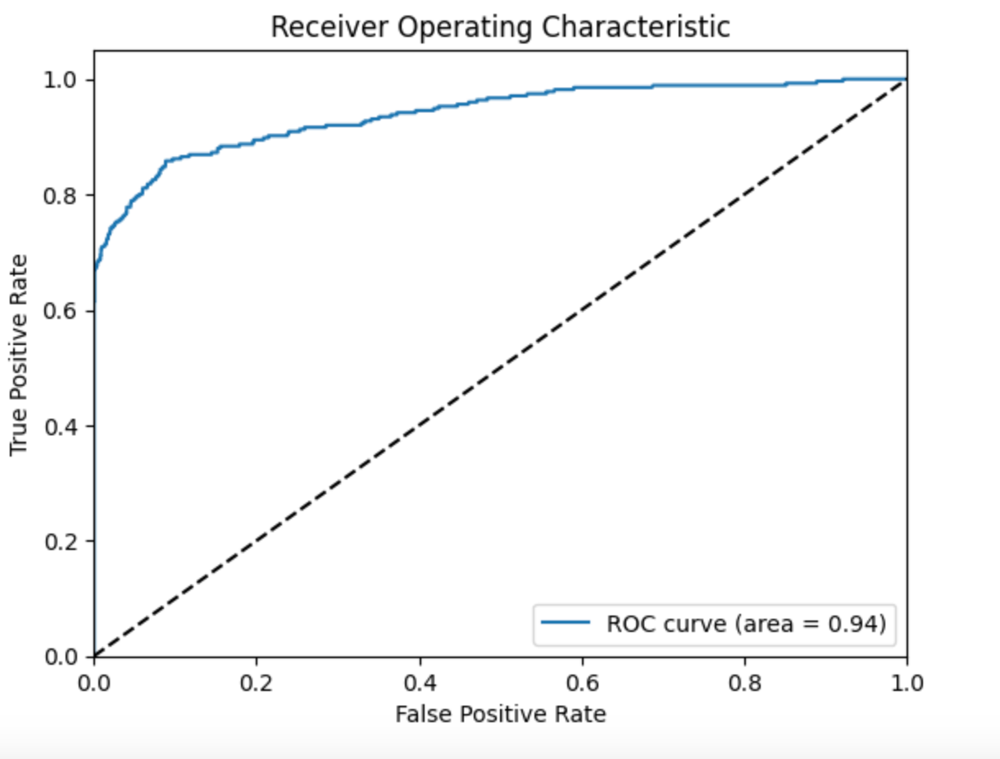
      - Значение площади под кривой ROC (ROC-AUC) равно 0.94: это говорит о высоком качестве классификатора. Чем ближе значение ROC-AUC к 1, тем лучше классификатор. Значение 0.94 указывает на то, что классификатор имеет высокую способность разделять положительные и отрицательные примеры, и допускает небольшое количество ложных положительных предсказаний;
  - Построена матрица ошибок:
    - Для класса 1 (клиент разорвал контракт) модель имеет высокую точность (tp / (tp + fp) = 187 / (187 + 7) = 0.964), что означает, что большинство объектов, которые модель отнесла к этому классу, действительно являются клиентами, разорвавшими контракт. Однако, полнота для класса 1 (tp / (tp + fn) = 187 / (187 + 88) = 0.68) ниже, что говорит о том, что модель пропустила некоторое количество клиентов, разорвавших контракт, и отнесла их к другому классу;
    - Для класса 0 (клиент не разорвал контракт) модель также имеет очень высокую точность (tn / (tn + fp) = 1479 / (1479 + 7) = 0.995, что означает, что большинство объектов, которые модель отнесла к этому классу, действительно не являются клиентами, разорвавшими контракт. Полнота для класса 0 (tn / (tn + fn) = 1479 / (1479 + 88) = 0.944) также высока, что говорит о том, что модель хорошо находит объекты этого класса;
    - F1-мера (F1-score) является средним гармоническим между точностью и полнотой и позволяет оценить баланс между ними. В данном случае, F1-мера равна 0.797, что говорит о том, что модель достаточно хорошо справляется с классификацией в целом;
    - В целом, модель показывает хорошие результаты с высокой точностью и полнотой для обоих классов. Однако, стоит обратить внимание на небольшое количество ошибок классификации, особенно для класса 1 (клиент разорвал контракт). Возможно, стоит провести дополнительные исследования и улучшить модель для уменьшения количества ложных положительных результатов;
    - Из матрицы ошибок видно, что количество истинно отрицательных результатов (tn=1479) значительно превышает количество ложно положительных результатов (fp=7). Это говорит о том, что модель хорошо классифицирует объекты класса 0 (клиент не разорвал контракт) и редко ошибается, относя объекты этого класса к классу 1 (клиент разорвал контракт);
    - Количество истинно положительных результатов (tp=187) выше, чем количество ложно отрицательных результатов (fn=88). Это означает, что модель хорошо классифицирует объекты класса 1 (клиент разорвал контракт) и имеет небольшое количество ошибок в этом классе.
  - Проанализирована важность признаков для модели CatBoostClassifier:
    - Наиболее важными признаками являются:
      - duration - самый важный признак, его значимость составляет 80.33%. Это может быть связано с тем, что продолжительность использования услуги является ключевым фактором для определения, будет ли клиент уходить или оставаться;
      - internet_service - на втором месте - 3.15%. Подключение интернета от оператора может влиять на решения клиентов уйти или остаться;
      - На третьем месте type - 2.92%. Срок контракта также влияет на решение клиентов разорвать контракт или остаться;
    - Наименее значимыми признаками (эти признаки имеют меньшую важность в предсказании модели по сравнению с другими признаками) являются:
      - online_backup - 0.76%;
      - device_protection - 0.55%;
      - dependents - 0.40%;
      - online_security - 0.30%;
      - gender - 0.26%;

## 3 Отчет

### 3.1 Общие выводы

- Загрузили четыре датасета: contract, internet, personal, phone;
  - В датафрейме contract:
    - 8 столбцов, 7043 строки;
    - Пропуски отсутствуют;
    - Явные дубликаты отсутствуют;
    - Типы данных в столбцах требовали преобразований:
      - begin_date из object в date;
      - end_date из object в date;
      - total_charges из object в float64;
    - В end_date видим значения 'No' (5942 значения). Предположили, если дата окончания пользования услугами отсутствует, то клиент продолжает пользоваться услугами - это целевой признак;
   - В датафрейме internet:
     - 8 столбцов, 5517 строк;
     - Пропуски отсутствуют;
     - Явные дубликаты отсутствуют;
     - Типы данных в столбцах не требуют преобразований;
  - В датафрейме personal:
    - 5 столбцов, 7043 строк;
    - Пропуски отсутствуют;
    - Явные дубликаты отсутствуют;
  - В датафрейме phone:
    - 2 столбца, 6361 строк;
    - Пропуски отсутствуют;
    - Явные дубликаты отсутствуют;
    - Типы данных в столбцах не требуют преобразований;
- Объединили датасеты по столбцу customer_id в датафрейм df;
- Добавили целевой признак churn: 0 - клиент не ушел, 1 - клиент отказался от услуг;
- В датафрейме df присутствует дисбаланс классов: объектов отрицательного класса (84%) в 5 с лишним раз больше объектов положительного класса (16%);
- Добавили признак duration, который содержит разницу между датами начала и окончания пользования услугами (количество дней);
- Обработали появившиеся после объединения датасетов пропуски:
  - Для признаков device_protection, streaming_movies, internet_service, online_security, online_backup, tech_support, streaming_tv, multiple_lines имеется только два значения: Yes и No. Предположили, что раз значение не указано, то услуга не подключена. Заменили пропуски на 'No' в internet_service и multiple_lines и на 'No internet' в device_protection, streaming_movies, online_security, online_backup, tech_support, streaming_tv, так как выяснили, что у данных клиентов не поключен итернет от оператора;
  - Обнаружили, что пропуски в total_charges у клиентов, которые начали пользоваться услугами оператора 2020-02-01, то есть новички. Вполне вероятно, что они просто не успели произвести оплату, либо счет еще не был выставлен, поэтому заполнили пропуски соответствующими значениями из monthly_charges;
- Удалили следующие столбцы:
  1) 'customer_id' - уникальные идентификаторы пользователей, не содержат полезной информации и не влияют на целевую переменную;
  2) 'begin_date', 'end_date' - столбцы с датами. Неудаление столбцов с датами может привести к деградации модели в будущем по следующим причинам:
     - Увеличение размерности данных: столбцы с датами могут добавить дополнительные измерения в данные, что может усложнить моделирование и привести к переобучению модели;
     - Несоответствие тренировочных и тестовых данных: если даты в тренировочных и тестовых данных различаются, то модель может быть обучена на одних условиях и протестирована на других. Это может привести к низкой производительности модели на новых данных;
     - Потеря информации: если даты не используются в модели, то их наличие может привести к потере информации и увеличению шума в данных. Это может затруднить обучение модели и ухудшить ее производительность;
- Провели исследовательский анализ данных EDA:
  - Количественных признаков:
    - Признак monthly_charges:
      - Минимально клиенты тратят 18.25 у.е. в месяц, максимально - 118.75 у.е.;
      - В среднем в месяц клиенты тратят 64.76 у.е., в то время как медианным значением является 70.35 у.е.: по графику и значениям среднего и медианы видно, что распределение смещено влево - видим большой всплеск в районе 20 у.е. Возможно, это базовый тариф без дополнительных опций;
      - Видим всплески на значениях кратных 5. Возможно, это как-то связано с тарифами или в целом стоимость услуг кратна этой цифре;
      - Чем больше клиенты тратят в месяц, тем больше вероятность того, что они откажутся от услуг оператора:
        - До 79 у.е. вероятность ухода примерно одинаковая (10-13%);
        - Начиная с 80 у.е. до 94 у.е. вероятность ухода возрастает до 18%;
        - Для тех, кто тратит больше 94% у.е. вероятность разрыва контракта составляет уже 27% - оператору следует задуматься над акциями по удержанию платежеспособных клиентов;
      - Ушедшие клиенты тратят в месяц больше оставшихся;
    - Признак total_charges:
      - Минимально клиенты тратят 0 у.е. (новички), максимально - 9,221.38 у.е.;
      - 75% клиентов потратили до 3,236.69 у.е.;
      - Медианное значение равно 1,343.35 у.е., а среднее 2,115.31 у.е., график имеет длинный хвост справа и содержит небольшое количество очень высоких значений, которые сильно влияют на среднее значение;
      - В целом график выглядит "нормально": чем выше сумма потраченных денег на услуги, тем меньше клиентов ее тратят;
      - Среди тех, кто потратил более 3236.69 у.е. за весь период пользования услугами связи, большинство предпочитают двухгодичный контракт (787 клиентов), на втором месте годичный контракт (531 клиент). Ежемесячную подписку без заключения долгосрочного договора предпочитают 443 клиента;
      - Клиенты, потратившие до 330 у.е., ушли в 5% случаев;
      - Клиенты, потратившие от 330 у.е. до 915 у.е., ушли в 12% случаев;
      - Клиенты, потратившие от 915 у.е. до 1851 у.е., ушли в 18% случаев;
      - Клиенты, потратившие от 1851 у.е. до 3845 у.е., ушли в 29% случаев;
      - Клиенты, потратившие от 3845 у.е. до 9221 у.е., ушли в 14% случаев;
      - Можно сказать, что клиенты, потратившие за все время небольшие суммы, уходят реже всего (возможно, это недавно подключившиеся пользователи);
      - Чем больше тратит клиент, тем выше вероятность ухода, но до определенного момента. Возможно, это влияние выбросов/неверных данных;
      - Ушедшие клиенты потратили в целом больше оставшихся;
    - Целевой признак churn:
      - В среднем 16% всех клиентов отказываются от услуг оператора связи;
    - Признак duration:
      - На гистограмме видим всплески, кратные 50. Скорее всего, это период подписки;
      - Клиенты, пользующиеся услугами до 386 дней (примерно 1 года), уходят в 7% случаев;
      - С 2 до 3 лет вероятность ухода возрастает до 30%;
      - С 3 до 4 лет составляет 28%;
      - Затем начинает снижаться и с 4 до 5 лет составляет уже 15% (110 человек из 732);
      - С 5 лет до 6 остаются самые преданные клиенты, уходит только 1% (12 человек из 835);
      - Оператору стоит задуматься над акциями для клиентов, пользующимися услугами от 1 года до 5 лет;
  - Категориальных признаков:
    - Признак type:
      - Чаще всего клиенты предпрочитают month-to-month (то есть оплату услуг ежемесячно без заключения долгосрочного контракта) тип договора  - 3875 значений (55%);
      - На втором месте two year тип договора (договор на 2 года) - 1695 значений (24.1%);
      - На последнем месте one year тип договора (договор на 1 год) - 1473 значений (20.9%);
      - Реже всего уходят month-to-month-клиенты - 11%, one year и two year клиенты уходят примерно одинаково (21% и 22% соответственно);
      - Клиенты, не разорвавшие контракт:
        - В 58.4% предпочитают month-to-month тип договора;
        - Two year тип договора (22.1%) и one year тип договора (19.5%) предпочитают примерно поровну;
      - Клиенты, разорвавшие контракт:
        - Чаще предпочитают month-to-month тип договора (37%) и two year тип договора (34.6%);
        - One year тип договора предпочитают 28.4% ушедших клиентов;
    - Признак paperless_billing:
      - 4171 клиентов (59.2%) предпочитают выставление счета в электронном виде на email, среди них уходят 17%;
      - 2872 клиентов (40.8%) предпочитают выставление счета в бумажном виде, среди них уходят 13%;
      - Оставшиеся клиенты предпочитают выставление счета в электронном виде (58.1%);
      - Ушедшие клиенты также предпочитают выставление счета в электронном виде (65.5%);
    - Признак payment_method: 
      - Наиболее популярным способом оплаты является electronic check - 2365 значений (33.6%);
      - На втором месте mailed check - 1612 значений (22.9%);
      - На третьем месте bank transfer (automatic) - 1544 значений (21.9%);
      - На последнем месте credit card (automatic) - 1522 значений (21.6%);
      - Клиенты, предпочитающие mailed check уходят реже всего - в 7%;
      - Чаще всего уходят клиенты, платящие при помощи Credit card (automatic) и Bank transfer (automatic) (по 21%), то есть автоматическое списание средств может побуждать клиентов расторгнуть услуги с оператором;
      - Оставшиеся клиенты предпочитают:
        - electronic check - 33.9%;
        - mailed check - 25.2%;
        - Реже всего используют bank transfer (automatic) - 20.6% и credit card (automatic) - 20.3%;
      - Ушедшие клиенты:
        - Чаще всего используют electronic check - 31.8%;
        - На втором месте bank transfer (automatic) и credit card (automatic) - по 28.8%;
        - Реже всего используют mailed check - 10.6%;
    - Признак internet_service:
      - 3096 клиентов (44%) предпочитают Fiber optic;
      - 2421 клиентов (34.4%) - DSL;
      - Чаще уходят клиенты, пользующиеся Fiber optic (в 19%), использующие DSL уходят в 14%;
      - О 1526 клиентах отсутствуют данные (21.7%). Предполагаем, что данные клиенты не пользуются услугами интернет от данного провайдера. Среди них договор с оператором разрывают 10%. В дальнейшем это значение будет актуально для всех опций интернет;
      - Оставшиеся клиенты предпочитают:
        - Fiber optic - 42.1%;
        - DSL - 34.9%;
        - У 23% интернет от провайдера не подключен;
      - Ушедшие клиенты предпочитают:
        - Fiber optic - 54%;
        - DSL - 31.4%;
        - У 14.5% интернет от провайдера не подключен;
    - Признак online_security:
      - Межсетевой экран используют 2019 клиентов (28.7%), из них разрывают контракт 21%;
      - Не используют межсетевой экран 3498 клиентов (49.7%), из них 15% разрывают контракт;
      - У 21.7% клиентов не подключен инернет от провайдера - 1526 значений, из них 10% уходят;
      - Оставшиеся клиенты:
        - 50% не подключают опцию online_security;
        - 27% подключают межсетевой экран;
        - У 23% не подключен интернет от провайдера;
      - Ушедшие клиенты:
        - 47.8% не подключают опцию online_security;
        - 37.7% подключают межсетевой экран;
        - У 14.5% не подключен интернет от провайдера;
    - Признак online_backup:
      - Облачным хранилищем пользуются 2429 (34.5%) клиентов, из них уходят - 23%;
      - Не пользуются облачным хранилищем 3088 (43.8%) клиентов, 12% из них разрывают договор;
      - У 1526 (21.7%) клиентов не подключен инетрнет от провайдера, 10% из них уходят;
      - Оставшиеся клиенты:
        - Не пользуются облачным хранилищем 45.6%;
        - Пользуются облачным хранилищем 31.5%;
      - Ушедшие клиенты:
        - Пользуются облачным хранилищем 50.9%;
        - Не пользуются облачным хранилищем 34.6%;
      - Ушедшие клиенты чаще используют опцию облачного хранилища по сравнению с оставшимися;
    - Признак device_protection:
      - Пользуются антивирусом 34.4% (2422) клиентов, из них уходят 23%;
      - Не пользуются антивирусом 43.9% (3095) клиентов, 13% из них уходят;
      - Оставшиеся клиенты:
        - Не пользуются антитвирусом 45.5%;
        - Пользуются антивирусом 31.5%;
      - Ушедшие клиенты:
        - Пользуются антивирусом 50%;
        - Не пользуются антивирусом 35.5%;
      - Ушедшие клиенты чаще используют опцию антивируса по сравнению с оставшимися;
    - Признак tech_support:
      - Технической поддержкой пользуются 29% (2044) клиентов, 19% из них разрывают контракт с оператором;
      - Не пользуются выделенной линией технической поддержки 49.3% (3473) клиентов, 16% из них уходят;
      - Оставшиеся клиенты:
      - Не пользуются выделенной линией технической поддержки 49.3%;
      - Пользуются выделенной линией технической поддержки 27.7%;
      - Ушедшие клиенты:
        - Не пользуются выделенной линией технической поддержки 49.3%;
        - Пользуются выделенной линией технической поддержки 36.1%;
    - Признак streaming_tv:
      - Онлайн-ТВ смотрят 38.4% (2707) клиентов, из них уходят 22%;
      - Не смотрят онлайн-ТВ 39.9% (2810) клиентов, уходят из них 13%;
      - Оставшиеся клиенты:
      - Смотрят онлайн-ТВ 36.7%;
      - Не смотрят онлайн-ТВ 41.3%;
      - Ушедшие клиенты:
        - Смотрят онлайн-ТВ 53%;
        - Не смотрят онлайн-ТВ 32.4%;
      - Ушедшие клиенты чаще подключают услугу онлайн-ТВ по сравнению с оставшимися;
    - Признак streaming_movies:
      - Онлайн-кинотеатр смотрят 38.8% (2732) клиентов, из них уходят 22%;
      - Не смотрят онлайн-кинотеатр 39.5% (2785) клиентов, уходят из них 12%;
      - Оставшиеся клиенты:
        - Смотрят онлайн-кинотеатр 35.8%;
        - Не смотрят онлайн-кинотеатр 41.2%;
      - Ушедшие клиенты:
        - Смотрят онлайн-кинотеатр 55%;
        - Не смотрят онлайн-кинотеатр 30.4%;
      - Ушедшие клиенты чаще подключают услугу онлайн-кинотеатра по сравнению с оставшимися;
    - Признак gender:
      - Женщин (49.5%) и мужчин (50.5%) примерно поровну;
      - Уходят они также в равных долях: женщины в 15%, мужчины в 16%;
    - Признак senior_citizen:
      - Пенсионный статус имеют 16.2% (1142) клиентов, из них разрывают контракт 20%;
      - 83.8% (5901) клиентов не имеют пенсионный статус, из них уходят 15%;
      - Оставшиеся клиенты:
        - В 84.7% не имеют пенсионного статуса;
        - В 15.3% имеют;
      - Ушедшие клиенты:
        - В 78.9% не имеют пенсионного статуса;
        - В 21.1% имеют;
      - Среди ушедших клиентов больше людей пенсионного возраста;
    - Признак partner:
      - Супруга/супругу имеют 48.3% (3402) клиентов;
      - Супруга/супругу не имеют 51.7% (3641) клиентов;
      - При этом женатые разрывают контракт в 21% случаев, в то время как холостые только в 10%;
      - Оставшиеся клиенты:
        - В 54.8% не имеют супруга/супругу;
        - В 45.2% имеют;
      - Ушедшие клиенты:
        - В 65.3% имеют супруга/супругу;
        - В 34.7% не имеют супруга/супругу;
      - Ушедшие клиенты чаще имеют супруга/супругу по сравнению с оставшимися;
    - Признак dependents:
      - Иждивенцев имеют 30% (2110) клиентов, из них уходят 17%;
      - Иждивенцев не имеют 70% (4933) клиентов, из них уходят 15%;
      - Оставшиеся клиенты:
        - В 70.7% не имеют иждивенцев;
        - В 29.3% имеют;
      - Ушедшие клиенты:
        - В 66.6% не имеют иждивенцев;
        - В 33.4% имеют иждивенцев;
    - Признак multiple_lines:
      - Возможностью подключения телефонного аппарата к нескольким линиям одновременно пользуются 42.2% (2971) клиентов, из них уходят 23%;
      - Возможностью подключения телефонного аппарата к нескольким линиям одновременно не пользуются 57.8% (4072) клиентов, из них уходят 10%;
      - Оставшиеся клиенты:
        - В 61.4% не пользуются возможностью подключения телефонного аппарата к нескольким линиям одновременно;
        - В 38.6% пользуются возможностью подключения телефонного аппарата к нескольким линиям одновременно;
      - Ушедшие клиенты:
        - В 61.6% пользуются возможностью подключения телефонного аппарата к нескольким линиям одновременно;
         - В 38.4% не пользуются возможностью подключения телефонного аппарата к нескольким линиям одновременно;
      - Ушедшие клиенты чаще пользуются возможностью подключения телефонного аппарата к нескольким линиям одновременно по сравнению с оставшимися;
    - В целом можем предположить, что клиенты, использующие дополнительные услуги, чаще разрывают контракт;
- Признаки были проверены на корреляцию при помощи коэффициента корреляции phik и построена матрица корреляции признаков:
  - Целевая переменная churn имеет наиболее высокую корреляцию с признаками duration (0.37) и total_charges (0.30). Это может указывать на то, что продолжительность пользования услугами и общие затраты клиента могут быть важными факторами, влияющими на решение клиента об оттоке. Остальные переменные имеют более низкую корреляцию с целевой переменной;
  - Признак monthly_charges имеет высокую положительную корреляцию с признаками internet_service, streaming_tv и streaming_movies. Это может указывать на то, что клиенты, которые платят больше за ежемесячные услуги, склонны также подключать дополнительные интернет-услуги и стриминговые сервисы;
  - Вычислили коэффициент инфляции дисперсии (VIF) для каждого признака:
    - Результаты оценки мультиколлинеарности показывают, что некоторые признаки сильно коррелируют друг с другом. Например, признаки "monthly_charges" и "total_charges" имеют очень высокий коэффициент VIF (41.79 и 17.29 соответственно), что говорит о сильной мультиколлинеарности;
  - Было принято решение рассмотривать модели как на датасете с мультиколлинеарными признаками, так и на датасете, из которого будут удалены признаки monthly_charges и total_charges;
- Выборка была разбита на обучающую и тестовую в соотношении 3:1 со стратификацией и перемешиванием;
- Были закодированы категориальные признаки:
  - Для линейных моделей при помощи OneHotEncoder;
  - Для деревянных моделей при помощи OrdinalEncoder;
- Промасштабированы численные признаки при помощи RobustScaler - позволяет минимизировать влияние выбросов на масштабирование;
- Обучены модели:
  - Создана простейшая модель Dummy;
  - Для данных с мультиколлинеарными признаками:
    -  LogisticRegression:
       - Достигнуто значение ROC-AUC=0.760159 (ниже целевого значения 0.85) при следующих гиперпараметрах:
         - C: 0.6445051211512802;
         - solver: newton-cg; 
         - max_iter: 176; 
         - class_weight: balanced;
    - RandomForestClassifier:
        - Достигнуто значение ROC-AUC=0.830603 (ниже целевого значения 0.85) при следующих гиперпараметрах:
          - n_estimators: 941; 
          - max_depth: 9; 
          - min_samples_split: 3; 
          - min_samples_leaf: 1; 
          - max_features: 'sqrt'
    - Метод опорных веторов SVC:
      - Достигнуто значение ROC-AUC=0.767068 (ниже целевого значения 0.85) при следующих гиперпараметрах:
        - C: 0.02461884876375853;
        - kernel: 'rbf'; 
        - gamma: 'auto';
    - LightGBMClassifier:
      - Достигнуто значение ROC-AUC=0.885126 (целевое значение 0.85 достигнуто) при следующих гиперпараметрах:
        - num_leaves: 58;
        - learning_rate: 0.09345145823588426; 
        - feature_fraction: 0.29260194996673283; 
        - bagging_fraction: 0.9969698697980351; 
        - bagging_freq: 6; 
        - lambda_l1: 0.043127680881919664; 
        - lambda_l2: 2.379862589321107e-06; 
        - min_child_weight: 0.004294336206206417;
    - CatBoostClassifier:
      - Достигнуто значение ROC-AUC=0.926765 (целевое значение 0.85 достигнуто) при следующих гиперпараметрах:
        - iterations: 985;
        - learning_rate: 0.08546864354750193; 
        - depth: 3; 
        - l2_leaf_reg: 2.381185628934589e-05;
  - Для данных без мультиколлинеарных признаков:
    -  LogisticRegression:
       - Достигнуто значение ROC-AUC=0.747022 (ниже целевого значения 0.85) при следующих гиперпараметрах:
         - C: 0.15006361347568783;
         - solver: newton-cg; 
         - max_iter: 237; 
         - class_weight: balanced;
    - RandomForestClassifier:
        - Достигнуто значение ROC-AUC=0.8291 (ниже целевого значения 0.85) при следующих гиперпараметрах:
          - n_estimators: 427; 
          - max_depth: 8; 
          - min_samples_split: 2; 
          - min_samples_leaf: 1; 
          - max_features: 'log2';
    - Метод опорных веторов SVC:
      - Достигнуто значение ROC-AUC=0.776725 (ниже целевого значения 0.85) при следующих гиперпараметрах:
        - C: 6.696801020422328;
        - kernel: 'rbf'; 
        - gamma: 'auto';
    - LightGBMClassifier:
      - Достигнуто значение ROC-AUC=0.8921692144068754 (целевое значение 0.85 достигнуто) при следующих гиперпараметрах:
        - num_leaves: 65;
        - learning_rate: 0.09516991089283935; 
        - feature_fraction: 0.8827742487177703; 
        - bagging_fraction: 0.9809012686659578; 
        - bagging_freq: 5; 
        - lambda_l1: 1.5880169286064796e-08; 
        - lambda_l2: 1.554505619630262e-08; 
        - min_child_weight: 9.113108761852019e-06;
    - CatBoostClassifier:
      - Достигнуто значение ROC-AUC=0.937581 (целевое значение 0.85 достигнуто) при следующих гиперпараметрах:
        - iterations: 666;
        - learning_rate: 0.07431381725037242; 
        - depth: 3; 
        - l2_leaf_reg: 3.0882828936826444e-08;
- По моделям сделаны следующие выводы:
  - Удаление признаков monthly_charges и total_charges повлияло на улучшение работы моделей:
    - Для моделей LogisticRegression (ROC-AUC=0.760159) и RandomForestClassifier (ROC-AUC=0.830603) метрика ROC-AUC стала хуже: 0.747022 и 0.829100 соответственно;
    - Для остальных моделей метрика ROC-AUC улучшилась:
      - Метод опорных веторов SVC	- с 0.767068 до 0.776725;
      - LightGBMClassifier - с 0.885126 до 0.892169;
      - CatBoostClassifier - с 0.926765 до 0.937581;
  - Худшими моделями являются LogisticRegression (ROC-AUC=0.776725) и Метод опорных векторов SVC (ROC-AUC=0.776725);
  - Лучшей моделью является CatBoostClassifier (ROC-AUC=0.937581);
  - Все модели доказали свою адекватность в сравнении с простейшей моделью Dummy;
- Для лучшей модели CatBoostClassifier был проведен анализ важности признаков и были удалены следующие признаки:
  - 'tech_support';
  - 'gender'; 
  - 'senior_citizen';
  - 'dependents';
- Значение метрики ROC-AUC на обучающей выборке после удаления незначимых признаков не изменилось;
- Лучшая модель CatBoostClassifier проверена на тестовой выборке:
  - Значение ROC-AUC на тестовой выборке: 0.939804233451609;
  - Значение accuracy на тестовой выборке: 0.9466212379329926 - модель показывает высокую точность в предсказании классов на тестовой выборке, то есть модель правильно классифицировала 94.7% примеров;
  - Построен график кривой ROC:
    - Значение площади под кривой ROC (ROC-AUC) равно 0.94: это говорит о высоком качестве классификатора. Чем ближе значение ROC-AUC к 1, тем лучше классификатор. Значение 0.94 указывает на то, что классификатор имеет высокую способность разделять положительные и отрицательные примеры, и допускает небольшое количество ложных положительных предсказаний;
  - Построена матрица ошибок:
    - Для класса 1 (клиент разорвал контракт) модель имеет высокую точность (tp / (tp + fp) = 186 / (186 + 5) = 0.974), что означает, что большинство объектов, которые модель отнесла к этому классу, действительно являются клиентами, разорвавшими контракт. Однако, полнота для класса 1 (tp / (tp + fn) = 186 / (186 + 89) = 0.676) ниже, что говорит о том, что модель пропустила некоторое количество клиентов, разорвавших контракт, и отнесла их к другому классу;
    - Для класса 0 (клиент не разорвал контракт) модель также имеет очень высокую точность (tn / (tn + fp) = 1481 / (1481 + 5) = 0.997), что означает, что большинство объектов, которые модель отнесла к этому классу, действительно не являются клиентами, разорвавшими контракт. Полнота для класса 0 (tn / (tn + fn) = 1481 / (1481 + 89) = 0.943) также высока, что говорит о том, что модель хорошо находит объекты этого класса;
    - F1-мера (F1-score) является средним гармоническим между точностью и полнотой и позволяет оценить баланс между ними. В данном случае, F1-мера равна 0.798, что говорит о том, что модель достаточно хорошо справляется с классификацией в целом;
    - В целом, модель показывает хорошие результаты с высокой точностью и полнотой для обоих классов. Однако, стоит обратить внимание на небольшое количество ошибок классификации, особенно для класса 1 (клиент разорвал контракт). Возможно, стоит провести дополнительные исследования и улучшить модель для уменьшения количества ложных положительных результатов;
    - Из матрицы ошибок видно, что количество истинно отрицательных результатов (tn=1481) значительно превышает количество ложно положительных результатов (fp=5). Это говорит о том, что модель хорошо классифицирует объекты класса 0 (клиент не разорвал контракт) и редко ошибается, относя объекты этого класса к классу 1 (клиент разорвал контракт);
    - Количество истинно положительных результатов (tp=186) выше, чем количество ложно отрицательных результатов (fn=89). Это означает, что модель хорошо классифицирует объекты класса 1 (клиент разорвал контракт) и имеет небольшое количество ошибок в этом классе.
  - Проанализирована важность признаков для модели CatBoostClassifier:
    - Наиболее важными признаками являются:
      - duration - самый важный признак, его значимость составляет 80.33%. Это может быть связано с тем, что продолжительность использования услуги является ключевым фактором для определения, будет ли клиент уходить или оставаться;
      - internet_service - на втором месте - 3.15%. Подключение интернета от оператора может влиять на решения клиентов уйти или остаться;
      - На третьем месте type - 2.92%. Срок контракта также влияет на решение клиентов разорвать контракт или остаться;
    - Наименее значимыми признаками (эти признаки имеют меньшую важность в предсказании модели по сравнению с другими признаками) являются:
      - online_backup - 0.76%;
      - device_protection - 0.55%;
      - dependents - 0.40%;
      - online_security - 0.30%;
      - gender - 0.26%;

### 3.2 Отчет по модели
- Лучшей моделью является CatBoostClassifier со следующими гиперпараметрами:
  - 'iterations': 688; 
  - 'learning_rate': 0.08921080574129896; 
  - 'depth': 3; 
  - 'l2_leaf_reg': 0.00606941935130466;
- Данная модель достигла значений метрики ROC-AUC
  - На обучающей выборке: 0.940289712337302;
  - На тестовой выборке: 0.9382307598189159;
- Значение accuracy на тестовой выборке: 0.9466212379329926 - модель показывает высокую точность в предсказании классов на тестовой выборке, то есть модель правильно классифицировала 94.7% примеров;
- Для класса 1 (клиент разорвал контракт) модель имеет высокую точность (0.974), что означает, что большинство объектов, которые модель отнесла к этому классу, действительно являются клиентами, разорвавшими контракт. Однако, полнота для класса 1 (0.676) ниже, что говорит о том, что модель пропустила некоторое количество клиентов, разорвавших контракт, и отнесла их к другому классу;
 - Для класса 0 (клиент не разорвал контракт) модель также имеет очень высокую точность (0.997), что означает, что большинство объектов, которые модель отнесла к этому классу, действительно не являются клиентами, разорвавшими контракт. Полнота для класса 0 (0.943) также высока, что говорит о том, что модель хорошо находит объекты этого класса;
- F1-мера (F1-score) является средним гармоническим между точностью и полнотой и позволяет оценить баланс между ними. В данном случае, F1-мера равна 0.798, что говорит о том, что модель достаточно хорошо справляется с классификацией в целом;
- В целом, модель показывает хорошие результаты с высокой точностью и полнотой для обоих классов. Однако, стоит обратить внимание на небольшое количество ошибок классификации, особенно для класса 1 (клиент разорвал контракт). Возможно, стоит провести дополнительные исследования и улучшить модель для уменьшения количества ложных положительных результатов;
- Из матрицы ошибок видно, что количество истинно отрицательных результатов (tn=1481) значительно превышает количество ложно положительных результатов (fp=5). Это говорит о том, что модель хорошо классифицирует объекты класса 0 (клиент не разорвал контракт) и редко ошибается, относя объекты этого класса к классу 1 (клиент разорвал контракт);
- Количество истинно положительных результатов (tp=186) выше, чем количество ложно отрицательных результатов (fn=89). Это означает, что модель хорошо классифицирует объекты класса 1 (клиент разорвал контракт) и имеет небольшое количество ошибок в этом классе;
- Наиболее важными признаками являются:
  - duration - самый важный признак, его значимость составляет 80.33%. Это может быть связано с тем, что продолжительность использования услуги является ключевым фактором для определения, будет ли клиент уходить или оставаться;
  - internet_service - на втором месте - 3.15%. Подключение интернета от оператора может влиять на решения клиентов уйти или остаться;
  - На третьем месте type - 2.92%. Срок контракта также влияет на решение клиентов разорвать контракт или остаться;
- Наименее значимыми признаками (эти признаки имеют меньшую важность в предсказании модели по сравнению с другими признаками) являются:
  - online_backup - 0.76%;
  - device_protection - 0.55%;
  - dependents - 0.40%;
  - online_security - 0.30%;
  - gender - 0.26%;
- Удаление признаков с мультиколлинеарностью ('total_charges', 'monthly_charges') положительно сказалось на обучении модели: метрика ROC-AUC становилась лучше;
- Удаление неинформативных признаков ('tech_support', 'gender', 'senior_citizen', 'dependents') неизменило метрику модели, но может позволить сократить потребление вычислительных ресурсов путем ограничения пространства признаков;
- Для улучшения модели и ее способности предсказывать класс 1, можно попробовать следующие подходы:
  - Сбалансировать классы: если класс 1 представлен в данных недостаточно, можно применить методы для работы с несбалансированными данными, такие как взвешивание классов или использование методов сэмплирования (например, андерсэмплинг или оверсэмплинг). Это поможет модели лучше учитывать класс 1 при обучении;
  - Исследовать важность признаков: провести дополнительный анализ важности признаков, чтобы понять, какие признаки вносят наибольший вклад в предсказания модели. Если некоторые признаки имеют низкую значимость, можно рассмотреть их удаление или преобразование;
  - Добавить новые признаки: можно рассмотреть возможность добавления новых признаков, которые могут быть информативными для предсказания класса 1. Например, можно агрегировать данные по различным категориям;
  - Увеличить объем данных: если возможно, можно попробовать собрать больше данных, особенно для класса 1. Больший объем данных может помочь модели лучше обучиться и улучшить предсказания;

### 3.3 Отчет

- Все шаги были выполнены согласно плану. Более того, были предприняты дополнительные действия:
  - Модели обучены на мультиколлинеарных и немультиколлинеарных признаках;
  - Удалены неинформативные признаки исходя из анализа важности признаков;
- Удаление мультиколлинеарных и неинформативных признаков помогло достичь более высокого значения метрики ROC-AUC;
- Были рассмотрены модели логистической регрессии, случайного леса, метода опорных векторов SVC, бустинги LightGBM и CatBoost. Модели бустингов смогли достичь целевого показателя метрики ROC-AUC=0.85;
- При обучении были использованы следующие признаки:
  - duration;
  - multiple_lines;
  - type;
  - streaming_movies;
  - internet_service;
  - partner;
  - payment_method;
  - online_backup;
  - device_protection;
  - paperless_billing;
  - streaming_tv;
  - online_security;
  - Из них признак duration был сгенерирован на основе признаков begin_date и end_date, которые были удалены во избежание утечки данных и деградации модели в дальнейшем;
- Изначально в данных не было пропусков, после объединения таблиц они появились, и были обработаны следующими способами:
  - Для признаков device_protection, streaming_movies, internet_service, online_security, online_backup, tech_support, streaming_tv, multiple_lines имелось только два значения: Yes и No. Предположили, что раз значение не указано, то услуга не подключена. Заменили пропуски на 'No' в internet_service и multiple_lines и на 'No internet' в device_protection, streaming_movies, online_security, online_backup, tech_support, streaming_tv, так как выяснили, что у данных клиентов не поключен итернет от оператора;
  - Обнаружили, что пропуски в total_charges у клиентов, которые начали пользоваться услугами оператора 2020-02-01, то есть новички. Вполне вероятно, что они просто не успели произвести оплату, либо счет еще не был выставлен, поэтому заполнили пропуски соответствующими значениями из monthly_charges;
- В total_charges были обнаружены выбросы, поэтому численные признаки были промасштабированы при помощи RobustScaler - позволяет минимизировать влияние выбросов на масштабирование;
- Сводная таблица моделей и их метрик качества на кросс-валидации (MC - выборка с мультиколлинеарными признаками, NMC - выборка без мультиколлинеарных признаков): 

In [112]:
comp_table.T.style.highlight_min(color='coral', subset=column).highlight_max(color='yellowgreen', subset=column)

,ROC-AUC MC,ROC-AUC NMC
LogisticRegression,0.760167,0.747021
RandomForestClassifier,0.830746,0.829359
Метод опорных веторов SVC,0.767334,0.776742
LightGBMClassifier,0.870530,0.901372
CatBoost,0.929433,0.939926
Dummy,0.510000,0.510000


- В результаты была выбрана модель CatBoostClassifier без мультиколлинеарных признаков (total_charges, monthly_charges);
- Была рассмотрена следующая сетка гиперпараметров:
  - 'iterations': trial.suggest_int('iterations', 100, 1000): это количество итераций (шагов), которые будет выполнять алгоритм при обучении модели. Большее количество итераций может улучшить качество модели, но может также привести к переобучению. Значения варьируются от 100 до 1000.
  - 'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.1): это скорость обучения, которая определяет, насколько быстро модель будет обновлять свои предсказания в процессе обучения. Более высокое значение learning_rate может ускорить обучение, но может также привести к переобучению. Значения варьируются от 0.01 до 0.1;
  - 'depth': trial.suggest_int('depth', 3, 10): это глубина деревьев решений, которые используются в алгоритме. Более глубокие деревья могут улавливать более сложные зависимости в данных, но могут также привести к переобучению. Значения варьируются от 3 до 10;
  - 'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-8, 10.0): это коэффициент регуляризации L2, который помогает контролировать сложность модели и предотвращать переобучение. Более высокие значения l2_leaf_reg увеличивают регуляризацию. Значения варьируются от 1e-8 до 10.0;
- Оптимизация и подбор гиперпараметров был произведен при помощи Optuna:
  - 'iterations': 688; 
  - 'learning_rate': 0.08921080574129896; 
  - 'depth': 3; 
  - 'l2_leaf_reg': 0.00606941935130466;
- Наиболее важными признаками являются:
  - duration - самый важный признак, его значимость составляет 80.33%. Это может быть связано с тем, что продолжительность использования услуги является ключевым фактором для определения, будет ли клиент уходить или оставаться;
  - internet_service - на втором месте - 3.15%. Подключение интернета от оператора может влиять на решения клиентов уйти или остаться;
  - На третьем месте type - 2.92%. Срок контракта также влияет на решение клиентов разорвать контракт или остаться;
- Наименее значимыми признаками (эти признаки имеют меньшую важность в предсказании модели по сравнению с другими признаками) являются:
  - online_backup - 0.76%;
  - device_protection - 0.55%;
  - dependents - 0.40%;
  - online_security - 0.30%;
  - gender - 0.26%;
- Удаление признаков с мультиколлинеарностью ('total_charges', 'monthly_charges') положительно сказалось на обучении модели: метрика ROC-AUC становилась лучше;
- Удаление неинформативных признаков ('tech_support', 'gender', 'senior_citizen', 'dependents') не изменило метрику модели, но может позволить сократить потребление вычислительных ресурсов путем ограничения пространства признаков;
- В целом, затруднений с проектом не возникло, были изучены новые библиотеки и методы (Optuna, VIF, make_column_transformer). С ними также не возникло трудностей;
- По итогам работы могу рекомендовать модель к использованию, она показывает хорошие результаты с высокой точностью и полнотой для обоих классов. Однако, стоит обратить внимание на небольшое количество ошибок классификации, особенно для класса 1 (клиент разорвал контракт). Возможно, стоит провести дополнительные исследования и улучшить модель для уменьшения количества ложных положительных результатов (рекомендации представлены в пункте 3.2 Отчет по модели). 